In [1]:
try:
  # This command only in Colab.
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout, MaxPooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import os
import numpy as np
import matplotlib.pyplot as plt

I0000 00:00:1773151017.885675    1104 port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
I0000 00:00:1773151017.929394    1104 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


I0000 00:00:1773151019.719991    1104 port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


In [2]:
# Get project files
!wget https://cdn.freecodecamp.org/project-data/cats-and-dogs/cats_and_dogs.zip

!unzip cats_and_dogs.zip

PATH = 'cats_and_dogs'

train_dir = os.path.join(PATH, 'train')
validation_dir = os.path.join(PATH, 'validation')
test_dir = os.path.join(PATH, 'test')

# Get number of files in each directory. The train and validation directories
# each have the subdirecories "dogs" and "cats".
total_train = sum([len(files) for r, d, files in os.walk(train_dir)])
total_val = sum([len(files) for r, d, files in os.walk(validation_dir)])
total_test = len(os.listdir(test_dir))

# Variables for pre-processing and training.
batch_size = 128
epochs = 15
IMG_HEIGHT = 150
IMG_WIDTH = 150

--2026-03-10 13:57:01--  https://cdn.freecodecamp.org/project-data/cats-and-dogs/cats_and_dogs.zip
Resolving cdn.freecodecamp.org (cdn.freecodecamp.org)... 

172.67.70.149, 104.26.2.33, 104.26.3.33
Connecting to cdn.freecodecamp.org (cdn.freecodecamp.org)|172.67.70.149|:443... 

connected.


HTTP request sent, awaiting response... 

200 OK
Length: 70702765 (67M) [application/zip]


Saving to: ‘cats_and_dogs.zip’

cats_and_dogs.zip     0%[                    ]       0  --.-KB/s               

cats_and_dogs.zip     1%[                    ] 704.00K  3.36MB/s               

cats_and_dogs.zip     1%[                    ]   1.27M  3.05MB/s               

cats_and_dogs.zip     2%[                    ]   1.58M  2.53MB/s               

cats_and_dogs.zip     3%[                    ]   2.10M  2.51MB/s               

cats_and_dogs.zip     3%[                    ]   2.53M  2.44MB/s               

cats_and_dogs.zip     4%[                    ]   2.92M  2.36MB/s               

cats_and_dogs.zip     5%[>                   ]   3.64M  2.52MB/s               

cats_and_dogs.zip     6%[>                   ]   4.26M  2.59MB/s               

cats_and_dogs.zip     7%[>                   ]   4.96M  2.65MB/s               

cats_and_dogs.zip     7%[>                   ]   5.36M  2.59MB/s               

cats_and_dogs.zip     8%[>                   ]   5.66M  2.48MB/s               

cats_and_dogs.zip     9%[>                   ]   6.24M  2.51MB/s               

cats_and_dogs.zip     9%[>                   ]   6.47M  2.41MB/s               

cats_and_dogs.zip    10%[=>                  ]   6.78M  2.35MB/s               

cats_and_dogs.zip    10%[=>                  ]   7.02M  2.26MB/s    eta 27s    

cats_and_dogs.zip    10%[=>                  ]   7.30M  2.20MB/s    eta 27s    

cats_and_dogs.zip    11%[=>                  ]   7.81M  2.20MB/s    eta 27s    

cats_and_dogs.zip    12%[=>                  ]   8.13M  2.05MB/s    eta 27s    

cats_and_dogs.zip    12%[=>                  ]   8.64M  2.14MB/s    eta 27s    

cats_and_dogs.zip    13%[=>                  ]   8.94M  2.05MB/s    eta 27s    

cats_and_dogs.zip    13%[=>                  ]   9.24M  2.03MB/s    eta 27s    

cats_and_dogs.zip    14%[=>                  ]   9.75M  2.06MB/s    eta 27s    

cats_and_dogs.zip    15%[==>                 ]  10.13M  1.94MB/s    eta 27s    

cats_and_dogs.zip    15%[==>                 ]  10.64M  1.90MB/s    eta 27s    

cats_and_dogs.zip    16%[==>                 ]  11.24M  1.89MB/s    eta 26s    

cats_and_dogs.zip    17%[==>                 ]  11.86M  1.96MB/s    eta 26s    

cats_and_dogs.zip    18%[==>                 ]  12.61M  2.05MB/s    eta 26s    

cats_and_dogs.zip    19%[==>                 ]  13.33M  2.13MB/s    eta 26s    

cats_and_dogs.zip    20%[===>                ]  14.11M  2.32MB/s    eta 26s    

cats_and_dogs.zip    22%[===>                ]  15.00M  2.51MB/s    eta 22s    

cats_and_dogs.zip    23%[===>                ]  15.85M  2.67MB/s    eta 22s    

cats_and_dogs.zip    24%[===>                ]  16.52M  2.75MB/s    eta 22s    

cats_and_dogs.zip    25%[====>               ]  17.49M  2.95MB/s    eta 22s    

cats_and_dogs.zip    27%[====>               ]  18.33M  3.10MB/s    eta 22s    

cats_and_dogs.zip    28%[====>               ]  19.05M  3.24MB/s    eta 18s    

cats_and_dogs.zip    29%[====>               ]  19.81M  3.39MB/s    eta 18s    

cats_and_dogs.zip    30%[=====>              ]  20.84M  3.51MB/s    eta 18s    

cats_and_dogs.zip    32%[=====>              ]  21.90M  3.79MB/s    eta 18s    

cats_and_dogs.zip    33%[=====>              ]  22.83M  3.93MB/s    eta 18s    

cats_and_dogs.zip    35%[======>             ]  23.60M  4.00MB/s    eta 15s    

cats_and_dogs.zip    36%[======>             ]  24.35M  4.00MB/s    eta 15s    

cats_and_dogs.zip    37%[======>             ]  25.44M  4.17MB/s    eta 15s    

cats_and_dogs.zip    39%[======>             ]  26.51M  4.26MB/s    eta 15s    

cats_and_dogs.zip    40%[=======>            ]  27.52M  4.31MB/s    eta 15s    

cats_and_dogs.zip    43%[=======>            ]  29.02M  4.60MB/s    eta 12s    

cats_and_dogs.zip    44%[=======>            ]  29.92M  4.62MB/s    eta 12s    

cats_and_dogs.zip    46%[========>           ]  31.67M  4.86MB/s    eta 12s    

cats_and_dogs.zip    49%[========>           ]  33.71M  5.30MB/s    eta 12s    

cats_and_dogs.zip    52%[=========>          ]  35.70M  5.67MB/s    eta 12s    

cats_and_dogs.zip    55%[==========>         ]  37.51M  5.91MB/s    eta 8s     

cats_and_dogs.zip    59%[==========>         ]  39.88M  6.51MB/s    eta 8s     

cats_and_dogs.zip    62%[===========>        ]  42.19M  6.85MB/s    eta 8s     

cats_and_dogs.zip    63%[===========>        ]  42.81M  6.78MB/s    eta 8s     

cats_and_dogs.zip    64%[===========>        ]  43.39M  6.60MB/s    eta 8s     

cats_and_dogs.zip    67%[============>       ]  45.49M  7.06MB/s    eta 5s     

cats_and_dogs.zip    69%[============>       ]  46.63M  7.16MB/s    eta 5s     

cats_and_dogs.zip    72%[=============>      ]  48.98M  7.63MB/s    eta 5s     

cats_and_dogs.zip    75%[==============>     ]  51.11M  7.99MB/s    eta 5s     

cats_and_dogs.zip    78%[==============>     ]  52.88M  8.28MB/s    eta 5s     

cats_and_dogs.zip    82%[===============>    ]  55.47M  8.63MB/s    eta 3s     

cats_and_dogs.zip    85%[================>   ]  57.86M  9.15MB/s    eta 3s     

cats_and_dogs.zip    87%[================>   ]  58.99M  8.87MB/s    eta 3s     

cats_and_dogs.zip    87%[================>   ]  59.28M  8.49MB/s    eta 3s     

cats_and_dogs.zip    89%[================>   ]  60.24M  8.09MB/s    eta 3s     

cats_and_dogs.zip    90%[=================>  ]  60.86M  7.47MB/s    eta 1s     

cats_and_dogs.zip    90%[=================>  ]  61.35M  7.11MB/s    eta 1s     

cats_and_dogs.zip    91%[=================>  ]  61.92M  6.45MB/s    eta 1s     

cats_and_dogs.zip    92%[=================>  ]  62.44M  6.13MB/s    eta 1s     

cats_and_dogs.zip    93%[=================>  ]  62.91M  6.08MB/s    eta 1s     

cats_and_dogs.zip    93%[=================>  ]  63.30M  5.61MB/s    eta 1s     

cats_and_dogs.zip    94%[=================>  ]  63.83M  5.50MB/s    eta 1s     

cats_and_dogs.zip    95%[==================> ]  64.39M  5.17MB/s    eta 1s     

cats_and_dogs.zip    96%[==================> ]  64.81M  4.59MB/s    eta 1s     

cats_and_dogs.zip    97%[==================> ]  65.46M  4.06MB/s    eta 1s     

cats_and_dogs.zip    97%[==================> ]  66.02M  3.70MB/s    eta 0s     

cats_and_dogs.zip    98%[==================> ]  66.63M  2.77MB/s    eta 0s     

cats_and_dogs.zip    99%[==================> ]  67.16M  2.55MB/s    eta 0s     

cats_and_dogs.zip   100%[===================>]  67.43M  2.66MB/s    in 16s     

2026-03-10 13:57:18 (4.20 MB/s) - ‘cats_and_dogs.zip’ saved [70702765/70702765]



Archive:  cats_and_dogs.zip
   creating: cats_and_dogs/
  inflating: cats_and_dogs/.DS_Store  
   creating: __MACOSX/


   creating: __MACOSX/cats_and_dogs/
  inflating: __MACOSX/cats_and_dogs/._.DS_Store  
   creating: cats_and_dogs/test/
  inflating: cats_and_dogs/test/48.jpg  


   creating: __MACOSX/cats_and_dogs/test/
  inflating: __MACOSX/cats_and_dogs/test/._48.jpg  
  inflating: cats_and_dogs/test/49.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._49.jpg  


  inflating: cats_and_dogs/test/.DS_Store  
  inflating: __MACOSX/cats_and_dogs/test/._.DS_Store  
  inflating: cats_and_dogs/test/8.jpg  


  inflating: __MACOSX/cats_and_dogs/test/._8.jpg  
  inflating: cats_and_dogs/test/9.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._9.jpg  


  inflating: cats_and_dogs/test/14.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._14.jpg  
  inflating: cats_and_dogs/test/28.jpg  


  inflating: __MACOSX/cats_and_dogs/test/._28.jpg  
  inflating: cats_and_dogs/test/29.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._29.jpg  
  inflating: cats_and_dogs/test/15.jpg  


  inflating: __MACOSX/cats_and_dogs/test/._15.jpg  
  inflating: cats_and_dogs/test/17.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._17.jpg  


  inflating: cats_and_dogs/test/16.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._16.jpg  
  inflating: cats_and_dogs/test/12.jpg  


  inflating: __MACOSX/cats_and_dogs/test/._12.jpg  
  inflating: cats_and_dogs/test/13.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._13.jpg  


  inflating: cats_and_dogs/test/39.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._39.jpg  
  inflating: cats_and_dogs/test/11.jpg  


  inflating: __MACOSX/cats_and_dogs/test/._11.jpg  
  inflating: cats_and_dogs/test/10.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._10.jpg  
  inflating: cats_and_dogs/test/38.jpg  


  inflating: __MACOSX/cats_and_dogs/test/._38.jpg  
  inflating: cats_and_dogs/test/21.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._21.jpg  


  inflating: cats_and_dogs/test/35.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._35.jpg  
  inflating: cats_and_dogs/test/34.jpg  


  inflating: __MACOSX/cats_and_dogs/test/._34.jpg  
  inflating: cats_and_dogs/test/20.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._20.jpg  


  inflating: cats_and_dogs/test/36.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._36.jpg  
  inflating: cats_and_dogs/test/22.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._22.jpg  


  inflating: cats_and_dogs/test/23.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._23.jpg  
  inflating: cats_and_dogs/test/37.jpg  


  inflating: __MACOSX/cats_and_dogs/test/._37.jpg  
  inflating: cats_and_dogs/test/33.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._33.jpg  


  inflating: cats_and_dogs/test/27.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._27.jpg  
  inflating: cats_and_dogs/test/26.jpg  


  inflating: __MACOSX/cats_and_dogs/test/._26.jpg  
  inflating: cats_and_dogs/test/32.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._32.jpg  


  inflating: cats_and_dogs/test/18.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._18.jpg  


  inflating: cats_and_dogs/test/24.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._24.jpg  
  inflating: cats_and_dogs/test/30.jpg  


  inflating: __MACOSX/cats_and_dogs/test/._30.jpg  
  inflating: cats_and_dogs/test/31.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._31.jpg  
  inflating: cats_and_dogs/test/25.jpg  


  inflating: __MACOSX/cats_and_dogs/test/._25.jpg  
  inflating: cats_and_dogs/test/19.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._19.jpg  


  inflating: cats_and_dogs/test/42.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._42.jpg  
  inflating: cats_and_dogs/test/4.jpg  


  inflating: __MACOSX/cats_and_dogs/test/._4.jpg  
  inflating: cats_and_dogs/test/5.jpg  


  inflating: __MACOSX/cats_and_dogs/test/._5.jpg  
  inflating: cats_and_dogs/test/43.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._43.jpg  


  inflating: cats_and_dogs/test/7.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._7.jpg  
  inflating: cats_and_dogs/test/41.jpg  


  inflating: __MACOSX/cats_and_dogs/test/._41.jpg  
  inflating: cats_and_dogs/test/40.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._40.jpg  


  inflating: cats_and_dogs/test/6.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._6.jpg  
  inflating: cats_and_dogs/test/2.jpg  


  inflating: __MACOSX/cats_and_dogs/test/._2.jpg  
  inflating: cats_and_dogs/test/50.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._50.jpg  


  inflating: cats_and_dogs/test/44.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._44.jpg  
  inflating: cats_and_dogs/test/45.jpg  


  inflating: __MACOSX/cats_and_dogs/test/._45.jpg  
  inflating: cats_and_dogs/test/3.jpg  


  inflating: __MACOSX/cats_and_dogs/test/._3.jpg  
  inflating: cats_and_dogs/test/47.jpg  


  inflating: __MACOSX/cats_and_dogs/test/._47.jpg  
  inflating: cats_and_dogs/test/1.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._1.jpg  


  inflating: cats_and_dogs/test/46.jpg  
  inflating: __MACOSX/cats_and_dogs/test/._46.jpg  
  inflating: __MACOSX/cats_and_dogs/._test  


   creating: cats_and_dogs/train/
   creating: cats_and_dogs/train/dogs/
  inflating: cats_and_dogs/train/dogs/dog.775.jpg  
   creating: __MACOSX/cats_and_dogs/train/


   creating: __MACOSX/cats_and_dogs/train/dogs/
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.775.jpg  
  inflating: cats_and_dogs/train/dogs/dog.761.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.761.jpg  
  inflating: cats_and_dogs/train/dogs/dog.991.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.991.jpg  
  inflating: cats_and_dogs/train/dogs/dog.749.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.749.jpg  
  inflating: cats_and_dogs/train/dogs/dog.985.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.985.jpg  
  inflating: cats_and_dogs/train/dogs/dog.952.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.952.jpg  
  inflating: cats_and_dogs/train/dogs/dog.946.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.946.jpg  
  inflating: cats_and_dogs/train/dogs/dog.211.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.211.jpg  


  inflating: cats_and_dogs/train/dogs/dog.577.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.577.jpg  


  inflating: cats_and_dogs/train/dogs/dog.563.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.563.jpg  


  inflating: cats_and_dogs/train/dogs/dog.205.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.205.jpg  
  inflating: cats_and_dogs/train/dogs/dog.239.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.239.jpg  
  inflating: cats_and_dogs/train/dogs/dog.588.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.588.jpg  
  inflating: cats_and_dogs/train/dogs/dog.365.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.365.jpg  
  inflating: cats_and_dogs/train/dogs/dog.403.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.403.jpg  


  inflating: cats_and_dogs/train/dogs/dog.417.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.417.jpg  


  inflating: cats_and_dogs/train/dogs/dog.371.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.371.jpg  


  inflating: cats_and_dogs/train/dogs/dog.359.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.359.jpg  
  inflating: cats_and_dogs/train/dogs/dog.601.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.601.jpg  
  inflating: cats_and_dogs/train/dogs/dog.167.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.167.jpg  
  inflating: cats_and_dogs/train/dogs/dog.173.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.173.jpg  


  inflating: cats_and_dogs/train/dogs/dog.615.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.615.jpg  


  inflating: cats_and_dogs/train/dogs/dog.36.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.36.jpg  


  inflating: cats_and_dogs/train/dogs/dog.22.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.22.jpg  
  inflating: cats_and_dogs/train/dogs/dog.629.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.629.jpg  
  inflating: cats_and_dogs/train/dogs/dog.826.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.826.jpg  


  inflating: cats_and_dogs/train/dogs/dog.198.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.198.jpg  
  inflating: cats_and_dogs/train/dogs/dog.832.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.832.jpg  


  inflating: cats_and_dogs/train/dogs/dog.833.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.833.jpg  
  inflating: cats_and_dogs/train/dogs/dog.827.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.827.jpg  
  inflating: cats_and_dogs/train/dogs/dog.199.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.199.jpg  
  inflating: cats_and_dogs/train/dogs/dog.628.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.628.jpg  
  inflating: cats_and_dogs/train/dogs/dog.23.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.23.jpg  
  inflating: cats_and_dogs/train/dogs/dog.37.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.37.jpg  


  inflating: cats_and_dogs/train/dogs/dog.172.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.172.jpg  


  inflating: cats_and_dogs/train/dogs/dog.614.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.614.jpg  


  inflating: cats_and_dogs/train/dogs/dog.600.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.600.jpg  


  inflating: cats_and_dogs/train/dogs/dog.166.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.166.jpg  


  inflating: cats_and_dogs/train/dogs/dog.358.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.358.jpg  


  inflating: cats_and_dogs/train/dogs/dog.416.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.416.jpg  


  inflating: cats_and_dogs/train/dogs/dog.370.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.370.jpg  


  inflating: cats_and_dogs/train/dogs/dog.364.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.364.jpg  


  inflating: cats_and_dogs/train/dogs/dog.402.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.402.jpg  


  inflating: cats_and_dogs/train/dogs/dog.589.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.589.jpg  
  inflating: cats_and_dogs/train/dogs/dog.238.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.238.jpg  
  inflating: cats_and_dogs/train/dogs/dog.562.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.562.jpg  
  inflating: cats_and_dogs/train/dogs/dog.204.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.204.jpg  
  inflating: cats_and_dogs/train/dogs/dog.210.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.210.jpg  
  inflating: cats_and_dogs/train/dogs/dog.576.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.576.jpg  
  inflating: cats_and_dogs/train/dogs/dog.947.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.947.jpg  
  inflating: cats_and_dogs/train/dogs/dog.953.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.953.jpg  
  inflating: cats_and_dogs/train/dogs/dog.984.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.984.jpg  


  inflating: cats_and_dogs/train/dogs/dog.748.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.748.jpg  


  inflating: cats_and_dogs/train/dogs/dog.990.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.990.jpg  


  inflating: cats_and_dogs/train/dogs/dog.760.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.760.jpg  
  inflating: cats_and_dogs/train/dogs/dog.774.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.774.jpg  
  inflating: cats_and_dogs/train/dogs/dog.762.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.762.jpg  
  inflating: cats_and_dogs/train/dogs/dog.776.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.776.jpg  
  inflating: cats_and_dogs/train/dogs/dog.986.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.986.jpg  
  inflating: cats_and_dogs/train/dogs/dog.992.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.992.jpg  


  inflating: cats_and_dogs/train/dogs/dog.979.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.979.jpg  


  inflating: cats_and_dogs/train/dogs/dog.945.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.945.jpg  
  inflating: cats_and_dogs/train/dogs/dog.789.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.789.jpg  
  inflating: cats_and_dogs/train/dogs/dog.951.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.951.jpg  
  inflating: cats_and_dogs/train/dogs/dog.206.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.206.jpg  
  inflating: cats_and_dogs/train/dogs/dog.560.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.560.jpg  
  inflating: cats_and_dogs/train/dogs/dog.574.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.574.jpg  


  inflating: cats_and_dogs/train/dogs/dog.212.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.212.jpg  
  inflating: cats_and_dogs/train/dogs/dog.548.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.548.jpg  
  inflating: cats_and_dogs/train/dogs/dog.372.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.372.jpg  
  inflating: cats_and_dogs/train/dogs/dog.414.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.414.jpg  
  inflating: cats_and_dogs/train/dogs/dog.400.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.400.jpg  
  inflating: cats_and_dogs/train/dogs/dog.366.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.366.jpg  


  inflating: cats_and_dogs/train/dogs/dog.428.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.428.jpg  


  inflating: cats_and_dogs/train/dogs/dog.399.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.399.jpg  


  inflating: cats_and_dogs/train/dogs/dog.616.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.616.jpg  


  inflating: cats_and_dogs/train/dogs/dog.170.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.170.jpg  
  inflating: cats_and_dogs/train/dogs/dog.164.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.164.jpg  
  inflating: cats_and_dogs/train/dogs/dog.602.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.602.jpg  
  inflating: cats_and_dogs/train/dogs/dog.21.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.21.jpg  
  inflating: cats_and_dogs/train/dogs/dog.158.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.158.jpg  
  inflating: cats_and_dogs/train/dogs/dog.35.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.35.jpg  


  inflating: cats_and_dogs/train/dogs/dog.819.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.819.jpg  


  inflating: cats_and_dogs/train/dogs/dog.831.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.831.jpg  


  inflating: cats_and_dogs/train/dogs/dog.825.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.825.jpg  
  inflating: cats_and_dogs/train/dogs/dog.824.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.824.jpg  
  inflating: cats_and_dogs/train/dogs/dog.830.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.830.jpg  
  inflating: cats_and_dogs/train/dogs/dog.818.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.818.jpg  
  inflating: cats_and_dogs/train/dogs/dog.159.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.159.jpg  


  inflating: cats_and_dogs/train/dogs/dog.34.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.34.jpg  


  inflating: cats_and_dogs/train/dogs/dog.20.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.20.jpg  


  inflating: cats_and_dogs/train/dogs/dog.165.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.165.jpg  
  inflating: cats_and_dogs/train/dogs/dog.603.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.603.jpg  
  inflating: cats_and_dogs/train/dogs/dog.617.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.617.jpg  
  inflating: cats_and_dogs/train/dogs/dog.171.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.171.jpg  
  inflating: cats_and_dogs/train/dogs/dog.398.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.398.jpg  


  inflating: cats_and_dogs/train/dogs/dog.429.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.429.jpg  


  inflating: cats_and_dogs/train/dogs/dog.401.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.401.jpg  


  inflating: cats_and_dogs/train/dogs/dog.367.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.367.jpg  
  inflating: cats_and_dogs/train/dogs/dog.373.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.373.jpg  
  inflating: cats_and_dogs/train/dogs/dog.415.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.415.jpg  
  inflating: cats_and_dogs/train/dogs/dog.549.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.549.jpg  


  inflating: cats_and_dogs/train/dogs/dog.575.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.575.jpg  


  inflating: cats_and_dogs/train/dogs/dog.213.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.213.jpg  


  inflating: cats_and_dogs/train/dogs/dog.207.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.207.jpg  
  inflating: cats_and_dogs/train/dogs/dog.561.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.561.jpg  
  inflating: cats_and_dogs/train/dogs/dog.950.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.950.jpg  
  inflating: cats_and_dogs/train/dogs/dog.788.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.788.jpg  
  inflating: cats_and_dogs/train/dogs/dog.944.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.944.jpg  
  inflating: cats_and_dogs/train/dogs/dog.978.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.978.jpg  


  inflating: cats_and_dogs/train/dogs/dog.993.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.993.jpg  


  inflating: cats_and_dogs/train/dogs/dog.987.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.987.jpg  
  inflating: cats_and_dogs/train/dogs/dog.777.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.777.jpg  
  inflating: cats_and_dogs/train/dogs/dog.763.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.763.jpg  
  inflating: cats_and_dogs/train/dogs/dog.983.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.983.jpg  
  inflating: cats_and_dogs/train/dogs/dog.997.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.997.jpg  
  inflating: cats_and_dogs/train/dogs/dog.767.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.767.jpg  


  inflating: cats_and_dogs/train/dogs/dog.773.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.773.jpg  


  inflating: cats_and_dogs/train/dogs/dog.798.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.798.jpg  


  inflating: cats_and_dogs/train/dogs/dog.940.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.940.jpg  
  inflating: cats_and_dogs/train/dogs/dog.954.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.954.jpg  
  inflating: cats_and_dogs/train/dogs/dog.968.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.968.jpg  
  inflating: cats_and_dogs/train/dogs/dog.559.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.559.jpg  
  inflating: cats_and_dogs/train/dogs/dog.565.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.565.jpg  


  inflating: cats_and_dogs/train/dogs/dog.203.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.203.jpg  


  inflating: cats_and_dogs/train/dogs/dog.217.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.217.jpg  


  inflating: cats_and_dogs/train/dogs/dog.571.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.571.jpg  
  inflating: cats_and_dogs/train/dogs/dog.439.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.439.jpg  
  inflating: cats_and_dogs/train/dogs/dog.411.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.411.jpg  
  inflating: cats_and_dogs/train/dogs/dog.377.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.377.jpg  
  inflating: cats_and_dogs/train/dogs/dog.363.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.363.jpg  


  inflating: cats_and_dogs/train/dogs/dog.405.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.405.jpg  


  inflating: cats_and_dogs/train/dogs/dog.388.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.388.jpg  


  inflating: cats_and_dogs/train/dogs/dog.149.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.149.jpg  
  inflating: cats_and_dogs/train/dogs/dog.24.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.24.jpg  
  inflating: cats_and_dogs/train/dogs/dog.30.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.30.jpg  
  inflating: cats_and_dogs/train/dogs/dog.175.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.175.jpg  
  inflating: cats_and_dogs/train/dogs/dog.613.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.613.jpg  


  inflating: cats_and_dogs/train/dogs/dog.18.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.18.jpg  


  inflating: cats_and_dogs/train/dogs/dog.607.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.607.jpg  


  inflating: cats_and_dogs/train/dogs/dog.161.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.161.jpg  
  inflating: cats_and_dogs/train/dogs/dog.834.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.834.jpg  
  inflating: cats_and_dogs/train/dogs/dog.820.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.820.jpg  
  inflating: cats_and_dogs/train/dogs/dog.808.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.808.jpg  


  inflating: cats_and_dogs/train/dogs/dog.809.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.809.jpg  


  inflating: cats_and_dogs/train/dogs/dog.821.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.821.jpg  
  inflating: cats_and_dogs/train/dogs/dog.835.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.835.jpg  
  inflating: cats_and_dogs/train/dogs/dog.606.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.606.jpg  
  inflating: cats_and_dogs/train/dogs/dog.160.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.160.jpg  
  inflating: cats_and_dogs/train/dogs/dog.174.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.174.jpg  
  inflating: cats_and_dogs/train/dogs/dog.19.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.19.jpg  
  inflating: cats_and_dogs/train/dogs/dog.612.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.612.jpg  
  inflating: cats_and_dogs/train/dogs/dog.31.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.31.jpg  


  inflating: cats_and_dogs/train/dogs/dog.148.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.148.jpg  


  inflating: cats_and_dogs/train/dogs/dog.25.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.25.jpg  


  inflating: cats_and_dogs/train/dogs/dog.389.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.389.jpg  
  inflating: cats_and_dogs/train/dogs/dog.362.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.362.jpg  
  inflating: cats_and_dogs/train/dogs/dog.404.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.404.jpg  
  inflating: cats_and_dogs/train/dogs/dog.410.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.410.jpg  
  inflating: cats_and_dogs/train/dogs/dog.376.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.376.jpg  
  inflating: cats_and_dogs/train/dogs/dog.438.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.438.jpg  


  inflating: cats_and_dogs/train/dogs/dog.216.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.216.jpg  


  inflating: cats_and_dogs/train/dogs/dog.570.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.570.jpg  
  inflating: cats_and_dogs/train/dogs/dog.564.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.564.jpg  
  inflating: cats_and_dogs/train/dogs/dog.202.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.202.jpg  
  inflating: cats_and_dogs/train/dogs/dog.558.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.558.jpg  


  inflating: cats_and_dogs/train/dogs/dog.969.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.969.jpg  


  inflating: cats_and_dogs/train/dogs/dog.955.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.955.jpg  


  inflating: cats_and_dogs/train/dogs/dog.941.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.941.jpg  


  inflating: cats_and_dogs/train/dogs/dog.799.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.799.jpg  
  inflating: cats_and_dogs/train/dogs/dog.772.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.772.jpg  
  inflating: cats_and_dogs/train/dogs/dog.766.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.766.jpg  
  inflating: cats_and_dogs/train/dogs/dog.996.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.996.jpg  
  inflating: cats_and_dogs/train/dogs/dog.982.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.982.jpg  


  inflating: cats_and_dogs/train/dogs/dog.994.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.994.jpg  


  inflating: cats_and_dogs/train/dogs/dog.980.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.980.jpg  
  inflating: cats_and_dogs/train/dogs/dog.758.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.758.jpg  
  inflating: cats_and_dogs/train/dogs/dog.770.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.770.jpg  
  inflating: cats_and_dogs/train/dogs/dog.764.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.764.jpg  


  inflating: cats_and_dogs/train/dogs/dog.957.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.957.jpg  
  inflating: cats_and_dogs/train/dogs/dog.943.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.943.jpg  
  inflating: cats_and_dogs/train/dogs/dog.228.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.228.jpg  
  inflating: cats_and_dogs/train/dogs/dog.572.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.572.jpg  
  inflating: cats_and_dogs/train/dogs/dog.214.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.214.jpg  
  inflating: cats_and_dogs/train/dogs/dog.200.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.200.jpg  


  inflating: cats_and_dogs/train/dogs/dog.566.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.566.jpg  


  inflating: cats_and_dogs/train/dogs/dog.599.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.599.jpg  


  inflating: cats_and_dogs/train/dogs/dog.348.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.348.jpg  


  inflating: cats_and_dogs/train/dogs/dog.406.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.406.jpg  


  inflating: cats_and_dogs/train/dogs/dog.360.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.360.jpg  


  inflating: cats_and_dogs/train/dogs/dog.374.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.374.jpg  


  inflating: cats_and_dogs/train/dogs/dog.412.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.412.jpg  


  inflating: cats_and_dogs/train/dogs/dog.638.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.638.jpg  


  inflating: cats_and_dogs/train/dogs/dog.33.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.33.jpg  


  inflating: cats_and_dogs/train/dogs/dog.27.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.27.jpg  
  inflating: cats_and_dogs/train/dogs/dog.162.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.162.jpg  
  inflating: cats_and_dogs/train/dogs/dog.604.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.604.jpg  
  inflating: cats_and_dogs/train/dogs/dog.610.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.610.jpg  
  inflating: cats_and_dogs/train/dogs/dog.176.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.176.jpg  


  inflating: cats_and_dogs/train/dogs/dog.823.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.823.jpg  


  inflating: cats_and_dogs/train/dogs/dog.837.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.837.jpg  


  inflating: cats_and_dogs/train/dogs/dog.189.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.189.jpg  


  inflating: cats_and_dogs/train/dogs/dog.836.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.836.jpg  
  inflating: cats_and_dogs/train/dogs/dog.188.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.188.jpg  
  inflating: cats_and_dogs/train/dogs/dog.822.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.822.jpg  
  inflating: cats_and_dogs/train/dogs/dog.611.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.611.jpg  
  inflating: cats_and_dogs/train/dogs/dog.177.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.177.jpg  


  inflating: cats_and_dogs/train/dogs/dog.163.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.163.jpg  
  inflating: cats_and_dogs/train/dogs/dog.605.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.605.jpg  
  inflating: cats_and_dogs/train/dogs/dog.26.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.26.jpg  
  inflating: cats_and_dogs/train/dogs/dog.32.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.32.jpg  


  inflating: cats_and_dogs/train/dogs/dog.639.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.639.jpg  


  inflating: cats_and_dogs/train/dogs/dog.375.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.375.jpg  
  inflating: cats_and_dogs/train/dogs/dog.413.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.413.jpg  
  inflating: cats_and_dogs/train/dogs/dog.407.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.407.jpg  
  inflating: cats_and_dogs/train/dogs/dog.361.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.361.jpg  
  inflating: cats_and_dogs/train/dogs/dog.349.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.349.jpg  
  inflating: cats_and_dogs/train/dogs/dog.598.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.598.jpg  
  inflating: cats_and_dogs/train/dogs/dog.201.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.201.jpg  
  inflating: cats_and_dogs/train/dogs/dog.567.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.567.jpg  


  inflating: cats_and_dogs/train/dogs/dog.573.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.573.jpg  
  inflating: cats_and_dogs/train/dogs/dog.215.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.215.jpg  
  inflating: cats_and_dogs/train/dogs/dog.229.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.229.jpg  
  inflating: cats_and_dogs/train/dogs/dog.942.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.942.jpg  


  inflating: cats_and_dogs/train/dogs/dog.956.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.956.jpg  


  inflating: cats_and_dogs/train/dogs/dog.765.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.765.jpg  


  inflating: cats_and_dogs/train/dogs/dog.771.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.771.jpg  


  inflating: cats_and_dogs/train/dogs/dog.759.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.759.jpg  
  inflating: cats_and_dogs/train/dogs/dog.981.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.981.jpg  
  inflating: cats_and_dogs/train/dogs/dog.995.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.995.jpg  
  inflating: cats_and_dogs/train/dogs/dog.716.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.716.jpg  
  inflating: cats_and_dogs/train/dogs/dog.702.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.702.jpg  


  inflating: cats_and_dogs/train/dogs/dog.919.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.919.jpg  


  inflating: cats_and_dogs/train/dogs/dog.931.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.931.jpg  
  inflating: cats_and_dogs/train/dogs/dog.925.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.925.jpg  
  inflating: cats_and_dogs/train/dogs/dog.514.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.514.jpg  
  inflating: cats_and_dogs/train/dogs/dog.272.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.272.jpg  
  inflating: cats_and_dogs/train/dogs/dog.266.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.266.jpg  


  inflating: cats_and_dogs/train/dogs/dog.500.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.500.jpg  
  inflating: cats_and_dogs/train/dogs/dog.528.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.528.jpg  
  inflating: cats_and_dogs/train/dogs/dog.299.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.299.jpg  
  inflating: cats_and_dogs/train/dogs/dog.460.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.460.jpg  
  inflating: cats_and_dogs/train/dogs/dog.306.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.306.jpg  


  inflating: cats_and_dogs/train/dogs/dog.312.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.312.jpg  


  inflating: cats_and_dogs/train/dogs/dog.474.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.474.jpg  
  inflating: cats_and_dogs/train/dogs/dog.448.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.448.jpg  
  inflating: cats_and_dogs/train/dogs/dog.104.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.104.jpg  
  inflating: cats_and_dogs/train/dogs/dog.662.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.662.jpg  
  inflating: cats_and_dogs/train/dogs/dog.69.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.69.jpg  
  inflating: cats_and_dogs/train/dogs/dog.676.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.676.jpg  


  inflating: cats_and_dogs/train/dogs/dog.110.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.110.jpg  


  inflating: cats_and_dogs/train/dogs/dog.138.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.138.jpg  


  inflating: cats_and_dogs/train/dogs/dog.55.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.55.jpg  


  inflating: cats_and_dogs/train/dogs/dog.886.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.886.jpg  
  inflating: cats_and_dogs/train/dogs/dog.892.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.892.jpg  
  inflating: cats_and_dogs/train/dogs/dog.1.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.1.jpg  
  inflating: cats_and_dogs/train/dogs/dog.41.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.41.jpg  


  inflating: cats_and_dogs/train/dogs/dog.879.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.879.jpg  


  inflating: cats_and_dogs/train/dogs/dog.845.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.845.jpg  
  inflating: cats_and_dogs/train/dogs/dog.96.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.96.jpg  
  inflating: cats_and_dogs/train/dogs/dog.82.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.82.jpg  
  inflating: cats_and_dogs/train/dogs/dog.851.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.851.jpg  


  inflating: cats_and_dogs/train/dogs/dog.689.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.689.jpg  


  inflating: cats_and_dogs/train/dogs/dog.688.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.688.jpg  
  inflating: cats_and_dogs/train/dogs/dog.850.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.850.jpg  
  inflating: cats_and_dogs/train/dogs/dog.83.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.83.jpg  
  inflating: cats_and_dogs/train/dogs/dog.97.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.97.jpg  


  inflating: cats_and_dogs/train/dogs/dog.844.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.844.jpg  
  inflating: cats_and_dogs/train/dogs/dog.878.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.878.jpg  
  inflating: cats_and_dogs/train/dogs/dog.40.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.40.jpg  
  inflating: cats_and_dogs/train/dogs/dog.0.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.0.jpg  


  inflating: cats_and_dogs/train/dogs/dog.893.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.893.jpg  


  inflating: cats_and_dogs/train/dogs/dog.139.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.139.jpg  
  inflating: cats_and_dogs/train/dogs/dog.887.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.887.jpg  
  inflating: cats_and_dogs/train/dogs/dog.54.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.54.jpg  
  inflating: cats_and_dogs/train/dogs/dog.677.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.677.jpg  


  inflating: cats_and_dogs/train/dogs/dog.111.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.111.jpg  


  inflating: cats_and_dogs/train/dogs/dog.105.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.105.jpg  
  inflating: cats_and_dogs/train/dogs/dog.68.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.68.jpg  
  inflating: cats_and_dogs/train/dogs/dog.663.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.663.jpg  
  inflating: cats_and_dogs/train/dogs/dog.449.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.449.jpg  
  inflating: cats_and_dogs/train/dogs/dog.313.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.313.jpg  


  inflating: cats_and_dogs/train/dogs/dog.475.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.475.jpg  


  inflating: cats_and_dogs/train/dogs/dog.461.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.461.jpg  
  inflating: cats_and_dogs/train/dogs/dog.307.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.307.jpg  
  inflating: cats_and_dogs/train/dogs/dog.298.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.298.jpg  
  inflating: cats_and_dogs/train/dogs/dog.529.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.529.jpg  
  inflating: cats_and_dogs/train/dogs/dog.267.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.267.jpg  


  inflating: cats_and_dogs/train/dogs/dog.501.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.501.jpg  


  inflating: cats_and_dogs/train/dogs/dog.515.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.515.jpg  


  inflating: cats_and_dogs/train/dogs/dog.273.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.273.jpg  
  inflating: cats_and_dogs/train/dogs/dog.924.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.924.jpg  
  inflating: cats_and_dogs/train/dogs/dog.930.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.930.jpg  
  inflating: cats_and_dogs/train/dogs/dog.918.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.918.jpg  


  inflating: cats_and_dogs/train/dogs/dog.703.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.703.jpg  


  inflating: cats_and_dogs/train/dogs/dog.717.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.717.jpg  
  inflating: cats_and_dogs/train/dogs/dog.701.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.701.jpg  
  inflating: cats_and_dogs/train/dogs/dog.715.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.715.jpg  
  inflating: cats_and_dogs/train/dogs/dog.729.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.729.jpg  
  inflating: cats_and_dogs/train/dogs/dog.926.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.926.jpg  
  inflating: cats_and_dogs/train/dogs/dog.932.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.932.jpg  
  inflating: cats_and_dogs/train/dogs/dog.503.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.503.jpg  
  inflating: cats_and_dogs/train/dogs/dog.265.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.265.jpg  


  inflating: cats_and_dogs/train/dogs/dog.271.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.271.jpg  
  inflating: cats_and_dogs/train/dogs/dog.517.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.517.jpg  
  inflating: cats_and_dogs/train/dogs/dog.259.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.259.jpg  
  inflating: cats_and_dogs/train/dogs/dog.477.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.477.jpg  
  inflating: cats_and_dogs/train/dogs/dog.311.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.311.jpg  


  inflating: cats_and_dogs/train/dogs/dog.305.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.305.jpg  
  inflating: cats_and_dogs/train/dogs/dog.463.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.463.jpg  
  inflating: cats_and_dogs/train/dogs/dog.339.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.339.jpg  
  inflating: cats_and_dogs/train/dogs/dog.488.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.488.jpg  
  inflating: cats_and_dogs/train/dogs/dog.113.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.113.jpg  


  inflating: cats_and_dogs/train/dogs/dog.675.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.675.jpg  


  inflating: cats_and_dogs/train/dogs/dog.661.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.661.jpg  
  inflating: cats_and_dogs/train/dogs/dog.107.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.107.jpg  
  inflating: cats_and_dogs/train/dogs/dog.649.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.649.jpg  


  inflating: cats_and_dogs/train/dogs/dog.891.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.891.jpg  


  inflating: cats_and_dogs/train/dogs/dog.2.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.2.jpg  
  inflating: cats_and_dogs/train/dogs/dog.42.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.42.jpg  
  inflating: cats_and_dogs/train/dogs/dog.56.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.56.jpg  


  inflating: cats_and_dogs/train/dogs/dog.885.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.885.jpg  


  inflating: cats_and_dogs/train/dogs/dog.81.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.81.jpg  
  inflating: cats_and_dogs/train/dogs/dog.852.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.852.jpg  
  inflating: cats_and_dogs/train/dogs/dog.846.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.846.jpg  
  inflating: cats_and_dogs/train/dogs/dog.95.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.95.jpg  
  inflating: cats_and_dogs/train/dogs/dog.94.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.94.jpg  
  inflating: cats_and_dogs/train/dogs/dog.847.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.847.jpg  
  inflating: cats_and_dogs/train/dogs/dog.853.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.853.jpg  


  inflating: cats_and_dogs/train/dogs/dog.80.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.80.jpg  


  inflating: cats_and_dogs/train/dogs/dog.884.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.884.jpg  
  inflating: cats_and_dogs/train/dogs/dog.57.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.57.jpg  
  inflating: cats_and_dogs/train/dogs/dog.43.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.43.jpg  
  inflating: cats_and_dogs/train/dogs/dog.3.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.3.jpg  


  inflating: cats_and_dogs/train/dogs/dog.890.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.890.jpg  


  inflating: cats_and_dogs/train/dogs/dog.648.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.648.jpg  


  inflating: cats_and_dogs/train/dogs/dog.660.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.660.jpg  


  inflating: cats_and_dogs/train/dogs/dog.106.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.106.jpg  
  inflating: cats_and_dogs/train/dogs/dog.112.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.112.jpg  
  inflating: cats_and_dogs/train/dogs/dog.674.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.674.jpg  
  inflating: cats_and_dogs/train/dogs/dog.489.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.489.jpg  


  inflating: cats_and_dogs/train/dogs/dog.338.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.338.jpg  
  inflating: cats_and_dogs/train/dogs/dog.304.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.304.jpg  
  inflating: cats_and_dogs/train/dogs/dog.462.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.462.jpg  
  inflating: cats_and_dogs/train/dogs/dog.476.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.476.jpg  


  inflating: cats_and_dogs/train/dogs/dog.310.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.310.jpg  


  inflating: cats_and_dogs/train/dogs/dog.258.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.258.jpg  


  inflating: cats_and_dogs/train/dogs/dog.270.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.270.jpg  
  inflating: cats_and_dogs/train/dogs/dog.516.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.516.jpg  
  inflating: cats_and_dogs/train/dogs/dog.502.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.502.jpg  
  inflating: cats_and_dogs/train/dogs/dog.264.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.264.jpg  


  inflating: cats_and_dogs/train/dogs/dog.933.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.933.jpg  


  inflating: cats_and_dogs/train/dogs/dog.927.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.927.jpg  
  inflating: cats_and_dogs/train/dogs/dog.728.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.728.jpg  
  inflating: cats_and_dogs/train/dogs/dog.714.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.714.jpg  
  inflating: cats_and_dogs/train/dogs/dog.700.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.700.jpg  
  inflating: cats_and_dogs/train/dogs/dog.738.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.738.jpg  


  inflating: cats_and_dogs/train/dogs/dog.704.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.704.jpg  


  inflating: cats_and_dogs/train/dogs/dog.710.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.710.jpg  


  inflating: cats_and_dogs/train/dogs/dog.923.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.923.jpg  
  inflating: cats_and_dogs/train/dogs/dog.937.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.937.jpg  
  inflating: cats_and_dogs/train/dogs/dog.248.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.248.jpg  
  inflating: cats_and_dogs/train/dogs/dog.260.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.260.jpg  


  inflating: cats_and_dogs/train/dogs/dog.506.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.506.jpg  


  inflating: cats_and_dogs/train/dogs/dog.512.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.512.jpg  
  inflating: cats_and_dogs/train/dogs/dog.274.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.274.jpg  
  inflating: cats_and_dogs/train/dogs/dog.328.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.328.jpg  
  inflating: cats_and_dogs/train/dogs/dog.314.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.314.jpg  


  inflating: cats_and_dogs/train/dogs/dog.472.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.472.jpg  


  inflating: cats_and_dogs/train/dogs/dog.466.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.466.jpg  


  inflating: cats_and_dogs/train/dogs/dog.300.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.300.jpg  
  inflating: cats_and_dogs/train/dogs/dog.499.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.499.jpg  
  inflating: cats_and_dogs/train/dogs/dog.894.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.894.jpg  
  inflating: cats_and_dogs/train/dogs/dog.47.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.47.jpg  


  inflating: cats_and_dogs/train/dogs/dog.7.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.7.jpg  


  inflating: cats_and_dogs/train/dogs/dog.53.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.53.jpg  
  inflating: cats_and_dogs/train/dogs/dog.658.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.658.jpg  
  inflating: cats_and_dogs/train/dogs/dog.880.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.880.jpg  
  inflating: cats_and_dogs/train/dogs/dog.670.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.670.jpg  


  inflating: cats_and_dogs/train/dogs/dog.116.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.116.jpg  
  inflating: cats_and_dogs/train/dogs/dog.102.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.102.jpg  
  inflating: cats_and_dogs/train/dogs/dog.664.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.664.jpg  
  inflating: cats_and_dogs/train/dogs/dog.84.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.84.jpg  


  inflating: cats_and_dogs/train/dogs/dog.857.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.857.jpg  


  inflating: cats_and_dogs/train/dogs/dog.843.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.843.jpg  
  inflating: cats_and_dogs/train/dogs/dog.90.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.90.jpg  
  inflating: cats_and_dogs/train/dogs/dog.91.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.91.jpg  
  inflating: cats_and_dogs/train/dogs/dog.842.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.842.jpg  


  inflating: cats_and_dogs/train/dogs/dog.856.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.856.jpg  


  inflating: cats_and_dogs/train/dogs/dog.85.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.85.jpg  
  inflating: cats_and_dogs/train/dogs/dog.103.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.103.jpg  
  inflating: cats_and_dogs/train/dogs/dog.665.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.665.jpg  
  inflating: cats_and_dogs/train/dogs/dog.671.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.671.jpg  


  inflating: cats_and_dogs/train/dogs/dog.117.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.117.jpg  


  inflating: cats_and_dogs/train/dogs/dog.881.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.881.jpg  
  inflating: cats_and_dogs/train/dogs/dog.659.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.659.jpg  
  inflating: cats_and_dogs/train/dogs/dog.52.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.52.jpg  
  inflating: cats_and_dogs/train/dogs/dog.6.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.6.jpg  
  inflating: cats_and_dogs/train/dogs/dog.46.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.46.jpg  
  inflating: cats_and_dogs/train/dogs/dog.895.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.895.jpg  
  inflating: cats_and_dogs/train/dogs/dog.498.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.498.jpg  


  inflating: cats_and_dogs/train/dogs/dog.467.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.467.jpg  
  inflating: cats_and_dogs/train/dogs/dog.301.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.301.jpg  
  inflating: cats_and_dogs/train/dogs/dog.315.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.315.jpg  
  inflating: cats_and_dogs/train/dogs/dog.473.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.473.jpg  


  inflating: cats_and_dogs/train/dogs/dog.329.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.329.jpg  


  inflating: cats_and_dogs/train/dogs/dog.513.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.513.jpg  


  inflating: cats_and_dogs/train/dogs/dog.275.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.275.jpg  
  inflating: cats_and_dogs/train/dogs/dog.261.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.261.jpg  
  inflating: cats_and_dogs/train/dogs/dog.507.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.507.jpg  
  inflating: cats_and_dogs/train/dogs/dog.249.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.249.jpg  


  inflating: cats_and_dogs/train/dogs/dog.936.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.936.jpg  


  inflating: cats_and_dogs/train/dogs/dog.922.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.922.jpg  


  inflating: cats_and_dogs/train/dogs/dog.711.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.711.jpg  
  inflating: cats_and_dogs/train/dogs/dog.705.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.705.jpg  
  inflating: cats_and_dogs/train/dogs/dog.739.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.739.jpg  
  inflating: cats_and_dogs/train/dogs/dog.713.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.713.jpg  


  inflating: cats_and_dogs/train/dogs/dog.707.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.707.jpg  


  inflating: cats_and_dogs/train/dogs/dog.934.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.934.jpg  


  inflating: cats_and_dogs/train/dogs/dog.920.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.920.jpg  
  inflating: cats_and_dogs/train/dogs/dog.908.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.908.jpg  
  inflating: cats_and_dogs/train/dogs/dog.539.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.539.jpg  
  inflating: cats_and_dogs/train/dogs/dog.277.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.277.jpg  


  inflating: cats_and_dogs/train/dogs/dog.511.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.511.jpg  


  inflating: cats_and_dogs/train/dogs/dog.505.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.505.jpg  
  inflating: cats_and_dogs/train/dogs/dog.263.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.263.jpg  
  inflating: cats_and_dogs/train/dogs/dog.288.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.288.jpg  
  inflating: cats_and_dogs/train/dogs/dog.459.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.459.jpg  


  inflating: cats_and_dogs/train/dogs/dog.303.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.303.jpg  


  inflating: cats_and_dogs/train/dogs/dog.465.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.465.jpg  
  inflating: cats_and_dogs/train/dogs/dog.471.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.471.jpg  
  inflating: cats_and_dogs/train/dogs/dog.317.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.317.jpg  
  inflating: cats_and_dogs/train/dogs/dog.50.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.50.jpg  


  inflating: cats_and_dogs/train/dogs/dog.883.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.883.jpg  


  inflating: cats_and_dogs/train/dogs/dog.129.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.129.jpg  
  inflating: cats_and_dogs/train/dogs/dog.897.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.897.jpg  
  inflating: cats_and_dogs/train/dogs/dog.44.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.44.jpg  
  inflating: cats_and_dogs/train/dogs/dog.4.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.4.jpg  


  inflating: cats_and_dogs/train/dogs/dog.667.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.667.jpg  


  inflating: cats_and_dogs/train/dogs/dog.101.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.101.jpg  


  inflating: cats_and_dogs/train/dogs/dog.115.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.115.jpg  


  inflating: cats_and_dogs/train/dogs/dog.78.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.78.jpg  


  inflating: cats_and_dogs/train/dogs/dog.673.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.673.jpg  
  inflating: cats_and_dogs/train/dogs/dog.840.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.840.jpg  
  inflating: cats_and_dogs/train/dogs/dog.698.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.698.jpg  
  inflating: cats_and_dogs/train/dogs/dog.93.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.93.jpg  
  inflating: cats_and_dogs/train/dogs/dog.87.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.87.jpg  


  inflating: cats_and_dogs/train/dogs/dog.854.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.854.jpg  


  inflating: cats_and_dogs/train/dogs/dog.868.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.868.jpg  
  inflating: cats_and_dogs/train/dogs/dog.869.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.869.jpg  
  inflating: cats_and_dogs/train/dogs/dog.855.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.855.jpg  
  inflating: cats_and_dogs/train/dogs/dog.86.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.86.jpg  


  inflating: cats_and_dogs/train/dogs/dog.92.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.92.jpg  


  inflating: cats_and_dogs/train/dogs/dog.699.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.699.jpg  


  inflating: cats_and_dogs/train/dogs/dog.841.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.841.jpg  


  inflating: cats_and_dogs/train/dogs/dog.114.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.114.jpg  


  inflating: cats_and_dogs/train/dogs/dog.672.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.672.jpg  


  inflating: cats_and_dogs/train/dogs/dog.79.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.79.jpg  
  inflating: cats_and_dogs/train/dogs/dog.666.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.666.jpg  
  inflating: cats_and_dogs/train/dogs/dog.100.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.100.jpg  
  inflating: cats_and_dogs/train/dogs/dog.128.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.128.jpg  


  inflating: cats_and_dogs/train/dogs/dog.5.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.5.jpg  


  inflating: cats_and_dogs/train/dogs/dog.45.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.45.jpg  


  inflating: cats_and_dogs/train/dogs/dog.896.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.896.jpg  
  inflating: cats_and_dogs/train/dogs/dog.882.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.882.jpg  
  inflating: cats_and_dogs/train/dogs/dog.51.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.51.jpg  
  inflating: cats_and_dogs/train/dogs/dog.470.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.470.jpg  


  inflating: cats_and_dogs/train/dogs/dog.316.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.316.jpg  


  inflating: cats_and_dogs/train/dogs/dog.302.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.302.jpg  


  inflating: cats_and_dogs/train/dogs/dog.464.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.464.jpg  
  inflating: cats_and_dogs/train/dogs/dog.458.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.458.jpg  
  inflating: cats_and_dogs/train/dogs/dog.289.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.289.jpg  
  inflating: cats_and_dogs/train/dogs/dog.504.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.504.jpg  


  inflating: cats_and_dogs/train/dogs/dog.262.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.262.jpg  


  inflating: cats_and_dogs/train/dogs/dog.276.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.276.jpg  
  inflating: cats_and_dogs/train/dogs/dog.510.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.510.jpg  
  inflating: cats_and_dogs/train/dogs/dog.538.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.538.jpg  
  inflating: cats_and_dogs/train/dogs/dog.909.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.909.jpg  
  inflating: cats_and_dogs/train/dogs/dog.921.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.921.jpg  


  inflating: cats_and_dogs/train/dogs/dog.935.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.935.jpg  


  inflating: cats_and_dogs/train/dogs/dog.706.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.706.jpg  
  inflating: cats_and_dogs/train/dogs/dog.712.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.712.jpg  
  inflating: cats_and_dogs/train/dogs/dog.737.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.737.jpg  
  inflating: cats_and_dogs/train/dogs/dog.723.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.723.jpg  


  inflating: cats_and_dogs/train/dogs/dog.938.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.938.jpg  


  inflating: cats_and_dogs/train/dogs/dog.910.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.910.jpg  
  inflating: cats_and_dogs/train/dogs/dog.904.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.904.jpg  
  inflating: cats_and_dogs/train/dogs/dog.535.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.535.jpg  
  inflating: cats_and_dogs/train/dogs/dog.253.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.253.jpg  
  inflating: cats_and_dogs/train/dogs/dog.247.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.247.jpg  
  inflating: cats_and_dogs/train/dogs/dog.521.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.521.jpg  


  inflating: cats_and_dogs/train/dogs/dog.509.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.509.jpg  


  inflating: cats_and_dogs/train/dogs/dog.290.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.290.jpg  


  inflating: cats_and_dogs/train/dogs/dog.284.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.284.jpg  
  inflating: cats_and_dogs/train/dogs/dog.441.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.441.jpg  
  inflating: cats_and_dogs/train/dogs/dog.327.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.327.jpg  
  inflating: cats_and_dogs/train/dogs/dog.333.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.333.jpg  


  inflating: cats_and_dogs/train/dogs/dog.455.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.455.jpg  


  inflating: cats_and_dogs/train/dogs/dog.469.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.469.jpg  
  inflating: cats_and_dogs/train/dogs/dog.482.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.482.jpg  
  inflating: cats_and_dogs/train/dogs/dog.496.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.496.jpg  
  inflating: cats_and_dogs/train/dogs/dog.125.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.125.jpg  
  inflating: cats_and_dogs/train/dogs/dog.8.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.8.jpg  


  inflating: cats_and_dogs/train/dogs/dog.48.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.48.jpg  


  inflating: cats_and_dogs/train/dogs/dog.643.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.643.jpg  


  inflating: cats_and_dogs/train/dogs/dog.657.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.657.jpg  


  inflating: cats_and_dogs/train/dogs/dog.131.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.131.jpg  


  inflating: cats_and_dogs/train/dogs/dog.119.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.119.jpg  
  inflating: cats_and_dogs/train/dogs/dog.74.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.74.jpg  


  inflating: cats_and_dogs/train/dogs/dog.60.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.60.jpg  


  inflating: cats_and_dogs/train/dogs/dog.858.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.858.jpg  


  inflating: cats_and_dogs/train/dogs/dog.680.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.680.jpg  
  inflating: cats_and_dogs/train/dogs/dog.694.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.694.jpg  
  inflating: cats_and_dogs/train/dogs/dog.864.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.864.jpg  
  inflating: cats_and_dogs/train/dogs/dog.870.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.870.jpg  
  inflating: cats_and_dogs/train/dogs/dog.871.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.871.jpg  


  inflating: cats_and_dogs/train/dogs/dog.865.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.865.jpg  


  inflating: cats_and_dogs/train/dogs/dog.695.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.695.jpg  
  inflating: cats_and_dogs/train/dogs/dog.681.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.681.jpg  
  inflating: cats_and_dogs/train/dogs/dog.859.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.859.jpg  
  inflating: cats_and_dogs/train/dogs/dog.61.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.61.jpg  
  inflating: cats_and_dogs/train/dogs/dog.118.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.118.jpg  


  inflating: cats_and_dogs/train/dogs/dog.75.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.75.jpg  


  inflating: cats_and_dogs/train/dogs/dog.656.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.656.jpg  


  inflating: cats_and_dogs/train/dogs/dog.130.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.130.jpg  


  inflating: cats_and_dogs/train/dogs/dog.124.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.124.jpg  
  inflating: cats_and_dogs/train/dogs/dog.642.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.642.jpg  
  inflating: cats_and_dogs/train/dogs/dog.49.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.49.jpg  
  inflating: cats_and_dogs/train/dogs/dog.9.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.9.jpg  
  inflating: cats_and_dogs/train/dogs/dog.497.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.497.jpg  


  inflating: cats_and_dogs/train/dogs/dog.483.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.483.jpg  


  inflating: cats_and_dogs/train/dogs/dog.468.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.468.jpg  


  inflating: cats_and_dogs/train/dogs/dog.332.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.332.jpg  


  inflating: cats_and_dogs/train/dogs/dog.454.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.454.jpg  


  inflating: cats_and_dogs/train/dogs/dog.440.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.440.jpg  
  inflating: cats_and_dogs/train/dogs/dog.326.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.326.jpg  
  inflating: cats_and_dogs/train/dogs/dog.285.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.285.jpg  
  inflating: cats_and_dogs/train/dogs/dog.291.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.291.jpg  
  inflating: cats_and_dogs/train/dogs/dog.508.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.508.jpg  


  inflating: cats_and_dogs/train/dogs/dog.246.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.246.jpg  


  inflating: cats_and_dogs/train/dogs/dog.520.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.520.jpg  


  inflating: cats_and_dogs/train/dogs/dog.534.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.534.jpg  
  inflating: cats_and_dogs/train/dogs/dog.252.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.252.jpg  
  inflating: cats_and_dogs/train/dogs/dog.905.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.905.jpg  
  inflating: cats_and_dogs/train/dogs/dog.911.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.911.jpg  
  inflating: cats_and_dogs/train/dogs/dog.939.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.939.jpg  
  inflating: cats_and_dogs/train/dogs/dog.722.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.722.jpg  
  inflating: cats_and_dogs/train/dogs/dog.736.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.736.jpg  
  inflating: cats_and_dogs/train/dogs/dog.720.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.720.jpg  


  inflating: cats_and_dogs/train/dogs/dog.734.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.734.jpg  


  inflating: cats_and_dogs/train/dogs/dog.708.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.708.jpg  


  inflating: cats_and_dogs/train/dogs/dog.907.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.907.jpg  
  inflating: cats_and_dogs/train/dogs/dog.913.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.913.jpg  
  inflating: cats_and_dogs/train/dogs/dog.522.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.522.jpg  
  inflating: cats_and_dogs/train/dogs/dog.244.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.244.jpg  
  inflating: cats_and_dogs/train/dogs/dog.250.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.250.jpg  


  inflating: cats_and_dogs/train/dogs/dog.536.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.536.jpg  


  inflating: cats_and_dogs/train/dogs/dog.278.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.278.jpg  
  inflating: cats_and_dogs/train/dogs/dog.287.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.287.jpg  
  inflating: cats_and_dogs/train/dogs/dog.293.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.293.jpg  
  inflating: cats_and_dogs/train/dogs/dog.456.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.456.jpg  
  inflating: cats_and_dogs/train/dogs/dog.330.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.330.jpg  
  inflating: cats_and_dogs/train/dogs/dog.324.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.324.jpg  


  inflating: cats_and_dogs/train/dogs/dog.442.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.442.jpg  


  inflating: cats_and_dogs/train/dogs/dog.318.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.318.jpg  
  inflating: cats_and_dogs/train/dogs/dog.495.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.495.jpg  
  inflating: cats_and_dogs/train/dogs/dog.481.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.481.jpg  
  inflating: cats_and_dogs/train/dogs/dog.132.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.132.jpg  


  inflating: cats_and_dogs/train/dogs/dog.654.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.654.jpg  


  inflating: cats_and_dogs/train/dogs/dog.640.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.640.jpg  
  inflating: cats_and_dogs/train/dogs/dog.898.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.898.jpg  
  inflating: cats_and_dogs/train/dogs/dog.126.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.126.jpg  
  inflating: cats_and_dogs/train/dogs/dog.63.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.63.jpg  
  inflating: cats_and_dogs/train/dogs/dog.668.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.668.jpg  


  inflating: cats_and_dogs/train/dogs/dog.77.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.77.jpg  


  inflating: cats_and_dogs/train/dogs/dog.697.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.697.jpg  
  inflating: cats_and_dogs/train/dogs/dog.683.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.683.jpg  
  inflating: cats_and_dogs/train/dogs/dog.88.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.88.jpg  
  inflating: cats_and_dogs/train/dogs/dog.873.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.873.jpg  
  inflating: cats_and_dogs/train/dogs/dog.867.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.867.jpg  
  inflating: cats_and_dogs/train/dogs/dog.866.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.866.jpg  


  inflating: cats_and_dogs/train/dogs/dog.872.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.872.jpg  
  inflating: cats_and_dogs/train/dogs/dog.89.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.89.jpg  
  inflating: cats_and_dogs/train/dogs/dog.682.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.682.jpg  
  inflating: cats_and_dogs/train/dogs/dog.696.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.696.jpg  
  inflating: cats_and_dogs/train/dogs/dog.76.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.76.jpg  


  inflating: cats_and_dogs/train/dogs/dog.669.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.669.jpg  


  inflating: cats_and_dogs/train/dogs/dog.62.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.62.jpg  
  inflating: cats_and_dogs/train/dogs/dog.899.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.899.jpg  
  inflating: cats_and_dogs/train/dogs/dog.641.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.641.jpg  


  inflating: cats_and_dogs/train/dogs/dog.127.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.127.jpg  


  inflating: cats_and_dogs/train/dogs/dog.133.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.133.jpg  
  inflating: cats_and_dogs/train/dogs/dog.655.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.655.jpg  
  inflating: cats_and_dogs/train/dogs/dog.480.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.480.jpg  
  inflating: cats_and_dogs/train/dogs/dog.494.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.494.jpg  


  inflating: cats_and_dogs/train/dogs/dog.319.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.319.jpg  
  inflating: cats_and_dogs/train/dogs/dog.325.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.325.jpg  
  inflating: cats_and_dogs/train/dogs/dog.443.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.443.jpg  
  inflating: cats_and_dogs/train/dogs/dog.457.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.457.jpg  


  inflating: cats_and_dogs/train/dogs/dog.331.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.331.jpg  


  inflating: cats_and_dogs/train/dogs/dog.292.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.292.jpg  
  inflating: cats_and_dogs/train/dogs/dog.286.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.286.jpg  
  inflating: cats_and_dogs/train/dogs/dog.279.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.279.jpg  
  inflating: cats_and_dogs/train/dogs/dog.251.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.251.jpg  


  inflating: cats_and_dogs/train/dogs/dog.537.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.537.jpg  
  inflating: cats_and_dogs/train/dogs/dog.523.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.523.jpg  
  inflating: cats_and_dogs/train/dogs/dog.245.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.245.jpg  
  inflating: cats_and_dogs/train/dogs/dog.912.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.912.jpg  
  inflating: cats_and_dogs/train/dogs/dog.906.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.906.jpg  


  inflating: cats_and_dogs/train/dogs/dog.709.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.709.jpg  
  inflating: cats_and_dogs/train/dogs/dog.735.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.735.jpg  
  inflating: cats_and_dogs/train/dogs/dog.721.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.721.jpg  
  inflating: cats_and_dogs/train/dogs/dog.719.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.719.jpg  


  inflating: cats_and_dogs/train/dogs/dog.725.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.725.jpg  
  inflating: cats_and_dogs/train/dogs/dog.731.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.731.jpg  
  inflating: cats_and_dogs/train/dogs/dog.902.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.902.jpg  
  inflating: cats_and_dogs/train/dogs/dog.916.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.916.jpg  


  inflating: cats_and_dogs/train/dogs/dog.269.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.269.jpg  


  inflating: cats_and_dogs/train/dogs/dog.241.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.241.jpg  
  inflating: cats_and_dogs/train/dogs/dog.527.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.527.jpg  
  inflating: cats_and_dogs/train/dogs/dog.533.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.533.jpg  
  inflating: cats_and_dogs/train/dogs/dog.255.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.255.jpg  


  inflating: cats_and_dogs/train/dogs/dog.282.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.282.jpg  


  inflating: cats_and_dogs/train/dogs/dog.296.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.296.jpg  
  inflating: cats_and_dogs/train/dogs/dog.309.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.309.jpg  
  inflating: cats_and_dogs/train/dogs/dog.335.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.335.jpg  
  inflating: cats_and_dogs/train/dogs/dog.453.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.453.jpg  


  inflating: cats_and_dogs/train/dogs/dog.447.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.447.jpg  


  inflating: cats_and_dogs/train/dogs/dog.321.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.321.jpg  
  inflating: cats_and_dogs/train/dogs/dog.490.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.490.jpg  
  inflating: cats_and_dogs/train/dogs/dog.484.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.484.jpg  
  inflating: cats_and_dogs/train/dogs/dog.66.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.66.jpg  


  inflating: cats_and_dogs/train/dogs/dog.679.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.679.jpg  


  inflating: cats_and_dogs/train/dogs/dog.72.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.72.jpg  
  inflating: cats_and_dogs/train/dogs/dog.651.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.651.jpg  
  inflating: cats_and_dogs/train/dogs/dog.889.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.889.jpg  
  inflating: cats_and_dogs/train/dogs/dog.137.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.137.jpg  


  inflating: cats_and_dogs/train/dogs/dog.123.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.123.jpg  


  inflating: cats_and_dogs/train/dogs/dog.645.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.645.jpg  
  inflating: cats_and_dogs/train/dogs/dog.876.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.876.jpg  
  inflating: cats_and_dogs/train/dogs/dog.862.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.862.jpg  
  inflating: cats_and_dogs/train/dogs/dog.99.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.99.jpg  


  inflating: cats_and_dogs/train/dogs/dog.692.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.692.jpg  


  inflating: cats_and_dogs/train/dogs/dog.686.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.686.jpg  
  inflating: cats_and_dogs/train/dogs/dog.687.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.687.jpg  
  inflating: cats_and_dogs/train/dogs/dog.693.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.693.jpg  


  inflating: cats_and_dogs/train/dogs/dog.98.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.98.jpg  


  inflating: cats_and_dogs/train/dogs/dog.863.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.863.jpg  


  inflating: cats_and_dogs/train/dogs/dog.877.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.877.jpg  
  inflating: cats_and_dogs/train/dogs/dog.122.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.122.jpg  
  inflating: cats_and_dogs/train/dogs/dog.644.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.644.jpg  
  inflating: cats_and_dogs/train/dogs/dog.888.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.888.jpg  


  inflating: cats_and_dogs/train/dogs/dog.650.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.650.jpg  


  inflating: cats_and_dogs/train/dogs/dog.136.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.136.jpg  


  inflating: cats_and_dogs/train/dogs/dog.73.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.73.jpg  
  inflating: cats_and_dogs/train/dogs/dog.678.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.678.jpg  
  inflating: cats_and_dogs/train/dogs/dog.67.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.67.jpg  
  inflating: cats_and_dogs/train/dogs/dog.485.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.485.jpg  


  inflating: cats_and_dogs/train/dogs/dog.491.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.491.jpg  


  inflating: cats_and_dogs/train/dogs/dog.446.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.446.jpg  
  inflating: cats_and_dogs/train/dogs/dog.320.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.320.jpg  
  inflating: cats_and_dogs/train/dogs/dog.334.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.334.jpg  
  inflating: cats_and_dogs/train/dogs/dog.452.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.452.jpg  
  inflating: cats_and_dogs/train/dogs/dog.308.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.308.jpg  


  inflating: cats_and_dogs/train/dogs/dog.297.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.297.jpg  
  inflating: cats_and_dogs/train/dogs/dog.283.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.283.jpg  
  inflating: cats_and_dogs/train/dogs/dog.532.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.532.jpg  
  inflating: cats_and_dogs/train/dogs/dog.254.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.254.jpg  


  inflating: cats_and_dogs/train/dogs/dog.240.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.240.jpg  
  inflating: cats_and_dogs/train/dogs/dog.526.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.526.jpg  
  inflating: cats_and_dogs/train/dogs/dog.268.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.268.jpg  
  inflating: cats_and_dogs/train/dogs/dog.917.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.917.jpg  
  inflating: cats_and_dogs/train/dogs/dog.903.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.903.jpg  


  inflating: cats_and_dogs/train/dogs/dog.730.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.730.jpg  


  inflating: cats_and_dogs/train/dogs/dog.724.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.724.jpg  


  inflating: cats_and_dogs/train/dogs/dog.718.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.718.jpg  


  inflating: cats_and_dogs/train/dogs/dog.732.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.732.jpg  
  inflating: cats_and_dogs/train/dogs/dog.726.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.726.jpg  
  inflating: cats_and_dogs/train/dogs/dog.915.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.915.jpg  
  inflating: cats_and_dogs/train/dogs/dog.901.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.901.jpg  
  inflating: cats_and_dogs/train/dogs/dog.929.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.929.jpg  
  inflating: cats_and_dogs/train/dogs/dog.518.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.518.jpg  


  inflating: cats_and_dogs/train/dogs/dog.256.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.256.jpg  


  inflating: cats_and_dogs/train/dogs/dog.530.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.530.jpg  


  inflating: cats_and_dogs/train/dogs/dog.524.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.524.jpg  


  inflating: cats_and_dogs/train/dogs/dog.242.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.242.jpg  


  inflating: cats_and_dogs/train/dogs/dog.295.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.295.jpg  


  inflating: cats_and_dogs/train/dogs/dog.281.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.281.jpg  


  inflating: cats_and_dogs/train/dogs/dog.478.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.478.jpg  


  inflating: cats_and_dogs/train/dogs/dog.322.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.322.jpg  


  inflating: cats_and_dogs/train/dogs/dog.444.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.444.jpg  


  inflating: cats_and_dogs/train/dogs/dog.450.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.450.jpg  
  inflating: cats_and_dogs/train/dogs/dog.336.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.336.jpg  
  inflating: cats_and_dogs/train/dogs/dog.487.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.487.jpg  


  inflating: cats_and_dogs/train/dogs/dog.493.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.493.jpg  


  inflating: cats_and_dogs/train/dogs/dog.71.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.71.jpg  
  inflating: cats_and_dogs/train/dogs/dog.108.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.108.jpg  
  inflating: cats_and_dogs/train/dogs/dog.65.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.65.jpg  
  inflating: cats_and_dogs/train/dogs/dog.646.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.646.jpg  


  inflating: cats_and_dogs/train/dogs/dog.120.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.120.jpg  


  inflating: cats_and_dogs/train/dogs/dog.134.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.134.jpg  
  inflating: cats_and_dogs/train/dogs/dog.652.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.652.jpg  
  inflating: cats_and_dogs/train/dogs/dog.59.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.59.jpg  
  inflating: cats_and_dogs/train/dogs/dog.861.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.861.jpg  


  inflating: cats_and_dogs/train/dogs/dog.875.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.875.jpg  
  inflating: cats_and_dogs/train/dogs/dog.685.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.685.jpg  
  inflating: cats_and_dogs/train/dogs/dog.849.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.849.jpg  
  inflating: cats_and_dogs/train/dogs/dog.691.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.691.jpg  


  inflating: cats_and_dogs/train/dogs/dog.690.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.690.jpg  
  inflating: cats_and_dogs/train/dogs/dog.848.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.848.jpg  
  inflating: cats_and_dogs/train/dogs/dog.684.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.684.jpg  
  inflating: cats_and_dogs/train/dogs/dog.874.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.874.jpg  


  inflating: cats_and_dogs/train/dogs/dog.860.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.860.jpg  


  inflating: cats_and_dogs/train/dogs/dog.135.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.135.jpg  
  inflating: cats_and_dogs/train/dogs/dog.58.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.58.jpg  
  inflating: cats_and_dogs/train/dogs/dog.653.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.653.jpg  


  inflating: cats_and_dogs/train/dogs/dog.647.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.647.jpg  
  inflating: cats_and_dogs/train/dogs/dog.121.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.121.jpg  
  inflating: cats_and_dogs/train/dogs/dog.109.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.109.jpg  
  inflating: cats_and_dogs/train/dogs/dog.64.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.64.jpg  


  inflating: cats_and_dogs/train/dogs/dog.70.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.70.jpg  


  inflating: cats_and_dogs/train/dogs/dog.492.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.492.jpg  
  inflating: cats_and_dogs/train/dogs/dog.486.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.486.jpg  
  inflating: cats_and_dogs/train/dogs/dog.451.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.451.jpg  


  inflating: cats_and_dogs/train/dogs/dog.337.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.337.jpg  
  inflating: cats_and_dogs/train/dogs/dog.323.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.323.jpg  


  inflating: cats_and_dogs/train/dogs/dog.445.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.445.jpg  
  inflating: cats_and_dogs/train/dogs/dog.479.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.479.jpg  
  inflating: cats_and_dogs/train/dogs/dog.280.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.280.jpg  
  inflating: cats_and_dogs/train/dogs/dog.294.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.294.jpg  


  inflating: cats_and_dogs/train/dogs/dog.525.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.525.jpg  


  inflating: cats_and_dogs/train/dogs/dog.243.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.243.jpg  
  inflating: cats_and_dogs/train/dogs/dog.257.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.257.jpg  
  inflating: cats_and_dogs/train/dogs/dog.531.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.531.jpg  


  inflating: cats_and_dogs/train/dogs/dog.519.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.519.jpg  
  inflating: cats_and_dogs/train/dogs/dog.928.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.928.jpg  
  inflating: cats_and_dogs/train/dogs/dog.900.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.900.jpg  
  inflating: cats_and_dogs/train/dogs/dog.914.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.914.jpg  


  inflating: cats_and_dogs/train/dogs/dog.727.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.727.jpg  


  inflating: cats_and_dogs/train/dogs/dog.733.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.733.jpg  
  inflating: cats_and_dogs/train/dogs/dog.754.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.754.jpg  
  inflating: cats_and_dogs/train/dogs/dog.998.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.998.jpg  


  inflating: cats_and_dogs/train/dogs/dog.740.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.740.jpg  


  inflating: cats_and_dogs/train/dogs/dog.768.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.768.jpg  
  inflating: cats_and_dogs/train/dogs/dog.797.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.797.jpg  
  inflating: cats_and_dogs/train/dogs/dog.783.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.783.jpg  
  inflating: cats_and_dogs/train/dogs/dog.973.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.973.jpg  


  inflating: cats_and_dogs/train/dogs/dog.967.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.967.jpg  


  inflating: cats_and_dogs/train/dogs/dog.230.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.230.jpg  
  inflating: cats_and_dogs/train/dogs/dog.556.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.556.jpg  
  inflating: cats_and_dogs/train/dogs/dog.542.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.542.jpg  
  inflating: cats_and_dogs/train/dogs/dog.224.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.224.jpg  
  inflating: cats_and_dogs/train/dogs/dog.218.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.218.jpg  
  inflating: cats_and_dogs/train/dogs/dog.595.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.595.jpg  
  inflating: cats_and_dogs/train/dogs/dog.581.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.581.jpg  
  inflating: cats_and_dogs/train/dogs/dog.344.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.344.jpg  
  inflating: cats_and_dogs/train/dogs/dog.422.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.422.jpg  


  inflating: cats_and_dogs/train/dogs/dog.436.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.436.jpg  


  inflating: cats_and_dogs/train/dogs/dog.350.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.350.jpg  


  inflating: cats_and_dogs/train/dogs/dog.378.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.378.jpg  


  inflating: cats_and_dogs/train/dogs/dog.387.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.387.jpg  


  inflating: cats_and_dogs/train/dogs/dog.393.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.393.jpg  


  inflating: cats_and_dogs/train/dogs/dog.620.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.620.jpg  


  inflating: cats_and_dogs/train/dogs/dog.146.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.146.jpg  


  inflating: cats_and_dogs/train/dogs/dog.152.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.152.jpg  


  inflating: cats_and_dogs/train/dogs/dog.634.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.634.jpg  


  inflating: cats_and_dogs/train/dogs/dog.17.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.17.jpg  


  inflating: cats_and_dogs/train/dogs/dog.608.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.608.jpg  


  inflating: cats_and_dogs/train/dogs/dog.185.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.185.jpg  
  inflating: cats_and_dogs/train/dogs/dog.191.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.191.jpg  
  inflating: cats_and_dogs/train/dogs/dog.807.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.807.jpg  
  inflating: cats_and_dogs/train/dogs/dog.813.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.813.jpg  
  inflating: cats_and_dogs/train/dogs/dog.812.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.812.jpg  


  inflating: cats_and_dogs/train/dogs/dog.806.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.806.jpg  


  inflating: cats_and_dogs/train/dogs/dog.190.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.190.jpg  
  inflating: cats_and_dogs/train/dogs/dog.184.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.184.jpg  
  inflating: cats_and_dogs/train/dogs/dog.609.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.609.jpg  
  inflating: cats_and_dogs/train/dogs/dog.16.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.16.jpg  
  inflating: cats_and_dogs/train/dogs/dog.153.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.153.jpg  


  inflating: cats_and_dogs/train/dogs/dog.635.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.635.jpg  


  inflating: cats_and_dogs/train/dogs/dog.621.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.621.jpg  


  inflating: cats_and_dogs/train/dogs/dog.147.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.147.jpg  


  inflating: cats_and_dogs/train/dogs/dog.392.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.392.jpg  


  inflating: cats_and_dogs/train/dogs/dog.386.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.386.jpg  
  inflating: cats_and_dogs/train/dogs/dog.379.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.379.jpg  
  inflating: cats_and_dogs/train/dogs/dog.437.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.437.jpg  
  inflating: cats_and_dogs/train/dogs/dog.351.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.351.jpg  
  inflating: cats_and_dogs/train/dogs/dog.345.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.345.jpg  
  inflating: cats_and_dogs/train/dogs/dog.423.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.423.jpg  
  inflating: cats_and_dogs/train/dogs/dog.580.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.580.jpg  
  inflating: cats_and_dogs/train/dogs/dog.594.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.594.jpg  
  inflating: cats_and_dogs/train/dogs/dog.219.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.219.jpg  
  inflating: cats_and_dogs/train/dogs/dog.543.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.543.jpg  
  inflating: cats_and_dogs/train/dogs/dog.225.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.225.jpg  
  inflating: cats_and_dogs/train/dogs/dog.231.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.231.jpg  
  inflating: cats_and_dogs/train/dogs/dog.557.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.557.jpg  
  inflating: cats_and_dogs/train/dogs/dog.966.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.966.jpg  
  inflating: cats_and_dogs/train/dogs/dog.972.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.972.jpg  
  inflating: cats_and_dogs/train/dogs/dog.782.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.782.jpg  
  inflating: cats_and_dogs/train/dogs/dog.796.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.796.jpg  


  inflating: cats_and_dogs/train/dogs/dog.769.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.769.jpg  


  inflating: cats_and_dogs/train/dogs/dog.741.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.741.jpg  
  inflating: cats_and_dogs/train/dogs/dog.999.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.999.jpg  
  inflating: cats_and_dogs/train/dogs/dog.755.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.755.jpg  
  inflating: cats_and_dogs/train/dogs/dog.743.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.743.jpg  
  inflating: cats_and_dogs/train/dogs/dog.757.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.757.jpg  


  inflating: cats_and_dogs/train/dogs/dog.780.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.780.jpg  
  inflating: cats_and_dogs/train/dogs/dog.958.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.958.jpg  
  inflating: cats_and_dogs/train/dogs/dog.794.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.794.jpg  
  inflating: cats_and_dogs/train/dogs/dog.964.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.964.jpg  


  inflating: cats_and_dogs/train/dogs/dog.970.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.970.jpg  


  inflating: cats_and_dogs/train/dogs/dog.227.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.227.jpg  


  inflating: cats_and_dogs/train/dogs/dog.541.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.541.jpg  
  inflating: cats_and_dogs/train/dogs/dog.555.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.555.jpg  
  inflating: cats_and_dogs/train/dogs/dog.233.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.233.jpg  
  inflating: cats_and_dogs/train/dogs/dog.569.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.569.jpg  
  inflating: cats_and_dogs/train/dogs/dog.582.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.582.jpg  


  inflating: cats_and_dogs/train/dogs/dog.596.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.596.jpg  


  inflating: cats_and_dogs/train/dogs/dog.353.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.353.jpg  
  inflating: cats_and_dogs/train/dogs/dog.435.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.435.jpg  
  inflating: cats_and_dogs/train/dogs/dog.421.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.421.jpg  
  inflating: cats_and_dogs/train/dogs/dog.347.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.347.jpg  


  inflating: cats_and_dogs/train/dogs/dog.409.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.409.jpg  
  inflating: cats_and_dogs/train/dogs/dog.390.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.390.jpg  
  inflating: cats_and_dogs/train/dogs/dog.384.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.384.jpg  


  inflating: cats_and_dogs/train/dogs/dog.637.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.637.jpg  


  inflating: cats_and_dogs/train/dogs/dog.151.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.151.jpg  
  inflating: cats_and_dogs/train/dogs/dog.145.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.145.jpg  
  inflating: cats_and_dogs/train/dogs/dog.623.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.623.jpg  
  inflating: cats_and_dogs/train/dogs/dog.28.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.28.jpg  


  inflating: cats_and_dogs/train/dogs/dog.179.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.179.jpg  
  inflating: cats_and_dogs/train/dogs/dog.14.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.14.jpg  
  inflating: cats_and_dogs/train/dogs/dog.192.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.192.jpg  
  inflating: cats_and_dogs/train/dogs/dog.186.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.186.jpg  


  inflating: cats_and_dogs/train/dogs/dog.838.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.838.jpg  


  inflating: cats_and_dogs/train/dogs/dog.810.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.810.jpg  
  inflating: cats_and_dogs/train/dogs/dog.804.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.804.jpg  
  inflating: cats_and_dogs/train/dogs/dog.805.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.805.jpg  
  inflating: cats_and_dogs/train/dogs/dog.811.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.811.jpg  


  inflating: cats_and_dogs/train/dogs/dog.187.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.187.jpg  
  inflating: cats_and_dogs/train/dogs/dog.839.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.839.jpg  
  inflating: cats_and_dogs/train/dogs/dog.193.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.193.jpg  
  inflating: cats_and_dogs/train/dogs/dog.178.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.178.jpg  


  inflating: cats_and_dogs/train/dogs/dog.15.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.15.jpg  
  inflating: cats_and_dogs/train/dogs/dog.144.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.144.jpg  
  inflating: cats_and_dogs/train/dogs/dog.29.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.29.jpg  
  inflating: cats_and_dogs/train/dogs/dog.622.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.622.jpg  


  inflating: cats_and_dogs/train/dogs/dog.636.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.636.jpg  
  inflating: cats_and_dogs/train/dogs/dog.150.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.150.jpg  
  inflating: cats_and_dogs/train/dogs/dog.385.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.385.jpg  
  inflating: cats_and_dogs/train/dogs/dog.391.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.391.jpg  
  inflating: cats_and_dogs/train/dogs/dog.408.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.408.jpg  


  inflating: cats_and_dogs/train/dogs/dog.420.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.420.jpg  


  inflating: cats_and_dogs/train/dogs/dog.346.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.346.jpg  
  inflating: cats_and_dogs/train/dogs/dog.352.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.352.jpg  
  inflating: cats_and_dogs/train/dogs/dog.434.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.434.jpg  
  inflating: cats_and_dogs/train/dogs/dog.597.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.597.jpg  


  inflating: cats_and_dogs/train/dogs/dog.583.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.583.jpg  
  inflating: cats_and_dogs/train/dogs/dog.568.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.568.jpg  
  inflating: cats_and_dogs/train/dogs/dog.554.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.554.jpg  
  inflating: cats_and_dogs/train/dogs/dog.232.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.232.jpg  


  inflating: cats_and_dogs/train/dogs/dog.226.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.226.jpg  
  inflating: cats_and_dogs/train/dogs/dog.540.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.540.jpg  
  inflating: cats_and_dogs/train/dogs/dog.971.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.971.jpg  
  inflating: cats_and_dogs/train/dogs/dog.965.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.965.jpg  


  inflating: cats_and_dogs/train/dogs/dog.795.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.795.jpg  


  inflating: cats_and_dogs/train/dogs/dog.959.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.959.jpg  
  inflating: cats_and_dogs/train/dogs/dog.781.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.781.jpg  
  inflating: cats_and_dogs/train/dogs/dog.756.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.756.jpg  


  inflating: cats_and_dogs/train/dogs/dog.742.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.742.jpg  


  inflating: cats_and_dogs/train/dogs/dog.746.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.746.jpg  
  inflating: cats_and_dogs/train/dogs/dog.752.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.752.jpg  
  inflating: cats_and_dogs/train/dogs/dog.961.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.961.jpg  


  inflating: cats_and_dogs/train/dogs/dog.975.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.975.jpg  


  inflating: cats_and_dogs/train/dogs/dog.785.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.785.jpg  
  inflating: cats_and_dogs/train/dogs/dog.791.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.791.jpg  
  inflating: cats_and_dogs/train/dogs/dog.949.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.949.jpg  
  inflating: cats_and_dogs/train/dogs/dog.578.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.578.jpg  


  inflating: cats_and_dogs/train/dogs/dog.544.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.544.jpg  


  inflating: cats_and_dogs/train/dogs/dog.222.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.222.jpg  


  inflating: cats_and_dogs/train/dogs/dog.236.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.236.jpg  


  inflating: cats_and_dogs/train/dogs/dog.550.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.550.jpg  
  inflating: cats_and_dogs/train/dogs/dog.587.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.587.jpg  
  inflating: cats_and_dogs/train/dogs/dog.593.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.593.jpg  
  inflating: cats_and_dogs/train/dogs/dog.418.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.418.jpg  
  inflating: cats_and_dogs/train/dogs/dog.430.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.430.jpg  


  inflating: cats_and_dogs/train/dogs/dog.356.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.356.jpg  
  inflating: cats_and_dogs/train/dogs/dog.342.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.342.jpg  
  inflating: cats_and_dogs/train/dogs/dog.424.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.424.jpg  
  inflating: cats_and_dogs/train/dogs/dog.395.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.395.jpg  
  inflating: cats_and_dogs/train/dogs/dog.381.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.381.jpg  


  inflating: cats_and_dogs/train/dogs/dog.168.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.168.jpg  


  inflating: cats_and_dogs/train/dogs/dog.11.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.11.jpg  


  inflating: cats_and_dogs/train/dogs/dog.154.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.154.jpg  
  inflating: cats_and_dogs/train/dogs/dog.39.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.39.jpg  
  inflating: cats_and_dogs/train/dogs/dog.632.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.632.jpg  


  inflating: cats_and_dogs/train/dogs/dog.626.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.626.jpg  


  inflating: cats_and_dogs/train/dogs/dog.140.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.140.jpg  
  inflating: cats_and_dogs/train/dogs/dog.815.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.815.jpg  
  inflating: cats_and_dogs/train/dogs/dog.801.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.801.jpg  


  inflating: cats_and_dogs/train/dogs/dog.197.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.197.jpg  
  inflating: cats_and_dogs/train/dogs/dog.829.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.829.jpg  
  inflating: cats_and_dogs/train/dogs/dog.183.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.183.jpg  
  inflating: cats_and_dogs/train/dogs/dog.182.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.182.jpg  
  inflating: cats_and_dogs/train/dogs/dog.196.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.196.jpg  


  inflating: cats_and_dogs/train/dogs/dog.828.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.828.jpg  
  inflating: cats_and_dogs/train/dogs/dog.800.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.800.jpg  
  inflating: cats_and_dogs/train/dogs/dog.814.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.814.jpg  
  inflating: cats_and_dogs/train/dogs/dog.627.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.627.jpg  


  inflating: cats_and_dogs/train/dogs/dog.141.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.141.jpg  


  inflating: cats_and_dogs/train/dogs/dog.155.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.155.jpg  


  inflating: cats_and_dogs/train/dogs/dog.633.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.633.jpg  


  inflating: cats_and_dogs/train/dogs/dog.38.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.38.jpg  
  inflating: cats_and_dogs/train/dogs/dog.10.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.10.jpg  
  inflating: cats_and_dogs/train/dogs/dog.169.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.169.jpg  
  inflating: cats_and_dogs/train/dogs/dog.380.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.380.jpg  


  inflating: cats_and_dogs/train/dogs/dog.394.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.394.jpg  
  inflating: cats_and_dogs/train/dogs/dog.343.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.343.jpg  
  inflating: cats_and_dogs/train/dogs/dog.425.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.425.jpg  
  inflating: cats_and_dogs/train/dogs/dog.431.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.431.jpg  


  inflating: cats_and_dogs/train/dogs/dog.357.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.357.jpg  
  inflating: cats_and_dogs/train/dogs/dog.419.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.419.jpg  
  inflating: cats_and_dogs/train/dogs/dog.592.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.592.jpg  


  inflating: cats_and_dogs/train/dogs/dog.586.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.586.jpg  
  inflating: cats_and_dogs/train/dogs/dog.237.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.237.jpg  
  inflating: cats_and_dogs/train/dogs/dog.551.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.551.jpg  
  inflating: cats_and_dogs/train/dogs/dog.545.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.545.jpg  
  inflating: cats_and_dogs/train/dogs/dog.223.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.223.jpg  
  inflating: cats_and_dogs/train/dogs/dog.579.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.579.jpg  
  inflating: cats_and_dogs/train/dogs/dog.948.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.948.jpg  


  inflating: cats_and_dogs/train/dogs/dog.790.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.790.jpg  
  inflating: cats_and_dogs/train/dogs/dog.784.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.784.jpg  
  inflating: cats_and_dogs/train/dogs/dog.974.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.974.jpg  
  inflating: cats_and_dogs/train/dogs/dog.960.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.960.jpg  
  inflating: cats_and_dogs/train/dogs/dog.753.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.753.jpg  


  inflating: cats_and_dogs/train/dogs/dog.747.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.747.jpg  
  inflating: cats_and_dogs/train/dogs/dog.779.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.779.jpg  
  inflating: cats_and_dogs/train/dogs/dog.989.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.989.jpg  
  inflating: cats_and_dogs/train/dogs/dog.751.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.751.jpg  
  inflating: cats_and_dogs/train/dogs/dog.745.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.745.jpg  


  inflating: cats_and_dogs/train/dogs/dog.976.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.976.jpg  
  inflating: cats_and_dogs/train/dogs/dog.962.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.962.jpg  
  inflating: cats_and_dogs/train/dogs/dog.792.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.792.jpg  
  inflating: cats_and_dogs/train/dogs/dog.786.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.786.jpg  


  inflating: cats_and_dogs/train/dogs/dog.209.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.209.jpg  
  inflating: cats_and_dogs/train/dogs/dog.553.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.553.jpg  
  inflating: cats_and_dogs/train/dogs/dog.235.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.235.jpg  
  inflating: cats_and_dogs/train/dogs/dog.221.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.221.jpg  


  inflating: cats_and_dogs/train/dogs/dog.547.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.547.jpg  
  inflating: cats_and_dogs/train/dogs/dog.590.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.590.jpg  
  inflating: cats_and_dogs/train/dogs/dog.584.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.584.jpg  
  inflating: cats_and_dogs/train/dogs/dog.369.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.369.jpg  


  inflating: cats_and_dogs/train/dogs/dog.427.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.427.jpg  


  inflating: cats_and_dogs/train/dogs/dog.341.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.341.jpg  


  inflating: cats_and_dogs/train/dogs/dog.355.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.355.jpg  


  inflating: cats_and_dogs/train/dogs/dog.433.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.433.jpg  


  inflating: cats_and_dogs/train/dogs/dog.382.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.382.jpg  
  inflating: cats_and_dogs/train/dogs/dog.396.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.396.jpg  
  inflating: cats_and_dogs/train/dogs/dog.12.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.12.jpg  
  inflating: cats_and_dogs/train/dogs/dog.619.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.619.jpg  
  inflating: cats_and_dogs/train/dogs/dog.143.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.143.jpg  
  inflating: cats_and_dogs/train/dogs/dog.625.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.625.jpg  
  inflating: cats_and_dogs/train/dogs/dog.631.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.631.jpg  


  inflating: cats_and_dogs/train/dogs/dog.157.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.157.jpg  


  inflating: cats_and_dogs/train/dogs/dog.802.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.802.jpg  


  inflating: cats_and_dogs/train/dogs/dog.816.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.816.jpg  
  inflating: cats_and_dogs/train/dogs/dog.180.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.180.jpg  
  inflating: cats_and_dogs/train/dogs/dog.194.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.194.jpg  
  inflating: cats_and_dogs/train/dogs/dog.195.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.195.jpg  


  inflating: cats_and_dogs/train/dogs/dog.181.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.181.jpg  


  inflating: cats_and_dogs/train/dogs/dog.817.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.817.jpg  
  inflating: cats_and_dogs/train/dogs/dog.803.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.803.jpg  
  inflating: cats_and_dogs/train/dogs/dog.630.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.630.jpg  
  inflating: cats_and_dogs/train/dogs/dog.156.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.156.jpg  


  inflating: cats_and_dogs/train/dogs/dog.142.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.142.jpg  


  inflating: cats_and_dogs/train/dogs/dog.624.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.624.jpg  
  inflating: cats_and_dogs/train/dogs/dog.618.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.618.jpg  
  inflating: cats_and_dogs/train/dogs/dog.13.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.13.jpg  
  inflating: cats_and_dogs/train/dogs/dog.397.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.397.jpg  


  inflating: cats_and_dogs/train/dogs/dog.383.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.383.jpg  
  inflating: cats_and_dogs/train/dogs/dog.354.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.354.jpg  
  inflating: cats_and_dogs/train/dogs/dog.432.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.432.jpg  
  inflating: cats_and_dogs/train/dogs/dog.426.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.426.jpg  


  inflating: cats_and_dogs/train/dogs/dog.340.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.340.jpg  
  inflating: cats_and_dogs/train/dogs/dog.368.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.368.jpg  
  inflating: cats_and_dogs/train/dogs/dog.585.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.585.jpg  
  inflating: cats_and_dogs/train/dogs/dog.591.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.591.jpg  


  inflating: cats_and_dogs/train/dogs/dog.220.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.220.jpg  


  inflating: cats_and_dogs/train/dogs/dog.546.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.546.jpg  


  inflating: cats_and_dogs/train/dogs/dog.552.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.552.jpg  
  inflating: cats_and_dogs/train/dogs/dog.234.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.234.jpg  
  inflating: cats_and_dogs/train/dogs/dog.208.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.208.jpg  
  inflating: cats_and_dogs/train/dogs/dog.787.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.787.jpg  


  inflating: cats_and_dogs/train/dogs/dog.793.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.793.jpg  


  inflating: cats_and_dogs/train/dogs/dog.963.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.963.jpg  


  inflating: cats_and_dogs/train/dogs/dog.977.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.977.jpg  
  inflating: cats_and_dogs/train/dogs/dog.744.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.744.jpg  
  inflating: cats_and_dogs/train/dogs/dog.750.jpg  


  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.750.jpg  
  inflating: cats_and_dogs/train/dogs/dog.988.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.988.jpg  


  inflating: cats_and_dogs/train/dogs/dog.778.jpg  
  inflating: __MACOSX/cats_and_dogs/train/dogs/._dog.778.jpg  


  inflating: __MACOSX/cats_and_dogs/train/._dogs  
   creating: cats_and_dogs/train/cats/
  inflating: cats_and_dogs/train/cats/cat.952.jpg  
   creating: __MACOSX/cats_and_dogs/train/cats/


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.952.jpg  
  inflating: cats_and_dogs/train/cats/cat.946.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.946.jpg  
  inflating: cats_and_dogs/train/cats/cat.6.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.6.jpg  


  inflating: cats_and_dogs/train/cats/cat.749.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.749.jpg  
  inflating: cats_and_dogs/train/cats/cat.991.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.991.jpg  
  inflating: cats_and_dogs/train/cats/cat.985.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.985.jpg  
  inflating: cats_and_dogs/train/cats/cat.775.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.775.jpg  
  inflating: cats_and_dogs/train/cats/cat.761.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.761.jpg  
  inflating: cats_and_dogs/train/cats/cat.588.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.588.jpg  
  inflating: cats_and_dogs/train/cats/cat.239.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.239.jpg  


  inflating: cats_and_dogs/train/cats/cat.577.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.577.jpg  


  inflating: cats_and_dogs/train/cats/cat.211.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.211.jpg  
  inflating: cats_and_dogs/train/cats/cat.205.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.205.jpg  
  inflating: cats_and_dogs/train/cats/cat.563.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.563.jpg  
  inflating: cats_and_dogs/train/cats/cat.359.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.359.jpg  


  inflating: cats_and_dogs/train/cats/cat.403.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.403.jpg  
  inflating: cats_and_dogs/train/cats/cat.365.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.365.jpg  
  inflating: cats_and_dogs/train/cats/cat.371.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.371.jpg  
  inflating: cats_and_dogs/train/cats/cat.417.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.417.jpg  


  inflating: cats_and_dogs/train/cats/cat.198.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.198.jpg  


  inflating: cats_and_dogs/train/cats/cat.826.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.826.jpg  
  inflating: cats_and_dogs/train/cats/cat.832.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.832.jpg  
  inflating: cats_and_dogs/train/cats/cat.30.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.30.jpg  
  inflating: cats_and_dogs/train/cats/cat.629.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.629.jpg  
  inflating: cats_and_dogs/train/cats/cat.24.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.24.jpg  


  inflating: cats_and_dogs/train/cats/cat.167.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.167.jpg  


  inflating: cats_and_dogs/train/cats/cat.601.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.601.jpg  
  inflating: cats_and_dogs/train/cats/cat.615.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.615.jpg  
  inflating: cats_and_dogs/train/cats/cat.18.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.18.jpg  
  inflating: cats_and_dogs/train/cats/cat.173.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.173.jpg  


  inflating: cats_and_dogs/train/cats/cat.614.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.614.jpg  


  inflating: cats_and_dogs/train/cats/cat.172.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.172.jpg  
  inflating: cats_and_dogs/train/cats/cat.19.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.19.jpg  
  inflating: cats_and_dogs/train/cats/cat.166.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.166.jpg  
  inflating: cats_and_dogs/train/cats/cat.600.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.600.jpg  


  inflating: cats_and_dogs/train/cats/cat.628.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.628.jpg  


  inflating: cats_and_dogs/train/cats/cat.25.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.25.jpg  
  inflating: cats_and_dogs/train/cats/cat.31.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.31.jpg  
  inflating: cats_and_dogs/train/cats/cat.833.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.833.jpg  
  inflating: cats_and_dogs/train/cats/cat.199.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.199.jpg  
  inflating: cats_and_dogs/train/cats/cat.827.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.827.jpg  
  inflating: cats_and_dogs/train/cats/cat.370.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.370.jpg  


  inflating: cats_and_dogs/train/cats/cat.416.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.416.jpg  


  inflating: cats_and_dogs/train/cats/cat.402.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.402.jpg  
  inflating: cats_and_dogs/train/cats/cat.364.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.364.jpg  
  inflating: cats_and_dogs/train/cats/cat.358.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.358.jpg  
  inflating: cats_and_dogs/train/cats/cat.204.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.204.jpg  


  inflating: cats_and_dogs/train/cats/cat.562.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.562.jpg  


  inflating: cats_and_dogs/train/cats/cat.576.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.576.jpg  
  inflating: cats_and_dogs/train/cats/cat.210.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.210.jpg  
  inflating: cats_and_dogs/train/cats/cat.238.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.238.jpg  
  inflating: cats_and_dogs/train/cats/cat.589.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.589.jpg  


  inflating: cats_and_dogs/train/cats/cat.760.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.760.jpg  
  inflating: cats_and_dogs/train/cats/cat.774.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.774.jpg  
  inflating: cats_and_dogs/train/cats/cat.984.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.984.jpg  
  inflating: cats_and_dogs/train/cats/cat.7.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.7.jpg  


  inflating: cats_and_dogs/train/cats/cat.990.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.990.jpg  


  inflating: cats_and_dogs/train/cats/cat.748.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.748.jpg  


  inflating: cats_and_dogs/train/cats/cat.947.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.947.jpg  
  inflating: cats_and_dogs/train/cats/cat.953.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.953.jpg  
  inflating: cats_and_dogs/train/cats/cat.945.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.945.jpg  
  inflating: cats_and_dogs/train/cats/cat.951.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.951.jpg  


  inflating: cats_and_dogs/train/cats/cat.789.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.789.jpg  


  inflating: cats_and_dogs/train/cats/cat.979.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.979.jpg  
  inflating: cats_and_dogs/train/cats/cat.986.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.986.jpg  
  inflating: cats_and_dogs/train/cats/cat.992.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.992.jpg  
  inflating: cats_and_dogs/train/cats/cat.5.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.5.jpg  


  inflating: cats_and_dogs/train/cats/cat.762.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.762.jpg  
  inflating: cats_and_dogs/train/cats/cat.776.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.776.jpg  
  inflating: cats_and_dogs/train/cats/cat.548.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.548.jpg  
  inflating: cats_and_dogs/train/cats/cat.560.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.560.jpg  


  inflating: cats_and_dogs/train/cats/cat.206.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.206.jpg  


  inflating: cats_and_dogs/train/cats/cat.212.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.212.jpg  
  inflating: cats_and_dogs/train/cats/cat.574.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.574.jpg  
  inflating: cats_and_dogs/train/cats/cat.399.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.399.jpg  
  inflating: cats_and_dogs/train/cats/cat.428.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.428.jpg  


  inflating: cats_and_dogs/train/cats/cat.414.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.414.jpg  
  inflating: cats_and_dogs/train/cats/cat.372.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.372.jpg  
  inflating: cats_and_dogs/train/cats/cat.366.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.366.jpg  
  inflating: cats_and_dogs/train/cats/cat.400.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.400.jpg  


  inflating: cats_and_dogs/train/cats/cat.831.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.831.jpg  


  inflating: cats_and_dogs/train/cats/cat.825.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.825.jpg  
  inflating: cats_and_dogs/train/cats/cat.819.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.819.jpg  
  inflating: cats_and_dogs/train/cats/cat.27.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.27.jpg  
  inflating: cats_and_dogs/train/cats/cat.33.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.33.jpg  


  inflating: cats_and_dogs/train/cats/cat.158.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.158.jpg  


  inflating: cats_and_dogs/train/cats/cat.170.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.170.jpg  
  inflating: cats_and_dogs/train/cats/cat.616.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.616.jpg  
  inflating: cats_and_dogs/train/cats/cat.602.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.602.jpg  
  inflating: cats_and_dogs/train/cats/cat.164.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.164.jpg  


  inflating: cats_and_dogs/train/cats/cat.603.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.603.jpg  
  inflating: cats_and_dogs/train/cats/cat.165.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.165.jpg  
  inflating: cats_and_dogs/train/cats/cat.171.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.171.jpg  
  inflating: cats_and_dogs/train/cats/cat.617.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.617.jpg  


  inflating: cats_and_dogs/train/cats/cat.159.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.159.jpg  
  inflating: cats_and_dogs/train/cats/cat.32.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.32.jpg  
  inflating: cats_and_dogs/train/cats/cat.26.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.26.jpg  
  inflating: cats_and_dogs/train/cats/cat.818.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.818.jpg  


  inflating: cats_and_dogs/train/cats/cat.824.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.824.jpg  
  inflating: cats_and_dogs/train/cats/cat.830.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.830.jpg  
  inflating: cats_and_dogs/train/cats/cat.367.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.367.jpg  
  inflating: cats_and_dogs/train/cats/cat.401.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.401.jpg  


  inflating: cats_and_dogs/train/cats/cat.415.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.415.jpg  
  inflating: cats_and_dogs/train/cats/cat.373.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.373.jpg  
  inflating: cats_and_dogs/train/cats/cat.429.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.429.jpg  
  inflating: cats_and_dogs/train/cats/cat.398.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.398.jpg  


  inflating: cats_and_dogs/train/cats/cat.213.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.213.jpg  


  inflating: cats_and_dogs/train/cats/cat.575.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.575.jpg  
  inflating: cats_and_dogs/train/cats/cat.561.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.561.jpg  
  inflating: cats_and_dogs/train/cats/cat.207.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.207.jpg  
  inflating: cats_and_dogs/train/cats/cat.549.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.549.jpg  


  inflating: cats_and_dogs/train/cats/cat.777.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.777.jpg  
  inflating: cats_and_dogs/train/cats/cat.763.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.763.jpg  
  inflating: cats_and_dogs/train/cats/cat.993.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.993.jpg  
  inflating: cats_and_dogs/train/cats/cat.4.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.4.jpg  


  inflating: cats_and_dogs/train/cats/cat.987.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.987.jpg  
  inflating: cats_and_dogs/train/cats/cat.978.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.978.jpg  
  inflating: cats_and_dogs/train/cats/cat.788.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.788.jpg  
  inflating: cats_and_dogs/train/cats/cat.950.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.950.jpg  


  inflating: cats_and_dogs/train/cats/cat.944.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.944.jpg  


  inflating: cats_and_dogs/train/cats/cat.968.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.968.jpg  
  inflating: cats_and_dogs/train/cats/cat.940.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.940.jpg  
  inflating: cats_and_dogs/train/cats/cat.798.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.798.jpg  
  inflating: cats_and_dogs/train/cats/cat.954.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.954.jpg  


  inflating: cats_and_dogs/train/cats/cat.767.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.767.jpg  
  inflating: cats_and_dogs/train/cats/cat.773.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.773.jpg  
  inflating: cats_and_dogs/train/cats/cat.983.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.983.jpg  
  inflating: cats_and_dogs/train/cats/cat.0.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.0.jpg  
  inflating: cats_and_dogs/train/cats/cat.997.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.997.jpg  


  inflating: cats_and_dogs/train/cats/cat.203.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.203.jpg  
  inflating: cats_and_dogs/train/cats/cat.565.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.565.jpg  
  inflating: cats_and_dogs/train/cats/cat.571.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.571.jpg  
  inflating: cats_and_dogs/train/cats/cat.217.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.217.jpg  
  inflating: cats_and_dogs/train/cats/cat.559.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.559.jpg  


  inflating: cats_and_dogs/train/cats/cat.388.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.388.jpg  
  inflating: cats_and_dogs/train/cats/cat.377.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.377.jpg  
  inflating: cats_and_dogs/train/cats/cat.411.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.411.jpg  
  inflating: cats_and_dogs/train/cats/cat.405.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.405.jpg  
  inflating: cats_and_dogs/train/cats/cat.363.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.363.jpg  
  inflating: cats_and_dogs/train/cats/cat.439.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.439.jpg  


  inflating: cats_and_dogs/train/cats/cat.808.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.808.jpg  
  inflating: cats_and_dogs/train/cats/cat.834.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.834.jpg  
  inflating: cats_and_dogs/train/cats/cat.820.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.820.jpg  
  inflating: cats_and_dogs/train/cats/cat.613.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.613.jpg  


  inflating: cats_and_dogs/train/cats/cat.175.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.175.jpg  


  inflating: cats_and_dogs/train/cats/cat.161.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.161.jpg  
  inflating: cats_and_dogs/train/cats/cat.607.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.607.jpg  
  inflating: cats_and_dogs/train/cats/cat.22.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.22.jpg  
  inflating: cats_and_dogs/train/cats/cat.149.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.149.jpg  
  inflating: cats_and_dogs/train/cats/cat.36.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.36.jpg  


  inflating: cats_and_dogs/train/cats/cat.37.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.37.jpg  


  inflating: cats_and_dogs/train/cats/cat.148.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.148.jpg  
  inflating: cats_and_dogs/train/cats/cat.23.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.23.jpg  
  inflating: cats_and_dogs/train/cats/cat.160.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.160.jpg  
  inflating: cats_and_dogs/train/cats/cat.606.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.606.jpg  
  inflating: cats_and_dogs/train/cats/cat.612.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.612.jpg  
  inflating: cats_and_dogs/train/cats/cat.174.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.174.jpg  


  inflating: cats_and_dogs/train/cats/cat.821.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.821.jpg  
  inflating: cats_and_dogs/train/cats/cat.835.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.835.jpg  
  inflating: cats_and_dogs/train/cats/cat.809.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.809.jpg  
  inflating: cats_and_dogs/train/cats/cat.438.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.438.jpg  
  inflating: cats_and_dogs/train/cats/cat.404.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.404.jpg  


  inflating: cats_and_dogs/train/cats/cat.362.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.362.jpg  
  inflating: cats_and_dogs/train/cats/cat.376.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.376.jpg  
  inflating: cats_and_dogs/train/cats/cat.410.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.410.jpg  
  inflating: cats_and_dogs/train/cats/cat.389.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.389.jpg  


  inflating: cats_and_dogs/train/cats/cat.558.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.558.jpg  


  inflating: cats_and_dogs/train/cats/cat.570.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.570.jpg  
  inflating: cats_and_dogs/train/cats/cat.216.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.216.jpg  
  inflating: cats_and_dogs/train/cats/cat.202.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.202.jpg  
  inflating: cats_and_dogs/train/cats/cat.564.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.564.jpg  
  inflating: cats_and_dogs/train/cats/cat.1.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.1.jpg  
  inflating: cats_and_dogs/train/cats/cat.996.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.996.jpg  
  inflating: cats_and_dogs/train/cats/cat.982.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.982.jpg  


  inflating: cats_and_dogs/train/cats/cat.772.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.772.jpg  


  inflating: cats_and_dogs/train/cats/cat.766.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.766.jpg  
  inflating: cats_and_dogs/train/cats/cat.955.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.955.jpg  
  inflating: cats_and_dogs/train/cats/cat.799.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.799.jpg  


  inflating: cats_and_dogs/train/cats/cat.941.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.941.jpg  


  inflating: cats_and_dogs/train/cats/cat.969.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.969.jpg  
  inflating: cats_and_dogs/train/cats/cat.957.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.957.jpg  
  inflating: cats_and_dogs/train/cats/cat.943.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.943.jpg  
  inflating: cats_and_dogs/train/cats/cat.770.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.770.jpg  


  inflating: cats_and_dogs/train/cats/cat.764.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.764.jpg  


  inflating: cats_and_dogs/train/cats/cat.994.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.994.jpg  
  inflating: cats_and_dogs/train/cats/cat.3.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.3.jpg  
  inflating: cats_and_dogs/train/cats/cat.758.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.758.jpg  
  inflating: cats_and_dogs/train/cats/cat.980.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.980.jpg  


  inflating: cats_and_dogs/train/cats/cat.599.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.599.jpg  
  inflating: cats_and_dogs/train/cats/cat.214.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.214.jpg  
  inflating: cats_and_dogs/train/cats/cat.572.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.572.jpg  
  inflating: cats_and_dogs/train/cats/cat.566.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.566.jpg  


  inflating: cats_and_dogs/train/cats/cat.200.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.200.jpg  


  inflating: cats_and_dogs/train/cats/cat.228.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.228.jpg  
  inflating: cats_and_dogs/train/cats/cat.360.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.360.jpg  
  inflating: cats_and_dogs/train/cats/cat.406.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.406.jpg  
  inflating: cats_and_dogs/train/cats/cat.412.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.412.jpg  


  inflating: cats_and_dogs/train/cats/cat.374.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.374.jpg  


  inflating: cats_and_dogs/train/cats/cat.348.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.348.jpg  
  inflating: cats_and_dogs/train/cats/cat.823.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.823.jpg  
  inflating: cats_and_dogs/train/cats/cat.189.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.189.jpg  


  inflating: cats_and_dogs/train/cats/cat.837.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.837.jpg  


  inflating: cats_and_dogs/train/cats/cat.604.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.604.jpg  
  inflating: cats_and_dogs/train/cats/cat.162.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.162.jpg  
  inflating: cats_and_dogs/train/cats/cat.176.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.176.jpg  
  inflating: cats_and_dogs/train/cats/cat.610.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.610.jpg  
  inflating: cats_and_dogs/train/cats/cat.638.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.638.jpg  
  inflating: cats_and_dogs/train/cats/cat.35.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.35.jpg  


  inflating: cats_and_dogs/train/cats/cat.21.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.21.jpg  


  inflating: cats_and_dogs/train/cats/cat.20.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.20.jpg  
  inflating: cats_and_dogs/train/cats/cat.639.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.639.jpg  
  inflating: cats_and_dogs/train/cats/cat.34.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.34.jpg  
  inflating: cats_and_dogs/train/cats/cat.177.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.177.jpg  


  inflating: cats_and_dogs/train/cats/cat.611.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.611.jpg  
  inflating: cats_and_dogs/train/cats/cat.605.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.605.jpg  
  inflating: cats_and_dogs/train/cats/cat.163.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.163.jpg  
  inflating: cats_and_dogs/train/cats/cat.188.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.188.jpg  


  inflating: cats_and_dogs/train/cats/cat.836.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.836.jpg  
  inflating: cats_and_dogs/train/cats/cat.822.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.822.jpg  
  inflating: cats_and_dogs/train/cats/cat.349.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.349.jpg  
  inflating: cats_and_dogs/train/cats/cat.413.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.413.jpg  


  inflating: cats_and_dogs/train/cats/cat.375.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.375.jpg  
  inflating: cats_and_dogs/train/cats/cat.361.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.361.jpg  
  inflating: cats_and_dogs/train/cats/cat.407.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.407.jpg  
  inflating: cats_and_dogs/train/cats/cat.229.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.229.jpg  


  inflating: cats_and_dogs/train/cats/cat.567.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.567.jpg  


  inflating: cats_and_dogs/train/cats/cat.201.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.201.jpg  
  inflating: cats_and_dogs/train/cats/cat.215.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.215.jpg  
  inflating: cats_and_dogs/train/cats/cat.573.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.573.jpg  
  inflating: cats_and_dogs/train/cats/cat.598.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.598.jpg  


  inflating: cats_and_dogs/train/cats/cat.981.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.981.jpg  
  inflating: cats_and_dogs/train/cats/cat.759.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.759.jpg  
  inflating: cats_and_dogs/train/cats/cat.995.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.995.jpg  
  inflating: cats_and_dogs/train/cats/cat.2.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.2.jpg  
  inflating: cats_and_dogs/train/cats/cat.765.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.765.jpg  


  inflating: cats_and_dogs/train/cats/cat.771.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.771.jpg  


  inflating: cats_and_dogs/train/cats/cat.942.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.942.jpg  
  inflating: cats_and_dogs/train/cats/cat.956.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.956.jpg  
  inflating: cats_and_dogs/train/cats/cat.931.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.931.jpg  
  inflating: cats_and_dogs/train/cats/cat.925.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.925.jpg  


  inflating: cats_and_dogs/train/cats/cat.919.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.919.jpg  
  inflating: cats_and_dogs/train/cats/cat.716.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.716.jpg  
  inflating: cats_and_dogs/train/cats/cat.702.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.702.jpg  
  inflating: cats_and_dogs/train/cats/cat.299.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.299.jpg  


  inflating: cats_and_dogs/train/cats/cat.528.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.528.jpg  
  inflating: cats_and_dogs/train/cats/cat.272.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.272.jpg  
  inflating: cats_and_dogs/train/cats/cat.514.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.514.jpg  
  inflating: cats_and_dogs/train/cats/cat.500.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.500.jpg  


  inflating: cats_and_dogs/train/cats/cat.266.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.266.jpg  


  inflating: cats_and_dogs/train/cats/cat.448.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.448.jpg  


  inflating: cats_and_dogs/train/cats/cat.306.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.306.jpg  
  inflating: cats_and_dogs/train/cats/cat.460.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.460.jpg  
  inflating: cats_and_dogs/train/cats/cat.474.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.474.jpg  
  inflating: cats_and_dogs/train/cats/cat.312.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.312.jpg  
  inflating: cats_and_dogs/train/cats/cat.845.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.845.jpg  
  inflating: cats_and_dogs/train/cats/cat.90.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.90.jpg  


  inflating: cats_and_dogs/train/cats/cat.84.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.84.jpg  


  inflating: cats_and_dogs/train/cats/cat.689.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.689.jpg  
  inflating: cats_and_dogs/train/cats/cat.851.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.851.jpg  
  inflating: cats_and_dogs/train/cats/cat.879.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.879.jpg  
  inflating: cats_and_dogs/train/cats/cat.886.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.886.jpg  


  inflating: cats_and_dogs/train/cats/cat.53.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.53.jpg  


  inflating: cats_and_dogs/train/cats/cat.138.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.138.jpg  
  inflating: cats_and_dogs/train/cats/cat.47.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.47.jpg  
  inflating: cats_and_dogs/train/cats/cat.892.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.892.jpg  


  inflating: cats_and_dogs/train/cats/cat.662.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.662.jpg  


  inflating: cats_and_dogs/train/cats/cat.104.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.104.jpg  
  inflating: cats_and_dogs/train/cats/cat.110.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.110.jpg  
  inflating: cats_and_dogs/train/cats/cat.676.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.676.jpg  


  inflating: cats_and_dogs/train/cats/cat.111.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.111.jpg  


  inflating: cats_and_dogs/train/cats/cat.677.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.677.jpg  
  inflating: cats_and_dogs/train/cats/cat.663.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.663.jpg  
  inflating: cats_and_dogs/train/cats/cat.105.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.105.jpg  
  inflating: cats_and_dogs/train/cats/cat.46.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.46.jpg  


  inflating: cats_and_dogs/train/cats/cat.893.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.893.jpg  
  inflating: cats_and_dogs/train/cats/cat.887.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.887.jpg  
  inflating: cats_and_dogs/train/cats/cat.139.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.139.jpg  
  inflating: cats_and_dogs/train/cats/cat.52.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.52.jpg  


  inflating: cats_and_dogs/train/cats/cat.878.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.878.jpg  
  inflating: cats_and_dogs/train/cats/cat.85.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.85.jpg  
  inflating: cats_and_dogs/train/cats/cat.850.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.850.jpg  
  inflating: cats_and_dogs/train/cats/cat.688.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.688.jpg  
  inflating: cats_and_dogs/train/cats/cat.844.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.844.jpg  


  inflating: cats_and_dogs/train/cats/cat.91.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.91.jpg  


  inflating: cats_and_dogs/train/cats/cat.475.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.475.jpg  
  inflating: cats_and_dogs/train/cats/cat.313.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.313.jpg  
  inflating: cats_and_dogs/train/cats/cat.307.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.307.jpg  
  inflating: cats_and_dogs/train/cats/cat.461.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.461.jpg  


  inflating: cats_and_dogs/train/cats/cat.449.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.449.jpg  
  inflating: cats_and_dogs/train/cats/cat.501.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.501.jpg  
  inflating: cats_and_dogs/train/cats/cat.267.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.267.jpg  
  inflating: cats_and_dogs/train/cats/cat.273.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.273.jpg  
  inflating: cats_and_dogs/train/cats/cat.515.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.515.jpg  


  inflating: cats_and_dogs/train/cats/cat.529.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.529.jpg  


  inflating: cats_and_dogs/train/cats/cat.298.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.298.jpg  
  inflating: cats_and_dogs/train/cats/cat.703.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.703.jpg  
  inflating: cats_and_dogs/train/cats/cat.717.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.717.jpg  


  inflating: cats_and_dogs/train/cats/cat.918.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.918.jpg  


  inflating: cats_and_dogs/train/cats/cat.924.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.924.jpg  
  inflating: cats_and_dogs/train/cats/cat.930.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.930.jpg  
  inflating: cats_and_dogs/train/cats/cat.926.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.926.jpg  


  inflating: cats_and_dogs/train/cats/cat.932.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.932.jpg  


  inflating: cats_and_dogs/train/cats/cat.729.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.729.jpg  
  inflating: cats_and_dogs/train/cats/cat.701.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.701.jpg  
  inflating: cats_and_dogs/train/cats/cat.715.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.715.jpg  
  inflating: cats_and_dogs/train/cats/cat.259.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.259.jpg  


  inflating: cats_and_dogs/train/cats/cat.265.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.265.jpg  


  inflating: cats_and_dogs/train/cats/cat.503.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.503.jpg  
  inflating: cats_and_dogs/train/cats/cat.517.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.517.jpg  
  inflating: cats_and_dogs/train/cats/cat.271.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.271.jpg  
  inflating: cats_and_dogs/train/cats/cat.488.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.488.jpg  


  inflating: cats_and_dogs/train/cats/cat.339.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.339.jpg  
  inflating: cats_and_dogs/train/cats/cat.311.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.311.jpg  
  inflating: cats_and_dogs/train/cats/cat.477.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.477.jpg  
  inflating: cats_and_dogs/train/cats/cat.463.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.463.jpg  


  inflating: cats_and_dogs/train/cats/cat.305.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.305.jpg  


  inflating: cats_and_dogs/train/cats/cat.852.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.852.jpg  
  inflating: cats_and_dogs/train/cats/cat.87.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.87.jpg  
  inflating: cats_and_dogs/train/cats/cat.93.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.93.jpg  


  inflating: cats_and_dogs/train/cats/cat.846.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.846.jpg  


  inflating: cats_and_dogs/train/cats/cat.891.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.891.jpg  
  inflating: cats_and_dogs/train/cats/cat.649.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.649.jpg  
  inflating: cats_and_dogs/train/cats/cat.44.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.44.jpg  
  inflating: cats_and_dogs/train/cats/cat.50.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.50.jpg  
  inflating: cats_and_dogs/train/cats/cat.885.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.885.jpg  


  inflating: cats_and_dogs/train/cats/cat.675.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.675.jpg  
  inflating: cats_and_dogs/train/cats/cat.78.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.78.jpg  
  inflating: cats_and_dogs/train/cats/cat.113.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.113.jpg  
  inflating: cats_and_dogs/train/cats/cat.107.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.107.jpg  


  inflating: cats_and_dogs/train/cats/cat.661.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.661.jpg  
  inflating: cats_and_dogs/train/cats/cat.106.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.106.jpg  
  inflating: cats_and_dogs/train/cats/cat.660.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.660.jpg  
  inflating: cats_and_dogs/train/cats/cat.674.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.674.jpg  
  inflating: cats_and_dogs/train/cats/cat.112.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.112.jpg  


  inflating: cats_and_dogs/train/cats/cat.79.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.79.jpg  


  inflating: cats_and_dogs/train/cats/cat.51.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.51.jpg  
  inflating: cats_and_dogs/train/cats/cat.884.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.884.jpg  
  inflating: cats_and_dogs/train/cats/cat.648.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.648.jpg  
  inflating: cats_and_dogs/train/cats/cat.890.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.890.jpg  


  inflating: cats_and_dogs/train/cats/cat.45.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.45.jpg  
  inflating: cats_and_dogs/train/cats/cat.92.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.92.jpg  
  inflating: cats_and_dogs/train/cats/cat.847.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.847.jpg  
  inflating: cats_and_dogs/train/cats/cat.853.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.853.jpg  


  inflating: cats_and_dogs/train/cats/cat.86.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.86.jpg  
  inflating: cats_and_dogs/train/cats/cat.462.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.462.jpg  
  inflating: cats_and_dogs/train/cats/cat.304.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.304.jpg  
  inflating: cats_and_dogs/train/cats/cat.310.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.310.jpg  


  inflating: cats_and_dogs/train/cats/cat.476.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.476.jpg  


  inflating: cats_and_dogs/train/cats/cat.338.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.338.jpg  
  inflating: cats_and_dogs/train/cats/cat.489.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.489.jpg  
  inflating: cats_and_dogs/train/cats/cat.516.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.516.jpg  


  inflating: cats_and_dogs/train/cats/cat.270.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.270.jpg  


  inflating: cats_and_dogs/train/cats/cat.264.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.264.jpg  
  inflating: cats_and_dogs/train/cats/cat.502.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.502.jpg  
  inflating: cats_and_dogs/train/cats/cat.258.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.258.jpg  
  inflating: cats_and_dogs/train/cats/cat.714.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.714.jpg  


  inflating: cats_and_dogs/train/cats/cat.700.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.700.jpg  
  inflating: cats_and_dogs/train/cats/cat.728.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.728.jpg  
  inflating: cats_and_dogs/train/cats/cat.933.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.933.jpg  


  inflating: cats_and_dogs/train/cats/cat.927.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.927.jpg  


  inflating: cats_and_dogs/train/cats/cat.923.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.923.jpg  
  inflating: cats_and_dogs/train/cats/cat.937.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.937.jpg  
  inflating: cats_and_dogs/train/cats/cat.704.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.704.jpg  


  inflating: cats_and_dogs/train/cats/cat.710.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.710.jpg  


  inflating: cats_and_dogs/train/cats/cat.738.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.738.jpg  
  inflating: cats_and_dogs/train/cats/cat.506.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.506.jpg  
  inflating: cats_and_dogs/train/cats/cat.260.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.260.jpg  
  inflating: cats_and_dogs/train/cats/cat.274.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.274.jpg  


  inflating: cats_and_dogs/train/cats/cat.512.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.512.jpg  
  inflating: cats_and_dogs/train/cats/cat.248.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.248.jpg  
  inflating: cats_and_dogs/train/cats/cat.499.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.499.jpg  
  inflating: cats_and_dogs/train/cats/cat.472.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.472.jpg  


  inflating: cats_and_dogs/train/cats/cat.314.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.314.jpg  
  inflating: cats_and_dogs/train/cats/cat.300.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.300.jpg  
  inflating: cats_and_dogs/train/cats/cat.466.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.466.jpg  
  inflating: cats_and_dogs/train/cats/cat.328.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.328.jpg  
  inflating: cats_and_dogs/train/cats/cat.82.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.82.jpg  


  inflating: cats_and_dogs/train/cats/cat.857.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.857.jpg  
  inflating: cats_and_dogs/train/cats/cat.843.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.843.jpg  
  inflating: cats_and_dogs/train/cats/cat.96.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.96.jpg  
  inflating: cats_and_dogs/train/cats/cat.116.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.116.jpg  


  inflating: cats_and_dogs/train/cats/cat.670.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.670.jpg  
  inflating: cats_and_dogs/train/cats/cat.664.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.664.jpg  
  inflating: cats_and_dogs/train/cats/cat.69.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.69.jpg  
  inflating: cats_and_dogs/train/cats/cat.102.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.102.jpg  


  inflating: cats_and_dogs/train/cats/cat.41.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.41.jpg  


  inflating: cats_and_dogs/train/cats/cat.894.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.894.jpg  
  inflating: cats_and_dogs/train/cats/cat.880.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.880.jpg  
  inflating: cats_and_dogs/train/cats/cat.658.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.658.jpg  


  inflating: cats_and_dogs/train/cats/cat.55.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.55.jpg  
  inflating: cats_and_dogs/train/cats/cat.659.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.659.jpg  
  inflating: cats_and_dogs/train/cats/cat.881.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.881.jpg  
  inflating: cats_and_dogs/train/cats/cat.54.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.54.jpg  


  inflating: cats_and_dogs/train/cats/cat.40.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.40.jpg  
  inflating: cats_and_dogs/train/cats/cat.895.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.895.jpg  
  inflating: cats_and_dogs/train/cats/cat.665.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.665.jpg  
  inflating: cats_and_dogs/train/cats/cat.103.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.103.jpg  


  inflating: cats_and_dogs/train/cats/cat.68.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.68.jpg  
  inflating: cats_and_dogs/train/cats/cat.117.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.117.jpg  
  inflating: cats_and_dogs/train/cats/cat.671.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.671.jpg  
  inflating: cats_and_dogs/train/cats/cat.842.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.842.jpg  


  inflating: cats_and_dogs/train/cats/cat.97.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.97.jpg  
  inflating: cats_and_dogs/train/cats/cat.83.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.83.jpg  
  inflating: cats_and_dogs/train/cats/cat.856.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.856.jpg  
  inflating: cats_and_dogs/train/cats/cat.329.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.329.jpg  
  inflating: cats_and_dogs/train/cats/cat.301.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.301.jpg  
  inflating: cats_and_dogs/train/cats/cat.467.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.467.jpg  


  inflating: cats_and_dogs/train/cats/cat.473.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.473.jpg  


  inflating: cats_and_dogs/train/cats/cat.315.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.315.jpg  
  inflating: cats_and_dogs/train/cats/cat.498.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.498.jpg  
  inflating: cats_and_dogs/train/cats/cat.249.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.249.jpg  
  inflating: cats_and_dogs/train/cats/cat.275.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.275.jpg  


  inflating: cats_and_dogs/train/cats/cat.513.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.513.jpg  


  inflating: cats_and_dogs/train/cats/cat.507.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.507.jpg  


  inflating: cats_and_dogs/train/cats/cat.261.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.261.jpg  
  inflating: cats_and_dogs/train/cats/cat.739.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.739.jpg  
  inflating: cats_and_dogs/train/cats/cat.711.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.711.jpg  


  inflating: cats_and_dogs/train/cats/cat.705.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.705.jpg  


  inflating: cats_and_dogs/train/cats/cat.936.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.936.jpg  
  inflating: cats_and_dogs/train/cats/cat.922.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.922.jpg  
  inflating: cats_and_dogs/train/cats/cat.908.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.908.jpg  
  inflating: cats_and_dogs/train/cats/cat.934.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.934.jpg  
  inflating: cats_and_dogs/train/cats/cat.920.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.920.jpg  


  inflating: cats_and_dogs/train/cats/cat.713.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.713.jpg  


  inflating: cats_and_dogs/train/cats/cat.707.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.707.jpg  
  inflating: cats_and_dogs/train/cats/cat.288.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.288.jpg  
  inflating: cats_and_dogs/train/cats/cat.511.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.511.jpg  
  inflating: cats_and_dogs/train/cats/cat.277.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.277.jpg  


  inflating: cats_and_dogs/train/cats/cat.263.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.263.jpg  
  inflating: cats_and_dogs/train/cats/cat.505.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.505.jpg  
  inflating: cats_and_dogs/train/cats/cat.539.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.539.jpg  
  inflating: cats_and_dogs/train/cats/cat.465.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.465.jpg  
  inflating: cats_and_dogs/train/cats/cat.303.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.303.jpg  


  inflating: cats_and_dogs/train/cats/cat.317.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.317.jpg  


  inflating: cats_and_dogs/train/cats/cat.471.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.471.jpg  
  inflating: cats_and_dogs/train/cats/cat.459.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.459.jpg  
  inflating: cats_and_dogs/train/cats/cat.868.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.868.jpg  
  inflating: cats_and_dogs/train/cats/cat.95.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.95.jpg  


  inflating: cats_and_dogs/train/cats/cat.698.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.698.jpg  


  inflating: cats_and_dogs/train/cats/cat.840.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.840.jpg  
  inflating: cats_and_dogs/train/cats/cat.854.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.854.jpg  
  inflating: cats_and_dogs/train/cats/cat.81.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.81.jpg  


  inflating: cats_and_dogs/train/cats/cat.101.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.101.jpg  
  inflating: cats_and_dogs/train/cats/cat.667.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.667.jpg  
  inflating: cats_and_dogs/train/cats/cat.673.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.673.jpg  
  inflating: cats_and_dogs/train/cats/cat.115.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.115.jpg  


  inflating: cats_and_dogs/train/cats/cat.56.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.56.jpg  


  inflating: cats_and_dogs/train/cats/cat.883.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.883.jpg  


  inflating: cats_and_dogs/train/cats/cat.897.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.897.jpg  


  inflating: cats_and_dogs/train/cats/cat.42.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.42.jpg  


  inflating: cats_and_dogs/train/cats/cat.129.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.129.jpg  
  inflating: cats_and_dogs/train/cats/cat.896.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.896.jpg  
  inflating: cats_and_dogs/train/cats/cat.128.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.128.jpg  
  inflating: cats_and_dogs/train/cats/cat.43.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.43.jpg  


  inflating: cats_and_dogs/train/cats/cat.57.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.57.jpg  


  inflating: cats_and_dogs/train/cats/cat.882.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.882.jpg  


  inflating: cats_and_dogs/train/cats/cat.672.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.672.jpg  
  inflating: cats_and_dogs/train/cats/cat.114.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.114.jpg  
  inflating: cats_and_dogs/train/cats/cat.100.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.100.jpg  
  inflating: cats_and_dogs/train/cats/cat.666.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.666.jpg  
  inflating: cats_and_dogs/train/cats/cat.855.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.855.jpg  


  inflating: cats_and_dogs/train/cats/cat.80.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.80.jpg  
  inflating: cats_and_dogs/train/cats/cat.94.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.94.jpg  
  inflating: cats_and_dogs/train/cats/cat.841.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.841.jpg  
  inflating: cats_and_dogs/train/cats/cat.699.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.699.jpg  


  inflating: cats_and_dogs/train/cats/cat.869.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.869.jpg  


  inflating: cats_and_dogs/train/cats/cat.458.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.458.jpg  
  inflating: cats_and_dogs/train/cats/cat.316.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.316.jpg  
  inflating: cats_and_dogs/train/cats/cat.470.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.470.jpg  
  inflating: cats_and_dogs/train/cats/cat.464.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.464.jpg  


  inflating: cats_and_dogs/train/cats/cat.302.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.302.jpg  


  inflating: cats_and_dogs/train/cats/cat.538.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.538.jpg  
  inflating: cats_and_dogs/train/cats/cat.262.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.262.jpg  
  inflating: cats_and_dogs/train/cats/cat.504.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.504.jpg  
  inflating: cats_and_dogs/train/cats/cat.510.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.510.jpg  


  inflating: cats_and_dogs/train/cats/cat.276.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.276.jpg  
  inflating: cats_and_dogs/train/cats/cat.289.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.289.jpg  
  inflating: cats_and_dogs/train/cats/cat.706.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.706.jpg  
  inflating: cats_and_dogs/train/cats/cat.712.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.712.jpg  


  inflating: cats_and_dogs/train/cats/cat.921.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.921.jpg  


  inflating: cats_and_dogs/train/cats/cat.935.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.935.jpg  
  inflating: cats_and_dogs/train/cats/cat.909.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.909.jpg  
  inflating: cats_and_dogs/train/cats/cat.910.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.910.jpg  
  inflating: cats_and_dogs/train/cats/cat.904.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.904.jpg  


  inflating: cats_and_dogs/train/cats/cat.938.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.938.jpg  


  inflating: cats_and_dogs/train/cats/cat.737.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.737.jpg  
  inflating: cats_and_dogs/train/cats/cat.723.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.723.jpg  
  inflating: cats_and_dogs/train/cats/cat.290.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.290.jpg  
  inflating: cats_and_dogs/train/cats/cat.284.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.284.jpg  


  inflating: cats_and_dogs/train/cats/cat.509.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.509.jpg  


  inflating: cats_and_dogs/train/cats/cat.253.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.253.jpg  
  inflating: cats_and_dogs/train/cats/cat.535.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.535.jpg  
  inflating: cats_and_dogs/train/cats/cat.521.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.521.jpg  
  inflating: cats_and_dogs/train/cats/cat.247.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.247.jpg  


  inflating: cats_and_dogs/train/cats/cat.482.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.482.jpg  


  inflating: cats_and_dogs/train/cats/cat.496.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.496.jpg  
  inflating: cats_and_dogs/train/cats/cat.469.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.469.jpg  
  inflating: cats_and_dogs/train/cats/cat.327.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.327.jpg  
  inflating: cats_and_dogs/train/cats/cat.441.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.441.jpg  
  inflating: cats_and_dogs/train/cats/cat.455.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.455.jpg  


  inflating: cats_and_dogs/train/cats/cat.333.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.333.jpg  


  inflating: cats_and_dogs/train/cats/cat.864.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.864.jpg  
  inflating: cats_and_dogs/train/cats/cat.870.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.870.jpg  
  inflating: cats_and_dogs/train/cats/cat.680.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.680.jpg  
  inflating: cats_and_dogs/train/cats/cat.858.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.858.jpg  
  inflating: cats_and_dogs/train/cats/cat.99.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.99.jpg  
  inflating: cats_and_dogs/train/cats/cat.694.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.694.jpg  


  inflating: cats_and_dogs/train/cats/cat.72.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.72.jpg  
  inflating: cats_and_dogs/train/cats/cat.119.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.119.jpg  
  inflating: cats_and_dogs/train/cats/cat.66.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.66.jpg  
  inflating: cats_and_dogs/train/cats/cat.643.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.643.jpg  


  inflating: cats_and_dogs/train/cats/cat.125.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.125.jpg  


  inflating: cats_and_dogs/train/cats/cat.131.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.131.jpg  
  inflating: cats_and_dogs/train/cats/cat.657.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.657.jpg  
  inflating: cats_and_dogs/train/cats/cat.130.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.130.jpg  
  inflating: cats_and_dogs/train/cats/cat.656.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.656.jpg  


  inflating: cats_and_dogs/train/cats/cat.642.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.642.jpg  


  inflating: cats_and_dogs/train/cats/cat.124.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.124.jpg  
  inflating: cats_and_dogs/train/cats/cat.67.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.67.jpg  
  inflating: cats_and_dogs/train/cats/cat.118.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.118.jpg  
  inflating: cats_and_dogs/train/cats/cat.73.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.73.jpg  


  inflating: cats_and_dogs/train/cats/cat.98.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.98.jpg  


  inflating: cats_and_dogs/train/cats/cat.695.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.695.jpg  


  inflating: cats_and_dogs/train/cats/cat.859.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.859.jpg  
  inflating: cats_and_dogs/train/cats/cat.681.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.681.jpg  
  inflating: cats_and_dogs/train/cats/cat.871.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.871.jpg  


  inflating: cats_and_dogs/train/cats/cat.865.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.865.jpg  


  inflating: cats_and_dogs/train/cats/cat.454.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.454.jpg  
  inflating: cats_and_dogs/train/cats/cat.332.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.332.jpg  
  inflating: cats_and_dogs/train/cats/cat.326.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.326.jpg  
  inflating: cats_and_dogs/train/cats/cat.440.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.440.jpg  
  inflating: cats_and_dogs/train/cats/cat.468.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.468.jpg  


  inflating: cats_and_dogs/train/cats/cat.497.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.497.jpg  


  inflating: cats_and_dogs/train/cats/cat.483.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.483.jpg  
  inflating: cats_and_dogs/train/cats/cat.520.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.520.jpg  
  inflating: cats_and_dogs/train/cats/cat.246.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.246.jpg  
  inflating: cats_and_dogs/train/cats/cat.252.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.252.jpg  
  inflating: cats_and_dogs/train/cats/cat.534.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.534.jpg  
  inflating: cats_and_dogs/train/cats/cat.508.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.508.jpg  
  inflating: cats_and_dogs/train/cats/cat.285.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.285.jpg  


  inflating: cats_and_dogs/train/cats/cat.291.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.291.jpg  
  inflating: cats_and_dogs/train/cats/cat.722.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.722.jpg  
  inflating: cats_and_dogs/train/cats/cat.736.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.736.jpg  
  inflating: cats_and_dogs/train/cats/cat.939.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.939.jpg  
  inflating: cats_and_dogs/train/cats/cat.905.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.905.jpg  


  inflating: cats_and_dogs/train/cats/cat.911.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.911.jpg  
  inflating: cats_and_dogs/train/cats/cat.907.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.907.jpg  
  inflating: cats_and_dogs/train/cats/cat.913.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.913.jpg  
  inflating: cats_and_dogs/train/cats/cat.708.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.708.jpg  


  inflating: cats_and_dogs/train/cats/cat.720.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.720.jpg  
  inflating: cats_and_dogs/train/cats/cat.734.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.734.jpg  
  inflating: cats_and_dogs/train/cats/cat.287.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.287.jpg  
  inflating: cats_and_dogs/train/cats/cat.293.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.293.jpg  
  inflating: cats_and_dogs/train/cats/cat.278.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.278.jpg  


  inflating: cats_and_dogs/train/cats/cat.244.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.244.jpg  


  inflating: cats_and_dogs/train/cats/cat.522.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.522.jpg  
  inflating: cats_and_dogs/train/cats/cat.536.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.536.jpg  
  inflating: cats_and_dogs/train/cats/cat.250.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.250.jpg  
  inflating: cats_and_dogs/train/cats/cat.495.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.495.jpg  


  inflating: cats_and_dogs/train/cats/cat.481.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.481.jpg  


  inflating: cats_and_dogs/train/cats/cat.318.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.318.jpg  
  inflating: cats_and_dogs/train/cats/cat.330.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.330.jpg  
  inflating: cats_and_dogs/train/cats/cat.456.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.456.jpg  
  inflating: cats_and_dogs/train/cats/cat.442.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.442.jpg  


  inflating: cats_and_dogs/train/cats/cat.324.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.324.jpg  
  inflating: cats_and_dogs/train/cats/cat.873.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.873.jpg  
  inflating: cats_and_dogs/train/cats/cat.867.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.867.jpg  
  inflating: cats_and_dogs/train/cats/cat.697.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.697.jpg  


  inflating: cats_and_dogs/train/cats/cat.683.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.683.jpg  


  inflating: cats_and_dogs/train/cats/cat.668.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.668.jpg  
  inflating: cats_and_dogs/train/cats/cat.65.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.65.jpg  
  inflating: cats_and_dogs/train/cats/cat.71.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.71.jpg  


  inflating: cats_and_dogs/train/cats/cat.654.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.654.jpg  


  inflating: cats_and_dogs/train/cats/cat.59.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.59.jpg  
  inflating: cats_and_dogs/train/cats/cat.132.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.132.jpg  
  inflating: cats_and_dogs/train/cats/cat.126.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.126.jpg  


  inflating: cats_and_dogs/train/cats/cat.898.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.898.jpg  


  inflating: cats_and_dogs/train/cats/cat.640.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.640.jpg  
  inflating: cats_and_dogs/train/cats/cat.127.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.127.jpg  
  inflating: cats_and_dogs/train/cats/cat.641.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.641.jpg  
  inflating: cats_and_dogs/train/cats/cat.899.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.899.jpg  


  inflating: cats_and_dogs/train/cats/cat.655.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.655.jpg  


  inflating: cats_and_dogs/train/cats/cat.133.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.133.jpg  
  inflating: cats_and_dogs/train/cats/cat.58.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.58.jpg  
  inflating: cats_and_dogs/train/cats/cat.70.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.70.jpg  


  inflating: cats_and_dogs/train/cats/cat.669.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.669.jpg  


  inflating: cats_and_dogs/train/cats/cat.64.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.64.jpg  
  inflating: cats_and_dogs/train/cats/cat.682.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.682.jpg  
  inflating: cats_and_dogs/train/cats/cat.696.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.696.jpg  


  inflating: cats_and_dogs/train/cats/cat.866.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.866.jpg  


  inflating: cats_and_dogs/train/cats/cat.872.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.872.jpg  
  inflating: cats_and_dogs/train/cats/cat.443.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.443.jpg  
  inflating: cats_and_dogs/train/cats/cat.325.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.325.jpg  
  inflating: cats_and_dogs/train/cats/cat.331.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.331.jpg  


  inflating: cats_and_dogs/train/cats/cat.457.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.457.jpg  
  inflating: cats_and_dogs/train/cats/cat.319.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.319.jpg  
  inflating: cats_and_dogs/train/cats/cat.480.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.480.jpg  
  inflating: cats_and_dogs/train/cats/cat.494.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.494.jpg  


  inflating: cats_and_dogs/train/cats/cat.537.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.537.jpg  


  inflating: cats_and_dogs/train/cats/cat.251.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.251.jpg  
  inflating: cats_and_dogs/train/cats/cat.245.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.245.jpg  
  inflating: cats_and_dogs/train/cats/cat.523.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.523.jpg  
  inflating: cats_and_dogs/train/cats/cat.279.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.279.jpg  


  inflating: cats_and_dogs/train/cats/cat.292.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.292.jpg  
  inflating: cats_and_dogs/train/cats/cat.286.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.286.jpg  
  inflating: cats_and_dogs/train/cats/cat.735.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.735.jpg  
  inflating: cats_and_dogs/train/cats/cat.721.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.721.jpg  


  inflating: cats_and_dogs/train/cats/cat.709.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.709.jpg  
  inflating: cats_and_dogs/train/cats/cat.912.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.912.jpg  
  inflating: cats_and_dogs/train/cats/cat.906.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.906.jpg  
  inflating: cats_and_dogs/train/cats/cat.902.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.902.jpg  


  inflating: cats_and_dogs/train/cats/cat.916.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.916.jpg  


  inflating: cats_and_dogs/train/cats/cat.725.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.725.jpg  
  inflating: cats_and_dogs/train/cats/cat.731.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.731.jpg  
  inflating: cats_and_dogs/train/cats/cat.719.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.719.jpg  


  inflating: cats_and_dogs/train/cats/cat.282.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.282.jpg  
  inflating: cats_and_dogs/train/cats/cat.296.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.296.jpg  
  inflating: cats_and_dogs/train/cats/cat.527.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.527.jpg  
  inflating: cats_and_dogs/train/cats/cat.241.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.241.jpg  


  inflating: cats_and_dogs/train/cats/cat.255.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.255.jpg  


  inflating: cats_and_dogs/train/cats/cat.533.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.533.jpg  
  inflating: cats_and_dogs/train/cats/cat.269.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.269.jpg  
  inflating: cats_and_dogs/train/cats/cat.490.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.490.jpg  
  inflating: cats_and_dogs/train/cats/cat.484.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.484.jpg  


  inflating: cats_and_dogs/train/cats/cat.453.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.453.jpg  


  inflating: cats_and_dogs/train/cats/cat.335.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.335.jpg  
  inflating: cats_and_dogs/train/cats/cat.321.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.321.jpg  
  inflating: cats_and_dogs/train/cats/cat.447.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.447.jpg  
  inflating: cats_and_dogs/train/cats/cat.309.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.309.jpg  


  inflating: cats_and_dogs/train/cats/cat.692.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.692.jpg  


  inflating: cats_and_dogs/train/cats/cat.686.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.686.jpg  
  inflating: cats_and_dogs/train/cats/cat.876.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.876.jpg  
  inflating: cats_and_dogs/train/cats/cat.862.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.862.jpg  
  inflating: cats_and_dogs/train/cats/cat.137.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.137.jpg  


  inflating: cats_and_dogs/train/cats/cat.889.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.889.jpg  
  inflating: cats_and_dogs/train/cats/cat.651.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.651.jpg  
  inflating: cats_and_dogs/train/cats/cat.645.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.645.jpg  
  inflating: cats_and_dogs/train/cats/cat.48.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.48.jpg  


  inflating: cats_and_dogs/train/cats/cat.123.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.123.jpg  


  inflating: cats_and_dogs/train/cats/cat.60.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.60.jpg  
  inflating: cats_and_dogs/train/cats/cat.679.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.679.jpg  
  inflating: cats_and_dogs/train/cats/cat.74.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.74.jpg  


  inflating: cats_and_dogs/train/cats/cat.678.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.678.jpg  


  inflating: cats_and_dogs/train/cats/cat.75.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.75.jpg  


  inflating: cats_and_dogs/train/cats/cat.61.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.61.jpg  
  inflating: cats_and_dogs/train/cats/cat.644.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.644.jpg  
  inflating: cats_and_dogs/train/cats/cat.122.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.122.jpg  
  inflating: cats_and_dogs/train/cats/cat.49.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.49.jpg  


  inflating: cats_and_dogs/train/cats/cat.136.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.136.jpg  
  inflating: cats_and_dogs/train/cats/cat.650.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.650.jpg  
  inflating: cats_and_dogs/train/cats/cat.888.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.888.jpg  
  inflating: cats_and_dogs/train/cats/cat.863.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.863.jpg  
  inflating: cats_and_dogs/train/cats/cat.877.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.877.jpg  
  inflating: cats_and_dogs/train/cats/cat.687.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.687.jpg  
  inflating: cats_and_dogs/train/cats/cat.693.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.693.jpg  


  inflating: cats_and_dogs/train/cats/cat.308.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.308.jpg  
  inflating: cats_and_dogs/train/cats/cat.320.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.320.jpg  
  inflating: cats_and_dogs/train/cats/cat.446.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.446.jpg  
  inflating: cats_and_dogs/train/cats/cat.452.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.452.jpg  
  inflating: cats_and_dogs/train/cats/cat.334.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.334.jpg  


  inflating: cats_and_dogs/train/cats/cat.485.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.485.jpg  
  inflating: cats_and_dogs/train/cats/cat.491.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.491.jpg  
  inflating: cats_and_dogs/train/cats/cat.268.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.268.jpg  
  inflating: cats_and_dogs/train/cats/cat.254.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.254.jpg  


  inflating: cats_and_dogs/train/cats/cat.532.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.532.jpg  
  inflating: cats_and_dogs/train/cats/cat.526.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.526.jpg  
  inflating: cats_and_dogs/train/cats/cat.240.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.240.jpg  
  inflating: cats_and_dogs/train/cats/cat.297.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.297.jpg  
  inflating: cats_and_dogs/train/cats/cat.283.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.283.jpg  
  inflating: cats_and_dogs/train/cats/cat.718.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.718.jpg  
  inflating: cats_and_dogs/train/cats/cat.730.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.730.jpg  


  inflating: cats_and_dogs/train/cats/cat.724.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.724.jpg  


  inflating: cats_and_dogs/train/cats/cat.917.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.917.jpg  


  inflating: cats_and_dogs/train/cats/cat.903.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.903.jpg  
  inflating: cats_and_dogs/train/cats/cat.929.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.929.jpg  
  inflating: cats_and_dogs/train/cats/cat.915.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.915.jpg  
  inflating: cats_and_dogs/train/cats/cat.901.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.901.jpg  


  inflating: cats_and_dogs/train/cats/cat.732.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.732.jpg  


  inflating: cats_and_dogs/train/cats/cat.726.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.726.jpg  
  inflating: cats_and_dogs/train/cats/cat.295.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.295.jpg  
  inflating: cats_and_dogs/train/cats/cat.281.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.281.jpg  
  inflating: cats_and_dogs/train/cats/cat.530.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.530.jpg  


  inflating: cats_and_dogs/train/cats/cat.256.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.256.jpg  
  inflating: cats_and_dogs/train/cats/cat.242.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.242.jpg  
  inflating: cats_and_dogs/train/cats/cat.524.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.524.jpg  
  inflating: cats_and_dogs/train/cats/cat.518.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.518.jpg  


  inflating: cats_and_dogs/train/cats/cat.487.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.487.jpg  


  inflating: cats_and_dogs/train/cats/cat.493.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.493.jpg  
  inflating: cats_and_dogs/train/cats/cat.444.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.444.jpg  
  inflating: cats_and_dogs/train/cats/cat.322.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.322.jpg  


  inflating: cats_and_dogs/train/cats/cat.336.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.336.jpg  


  inflating: cats_and_dogs/train/cats/cat.450.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.450.jpg  
  inflating: cats_and_dogs/train/cats/cat.478.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.478.jpg  
  inflating: cats_and_dogs/train/cats/cat.88.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.88.jpg  
  inflating: cats_and_dogs/train/cats/cat.685.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.685.jpg  


  inflating: cats_and_dogs/train/cats/cat.691.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.691.jpg  
  inflating: cats_and_dogs/train/cats/cat.849.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.849.jpg  
  inflating: cats_and_dogs/train/cats/cat.861.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.861.jpg  
  inflating: cats_and_dogs/train/cats/cat.875.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.875.jpg  


  inflating: cats_and_dogs/train/cats/cat.120.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.120.jpg  
  inflating: cats_and_dogs/train/cats/cat.646.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.646.jpg  
  inflating: cats_and_dogs/train/cats/cat.652.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.652.jpg  
  inflating: cats_and_dogs/train/cats/cat.134.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.134.jpg  
  inflating: cats_and_dogs/train/cats/cat.77.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.77.jpg  
  inflating: cats_and_dogs/train/cats/cat.63.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.63.jpg  


  inflating: cats_and_dogs/train/cats/cat.108.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.108.jpg  


  inflating: cats_and_dogs/train/cats/cat.109.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.109.jpg  
  inflating: cats_and_dogs/train/cats/cat.62.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.62.jpg  
  inflating: cats_and_dogs/train/cats/cat.76.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.76.jpg  
  inflating: cats_and_dogs/train/cats/cat.653.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.653.jpg  


  inflating: cats_and_dogs/train/cats/cat.135.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.135.jpg  
  inflating: cats_and_dogs/train/cats/cat.121.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.121.jpg  
  inflating: cats_and_dogs/train/cats/cat.647.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.647.jpg  
  inflating: cats_and_dogs/train/cats/cat.874.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.874.jpg  
  inflating: cats_and_dogs/train/cats/cat.860.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.860.jpg  


  inflating: cats_and_dogs/train/cats/cat.848.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.848.jpg  


  inflating: cats_and_dogs/train/cats/cat.690.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.690.jpg  
  inflating: cats_and_dogs/train/cats/cat.89.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.89.jpg  
  inflating: cats_and_dogs/train/cats/cat.684.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.684.jpg  
  inflating: cats_and_dogs/train/cats/cat.479.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.479.jpg  


  inflating: cats_and_dogs/train/cats/cat.337.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.337.jpg  


  inflating: cats_and_dogs/train/cats/cat.451.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.451.jpg  
  inflating: cats_and_dogs/train/cats/cat.445.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.445.jpg  
  inflating: cats_and_dogs/train/cats/cat.323.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.323.jpg  
  inflating: cats_and_dogs/train/cats/cat.492.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.492.jpg  


  inflating: cats_and_dogs/train/cats/cat.486.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.486.jpg  


  inflating: cats_and_dogs/train/cats/cat.519.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.519.jpg  
  inflating: cats_and_dogs/train/cats/cat.243.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.243.jpg  
  inflating: cats_and_dogs/train/cats/cat.525.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.525.jpg  
  inflating: cats_and_dogs/train/cats/cat.531.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.531.jpg  


  inflating: cats_and_dogs/train/cats/cat.257.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.257.jpg  


  inflating: cats_and_dogs/train/cats/cat.280.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.280.jpg  
  inflating: cats_and_dogs/train/cats/cat.294.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.294.jpg  
  inflating: cats_and_dogs/train/cats/cat.727.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.727.jpg  
  inflating: cats_and_dogs/train/cats/cat.733.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.733.jpg  


  inflating: cats_and_dogs/train/cats/cat.900.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.900.jpg  
  inflating: cats_and_dogs/train/cats/cat.914.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.914.jpg  
  inflating: cats_and_dogs/train/cats/cat.928.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.928.jpg  
  inflating: cats_and_dogs/train/cats/cat.973.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.973.jpg  


  inflating: cats_and_dogs/train/cats/cat.967.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.967.jpg  


  inflating: cats_and_dogs/train/cats/cat.797.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.797.jpg  
  inflating: cats_and_dogs/train/cats/cat.783.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.783.jpg  
  inflating: cats_and_dogs/train/cats/cat.768.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.768.jpg  
  inflating: cats_and_dogs/train/cats/cat.754.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.754.jpg  


  inflating: cats_and_dogs/train/cats/cat.740.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.740.jpg  
  inflating: cats_and_dogs/train/cats/cat.998.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.998.jpg  
  inflating: cats_and_dogs/train/cats/cat.595.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.595.jpg  
  inflating: cats_and_dogs/train/cats/cat.581.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.581.jpg  


  inflating: cats_and_dogs/train/cats/cat.218.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.218.jpg  


  inflating: cats_and_dogs/train/cats/cat.556.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.556.jpg  


  inflating: cats_and_dogs/train/cats/cat.230.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.230.jpg  


  inflating: cats_and_dogs/train/cats/cat.224.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.224.jpg  
  inflating: cats_and_dogs/train/cats/cat.542.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.542.jpg  
  inflating: cats_and_dogs/train/cats/cat.387.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.387.jpg  
  inflating: cats_and_dogs/train/cats/cat.393.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.393.jpg  
  inflating: cats_and_dogs/train/cats/cat.378.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.378.jpg  
  inflating: cats_and_dogs/train/cats/cat.422.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.422.jpg  


  inflating: cats_and_dogs/train/cats/cat.344.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.344.jpg  


  inflating: cats_and_dogs/train/cats/cat.350.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.350.jpg  
  inflating: cats_and_dogs/train/cats/cat.436.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.436.jpg  
  inflating: cats_and_dogs/train/cats/cat.807.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.807.jpg  
  inflating: cats_and_dogs/train/cats/cat.813.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.813.jpg  


  inflating: cats_and_dogs/train/cats/cat.185.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.185.jpg  


  inflating: cats_and_dogs/train/cats/cat.191.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.191.jpg  
  inflating: cats_and_dogs/train/cats/cat.11.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.11.jpg  
  inflating: cats_and_dogs/train/cats/cat.608.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.608.jpg  
  inflating: cats_and_dogs/train/cats/cat.146.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.146.jpg  
  inflating: cats_and_dogs/train/cats/cat.620.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.620.jpg  


  inflating: cats_and_dogs/train/cats/cat.634.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.634.jpg  


  inflating: cats_and_dogs/train/cats/cat.39.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.39.jpg  
  inflating: cats_and_dogs/train/cats/cat.152.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.152.jpg  
  inflating: cats_and_dogs/train/cats/cat.635.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.635.jpg  
  inflating: cats_and_dogs/train/cats/cat.153.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.153.jpg  


  inflating: cats_and_dogs/train/cats/cat.38.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.38.jpg  
  inflating: cats_and_dogs/train/cats/cat.147.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.147.jpg  
  inflating: cats_and_dogs/train/cats/cat.621.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.621.jpg  
  inflating: cats_and_dogs/train/cats/cat.609.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.609.jpg  


  inflating: cats_and_dogs/train/cats/cat.10.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.10.jpg  
  inflating: cats_and_dogs/train/cats/cat.190.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.190.jpg  
  inflating: cats_and_dogs/train/cats/cat.184.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.184.jpg  
  inflating: cats_and_dogs/train/cats/cat.812.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.812.jpg  


  inflating: cats_and_dogs/train/cats/cat.806.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.806.jpg  
  inflating: cats_and_dogs/train/cats/cat.351.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.351.jpg  
  inflating: cats_and_dogs/train/cats/cat.437.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.437.jpg  
  inflating: cats_and_dogs/train/cats/cat.423.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.423.jpg  


  inflating: cats_and_dogs/train/cats/cat.345.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.345.jpg  
  inflating: cats_and_dogs/train/cats/cat.379.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.379.jpg  
  inflating: cats_and_dogs/train/cats/cat.392.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.392.jpg  
  inflating: cats_and_dogs/train/cats/cat.386.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.386.jpg  


  inflating: cats_and_dogs/train/cats/cat.225.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.225.jpg  


  inflating: cats_and_dogs/train/cats/cat.543.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.543.jpg  
  inflating: cats_and_dogs/train/cats/cat.557.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.557.jpg  
  inflating: cats_and_dogs/train/cats/cat.231.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.231.jpg  
  inflating: cats_and_dogs/train/cats/cat.219.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.219.jpg  
  inflating: cats_and_dogs/train/cats/cat.580.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.580.jpg  


  inflating: cats_and_dogs/train/cats/cat.594.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.594.jpg  


  inflating: cats_and_dogs/train/cats/cat.999.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.999.jpg  
  inflating: cats_and_dogs/train/cats/cat.741.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.741.jpg  
  inflating: cats_and_dogs/train/cats/cat.755.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.755.jpg  
  inflating: cats_and_dogs/train/cats/cat.769.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.769.jpg  
  inflating: cats_and_dogs/train/cats/cat.782.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.782.jpg  


  inflating: cats_and_dogs/train/cats/cat.796.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.796.jpg  


  inflating: cats_and_dogs/train/cats/cat.966.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.966.jpg  


  inflating: cats_and_dogs/train/cats/cat.972.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.972.jpg  
  inflating: cats_and_dogs/train/cats/cat.964.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.964.jpg  
  inflating: cats_and_dogs/train/cats/cat.970.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.970.jpg  
  inflating: cats_and_dogs/train/cats/cat.958.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.958.jpg  
  inflating: cats_and_dogs/train/cats/cat.780.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.780.jpg  


  inflating: cats_and_dogs/train/cats/cat.794.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.794.jpg  


  inflating: cats_and_dogs/train/cats/cat.743.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.743.jpg  
  inflating: cats_and_dogs/train/cats/cat.757.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.757.jpg  
  inflating: cats_and_dogs/train/cats/cat.582.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.582.jpg  


  inflating: cats_and_dogs/train/cats/cat.596.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.596.jpg  


  inflating: cats_and_dogs/train/cats/cat.569.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.569.jpg  
  inflating: cats_and_dogs/train/cats/cat.541.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.541.jpg  
  inflating: cats_and_dogs/train/cats/cat.227.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.227.jpg  
  inflating: cats_and_dogs/train/cats/cat.233.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.233.jpg  
  inflating: cats_and_dogs/train/cats/cat.555.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.555.jpg  
  inflating: cats_and_dogs/train/cats/cat.390.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.390.jpg  


  inflating: cats_and_dogs/train/cats/cat.384.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.384.jpg  


  inflating: cats_and_dogs/train/cats/cat.409.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.409.jpg  
  inflating: cats_and_dogs/train/cats/cat.435.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.435.jpg  
  inflating: cats_and_dogs/train/cats/cat.353.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.353.jpg  
  inflating: cats_and_dogs/train/cats/cat.347.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.347.jpg  


  inflating: cats_and_dogs/train/cats/cat.421.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.421.jpg  
  inflating: cats_and_dogs/train/cats/cat.810.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.810.jpg  
  inflating: cats_and_dogs/train/cats/cat.804.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.804.jpg  
  inflating: cats_and_dogs/train/cats/cat.192.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.192.jpg  
  inflating: cats_and_dogs/train/cats/cat.838.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.838.jpg  


  inflating: cats_and_dogs/train/cats/cat.186.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.186.jpg  
  inflating: cats_and_dogs/train/cats/cat.12.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.12.jpg  
  inflating: cats_and_dogs/train/cats/cat.179.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.179.jpg  
  inflating: cats_and_dogs/train/cats/cat.151.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.151.jpg  


  inflating: cats_and_dogs/train/cats/cat.637.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.637.jpg  


  inflating: cats_and_dogs/train/cats/cat.623.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.623.jpg  
  inflating: cats_and_dogs/train/cats/cat.145.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.145.jpg  
  inflating: cats_and_dogs/train/cats/cat.622.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.622.jpg  


  inflating: cats_and_dogs/train/cats/cat.144.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.144.jpg  


  inflating: cats_and_dogs/train/cats/cat.150.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.150.jpg  
  inflating: cats_and_dogs/train/cats/cat.636.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.636.jpg  
  inflating: cats_and_dogs/train/cats/cat.178.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.178.jpg  
  inflating: cats_and_dogs/train/cats/cat.13.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.13.jpg  
  inflating: cats_and_dogs/train/cats/cat.839.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.839.jpg  


  inflating: cats_and_dogs/train/cats/cat.187.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.187.jpg  
  inflating: cats_and_dogs/train/cats/cat.193.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.193.jpg  
  inflating: cats_and_dogs/train/cats/cat.805.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.805.jpg  
  inflating: cats_and_dogs/train/cats/cat.811.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.811.jpg  
  inflating: cats_and_dogs/train/cats/cat.346.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.346.jpg  


  inflating: cats_and_dogs/train/cats/cat.420.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.420.jpg  


  inflating: cats_and_dogs/train/cats/cat.434.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.434.jpg  
  inflating: cats_and_dogs/train/cats/cat.352.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.352.jpg  
  inflating: cats_and_dogs/train/cats/cat.408.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.408.jpg  
  inflating: cats_and_dogs/train/cats/cat.385.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.385.jpg  


  inflating: cats_and_dogs/train/cats/cat.391.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.391.jpg  


  inflating: cats_and_dogs/train/cats/cat.232.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.232.jpg  
  inflating: cats_and_dogs/train/cats/cat.554.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.554.jpg  
  inflating: cats_and_dogs/train/cats/cat.540.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.540.jpg  
  inflating: cats_and_dogs/train/cats/cat.226.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.226.jpg  


  inflating: cats_and_dogs/train/cats/cat.568.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.568.jpg  


  inflating: cats_and_dogs/train/cats/cat.597.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.597.jpg  
  inflating: cats_and_dogs/train/cats/cat.583.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.583.jpg  
  inflating: cats_and_dogs/train/cats/cat.756.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.756.jpg  


  inflating: cats_and_dogs/train/cats/cat.742.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.742.jpg  


  inflating: cats_and_dogs/train/cats/cat.795.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.795.jpg  


  inflating: cats_and_dogs/train/cats/cat.781.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.781.jpg  
  inflating: cats_and_dogs/train/cats/cat.959.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.959.jpg  
  inflating: cats_and_dogs/train/cats/cat.971.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.971.jpg  
  inflating: cats_and_dogs/train/cats/cat.965.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.965.jpg  
  inflating: cats_and_dogs/train/cats/cat.785.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.785.jpg  


  inflating: cats_and_dogs/train/cats/cat.949.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.949.jpg  


  inflating: cats_and_dogs/train/cats/cat.791.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.791.jpg  
  inflating: cats_and_dogs/train/cats/cat.961.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.961.jpg  
  inflating: cats_and_dogs/train/cats/cat.975.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.975.jpg  
  inflating: cats_and_dogs/train/cats/cat.746.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.746.jpg  


  inflating: cats_and_dogs/train/cats/cat.9.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.9.jpg  


  inflating: cats_and_dogs/train/cats/cat.752.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.752.jpg  
  inflating: cats_and_dogs/train/cats/cat.587.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.587.jpg  
  inflating: cats_and_dogs/train/cats/cat.593.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.593.jpg  
  inflating: cats_and_dogs/train/cats/cat.222.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.222.jpg  


  inflating: cats_and_dogs/train/cats/cat.544.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.544.jpg  


  inflating: cats_and_dogs/train/cats/cat.550.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.550.jpg  
  inflating: cats_and_dogs/train/cats/cat.236.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.236.jpg  
  inflating: cats_and_dogs/train/cats/cat.578.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.578.jpg  
  inflating: cats_and_dogs/train/cats/cat.395.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.395.jpg  


  inflating: cats_and_dogs/train/cats/cat.381.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.381.jpg  
  inflating: cats_and_dogs/train/cats/cat.356.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.356.jpg  
  inflating: cats_and_dogs/train/cats/cat.430.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.430.jpg  
  inflating: cats_and_dogs/train/cats/cat.424.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.424.jpg  


  inflating: cats_and_dogs/train/cats/cat.342.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.342.jpg  


  inflating: cats_and_dogs/train/cats/cat.418.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.418.jpg  


  inflating: cats_and_dogs/train/cats/cat.829.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.829.jpg  


  inflating: cats_and_dogs/train/cats/cat.197.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.197.jpg  
  inflating: cats_and_dogs/train/cats/cat.183.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.183.jpg  
  inflating: cats_and_dogs/train/cats/cat.815.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.815.jpg  
  inflating: cats_and_dogs/train/cats/cat.801.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.801.jpg  
  inflating: cats_and_dogs/train/cats/cat.632.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.632.jpg  
  inflating: cats_and_dogs/train/cats/cat.154.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.154.jpg  
  inflating: cats_and_dogs/train/cats/cat.140.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.140.jpg  


  inflating: cats_and_dogs/train/cats/cat.626.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.626.jpg  


  inflating: cats_and_dogs/train/cats/cat.168.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.168.jpg  
  inflating: cats_and_dogs/train/cats/cat.17.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.17.jpg  
  inflating: cats_and_dogs/train/cats/cat.16.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.16.jpg  
  inflating: cats_and_dogs/train/cats/cat.169.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.169.jpg  


  inflating: cats_and_dogs/train/cats/cat.141.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.141.jpg  


  inflating: cats_and_dogs/train/cats/cat.627.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.627.jpg  
  inflating: cats_and_dogs/train/cats/cat.633.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.633.jpg  
  inflating: cats_and_dogs/train/cats/cat.155.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.155.jpg  
  inflating: cats_and_dogs/train/cats/cat.800.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.800.jpg  


  inflating: cats_and_dogs/train/cats/cat.814.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.814.jpg  


  inflating: cats_and_dogs/train/cats/cat.182.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.182.jpg  


  inflating: cats_and_dogs/train/cats/cat.828.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.828.jpg  


  inflating: cats_and_dogs/train/cats/cat.196.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.196.jpg  


  inflating: cats_and_dogs/train/cats/cat.419.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.419.jpg  


  inflating: cats_and_dogs/train/cats/cat.425.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.425.jpg  
  inflating: cats_and_dogs/train/cats/cat.343.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.343.jpg  
  inflating: cats_and_dogs/train/cats/cat.357.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.357.jpg  
  inflating: cats_and_dogs/train/cats/cat.431.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.431.jpg  


  inflating: cats_and_dogs/train/cats/cat.380.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.380.jpg  


  inflating: cats_and_dogs/train/cats/cat.394.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.394.jpg  


  inflating: cats_and_dogs/train/cats/cat.579.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.579.jpg  
  inflating: cats_and_dogs/train/cats/cat.551.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.551.jpg  
  inflating: cats_and_dogs/train/cats/cat.237.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.237.jpg  
  inflating: cats_and_dogs/train/cats/cat.223.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.223.jpg  
  inflating: cats_and_dogs/train/cats/cat.545.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.545.jpg  


  inflating: cats_and_dogs/train/cats/cat.592.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.592.jpg  


  inflating: cats_and_dogs/train/cats/cat.586.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.586.jpg  
  inflating: cats_and_dogs/train/cats/cat.753.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.753.jpg  
  inflating: cats_and_dogs/train/cats/cat.747.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.747.jpg  


  inflating: cats_and_dogs/train/cats/cat.8.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.8.jpg  


  inflating: cats_and_dogs/train/cats/cat.974.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.974.jpg  
  inflating: cats_and_dogs/train/cats/cat.960.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.960.jpg  
  inflating: cats_and_dogs/train/cats/cat.790.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.790.jpg  


  inflating: cats_and_dogs/train/cats/cat.948.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.948.jpg  


  inflating: cats_and_dogs/train/cats/cat.784.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.784.jpg  
  inflating: cats_and_dogs/train/cats/cat.792.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.792.jpg  
  inflating: cats_and_dogs/train/cats/cat.786.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.786.jpg  
  inflating: cats_and_dogs/train/cats/cat.976.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.976.jpg  
  inflating: cats_and_dogs/train/cats/cat.962.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.962.jpg  


  inflating: cats_and_dogs/train/cats/cat.751.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.751.jpg  
  inflating: cats_and_dogs/train/cats/cat.989.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.989.jpg  
  inflating: cats_and_dogs/train/cats/cat.745.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.745.jpg  
  inflating: cats_and_dogs/train/cats/cat.779.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.779.jpg  


  inflating: cats_and_dogs/train/cats/cat.590.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.590.jpg  
  inflating: cats_and_dogs/train/cats/cat.584.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.584.jpg  
  inflating: cats_and_dogs/train/cats/cat.235.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.235.jpg  
  inflating: cats_and_dogs/train/cats/cat.553.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.553.jpg  
  inflating: cats_and_dogs/train/cats/cat.547.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.547.jpg  
  inflating: cats_and_dogs/train/cats/cat.221.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.221.jpg  
  inflating: cats_and_dogs/train/cats/cat.209.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.209.jpg  
  inflating: cats_and_dogs/train/cats/cat.382.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.382.jpg  


  inflating: cats_and_dogs/train/cats/cat.396.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.396.jpg  


  inflating: cats_and_dogs/train/cats/cat.341.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.341.jpg  
  inflating: cats_and_dogs/train/cats/cat.427.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.427.jpg  
  inflating: cats_and_dogs/train/cats/cat.433.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.433.jpg  
  inflating: cats_and_dogs/train/cats/cat.355.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.355.jpg  


  inflating: cats_and_dogs/train/cats/cat.369.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.369.jpg  


  inflating: cats_and_dogs/train/cats/cat.180.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.180.jpg  
  inflating: cats_and_dogs/train/cats/cat.194.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.194.jpg  
  inflating: cats_and_dogs/train/cats/cat.802.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.802.jpg  
  inflating: cats_and_dogs/train/cats/cat.816.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.816.jpg  
  inflating: cats_and_dogs/train/cats/cat.625.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.625.jpg  


  inflating: cats_and_dogs/train/cats/cat.28.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.28.jpg  


  inflating: cats_and_dogs/train/cats/cat.143.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.143.jpg  
  inflating: cats_and_dogs/train/cats/cat.157.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.157.jpg  
  inflating: cats_and_dogs/train/cats/cat.631.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.631.jpg  
  inflating: cats_and_dogs/train/cats/cat.619.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.619.jpg  


  inflating: cats_and_dogs/train/cats/cat.14.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.14.jpg  


  inflating: cats_and_dogs/train/cats/cat.618.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.618.jpg  
  inflating: cats_and_dogs/train/cats/cat.15.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.15.jpg  
  inflating: cats_and_dogs/train/cats/cat.156.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.156.jpg  
  inflating: cats_and_dogs/train/cats/cat.630.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.630.jpg  
  inflating: cats_and_dogs/train/cats/cat.624.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.624.jpg  


  inflating: cats_and_dogs/train/cats/cat.142.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.142.jpg  
  inflating: cats_and_dogs/train/cats/cat.29.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.29.jpg  
  inflating: cats_and_dogs/train/cats/cat.817.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.817.jpg  
  inflating: cats_and_dogs/train/cats/cat.803.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.803.jpg  


  inflating: cats_and_dogs/train/cats/cat.195.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.195.jpg  


  inflating: cats_and_dogs/train/cats/cat.181.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.181.jpg  
  inflating: cats_and_dogs/train/cats/cat.368.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.368.jpg  
  inflating: cats_and_dogs/train/cats/cat.432.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.432.jpg  
  inflating: cats_and_dogs/train/cats/cat.354.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.354.jpg  


  inflating: cats_and_dogs/train/cats/cat.340.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.340.jpg  


  inflating: cats_and_dogs/train/cats/cat.426.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.426.jpg  
  inflating: cats_and_dogs/train/cats/cat.397.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.397.jpg  
  inflating: cats_and_dogs/train/cats/cat.383.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.383.jpg  
  inflating: cats_and_dogs/train/cats/cat.208.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.208.jpg  


  inflating: cats_and_dogs/train/cats/cat.546.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.546.jpg  


  inflating: cats_and_dogs/train/cats/cat.220.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.220.jpg  
  inflating: cats_and_dogs/train/cats/cat.234.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.234.jpg  
  inflating: cats_and_dogs/train/cats/cat.552.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.552.jpg  
  inflating: cats_and_dogs/train/cats/cat.585.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.585.jpg  
  inflating: cats_and_dogs/train/cats/cat.591.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.591.jpg  
  inflating: cats_and_dogs/train/cats/cat.778.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.778.jpg  
  inflating: cats_and_dogs/train/cats/cat.744.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.744.jpg  


  inflating: cats_and_dogs/train/cats/cat.988.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.988.jpg  


  inflating: cats_and_dogs/train/cats/cat.750.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.750.jpg  
  inflating: cats_and_dogs/train/cats/cat.963.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.963.jpg  
  inflating: cats_and_dogs/train/cats/cat.977.jpg  


  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.977.jpg  
  inflating: cats_and_dogs/train/cats/cat.787.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.787.jpg  


  inflating: cats_and_dogs/train/cats/cat.793.jpg  
  inflating: __MACOSX/cats_and_dogs/train/cats/._cat.793.jpg  


  inflating: __MACOSX/cats_and_dogs/train/._cats  
  inflating: cats_and_dogs/train/.DS_Store  
  inflating: __MACOSX/cats_and_dogs/train/._.DS_Store  
  inflating: __MACOSX/cats_and_dogs/._train  


   creating: cats_and_dogs/validation/
   creating: cats_and_dogs/validation/dogs/
  inflating: cats_and_dogs/validation/dogs/dog.2266.jpg  
   creating: __MACOSX/cats_and_dogs/validation/
   creating: __MACOSX/cats_and_dogs/validation/dogs/


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2266.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2272.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2272.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2299.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2299.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2058.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2058.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2064.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2064.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2070.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2070.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2138.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2138.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2110.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2110.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2104.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2104.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2448.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2448.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2312.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2312.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2474.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2474.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2460.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2460.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2306.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2306.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2461.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2461.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2307.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2307.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2313.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2313.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2475.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2475.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2449.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2449.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2105.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2105.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2111.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2111.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2139.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2139.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2071.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2071.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2065.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2065.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2059.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2059.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2298.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2298.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2273.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2273.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2267.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2267.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2259.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2259.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2271.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2271.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2265.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2265.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2073.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2073.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2067.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2067.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2098.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2098.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2107.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2107.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2113.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2113.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2339.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2339.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2305.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2305.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2463.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2463.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2477.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2477.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2311.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2311.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2488.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2488.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2489.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2489.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2476.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2476.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2310.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2310.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2304.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2304.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2462.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2462.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2338.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2338.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2112.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2112.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2106.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2106.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2099.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2099.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2066.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2066.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2072.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2072.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2264.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2264.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2270.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2270.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2258.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2258.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2274.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2274.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2260.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2260.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2248.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2248.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2076.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2076.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2062.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2062.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2089.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2089.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2102.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2102.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2116.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2116.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2466.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2466.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2300.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2300.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2314.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2314.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2472.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2472.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2328.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2328.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2499.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2499.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2498.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2498.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2329.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2329.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2315.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2315.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2473.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2473.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2467.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2467.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2301.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2301.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2117.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2117.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2103.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2103.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2088.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2088.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2063.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2063.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2077.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2077.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2249.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2249.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2261.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2261.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2275.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2275.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2263.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2263.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2277.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2277.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2288.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2288.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2061.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2061.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2075.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2075.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2049.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2049.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2115.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2115.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2101.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2101.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2129.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2129.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2471.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2471.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2317.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2317.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2303.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2303.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2465.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2465.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2459.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2459.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2458.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2458.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2302.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2302.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2464.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2464.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2470.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2470.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2316.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2316.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2128.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2128.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2100.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2100.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2114.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2114.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2048.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2048.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2074.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2074.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2060.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2060.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2289.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2289.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2276.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2276.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2262.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2262.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2239.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2239.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2205.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2205.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2211.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2211.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2007.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2007.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2013.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2013.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2173.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2173.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2167.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2167.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2198.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2198.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2359.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2359.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2417.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2417.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2371.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2371.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2365.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2365.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2403.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2403.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2364.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2364.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2402.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2402.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2416.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2416.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2370.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2370.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2358.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2358.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2199.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2199.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2166.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2166.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2172.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2172.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2012.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2012.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2006.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2006.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2210.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2210.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2204.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2204.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2238.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2238.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2212.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2212.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2206.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2206.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2038.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2038.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2010.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2010.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2004.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2004.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2158.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2158.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2164.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2164.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2170.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2170.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2428.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2428.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2400.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2400.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2366.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2366.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2372.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2372.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2414.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2414.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2399.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2399.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2398.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2398.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2373.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2373.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2415.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2415.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2401.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2401.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2367.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2367.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2429.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2429.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2171.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2171.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2165.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2165.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2159.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2159.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2005.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2005.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2011.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2011.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2039.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2039.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2207.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2207.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2213.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2213.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2217.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2217.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2203.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2203.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2015.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2015.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2001.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2001.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2029.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2029.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2161.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2161.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2175.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2175.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2149.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2149.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2363.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2363.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2405.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2405.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2411.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2411.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2377.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2377.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2439.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2439.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2388.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2388.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2389.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2389.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2438.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2438.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2410.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2410.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2376.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2376.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2362.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2362.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2404.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2404.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2148.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2148.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2174.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2174.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2160.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2160.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2028.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2028.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2000.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2000.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2014.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2014.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2202.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2202.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2216.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2216.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2200.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2200.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2214.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2214.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2228.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2228.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2002.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2002.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2016.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2016.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2176.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2176.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2162.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2162.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2189.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2189.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2374.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2374.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2412.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2412.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2406.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2406.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2360.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2360.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2348.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2348.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2349.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2349.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2407.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2407.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2361.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2361.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2375.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2375.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2413.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2413.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2188.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2188.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2163.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2163.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2177.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2177.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2017.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2017.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2003.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2003.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2229.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2229.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2215.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2215.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2201.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2201.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2218.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2218.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2224.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2224.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2230.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2230.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2026.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2026.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2032.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2032.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2152.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2152.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2146.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2146.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2191.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2191.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2185.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2185.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2378.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2378.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2436.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2436.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2350.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2350.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2344.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2344.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2422.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2422.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2393.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2393.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2387.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2387.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2386.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2386.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2392.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2392.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2345.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2345.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2423.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2423.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2437.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2437.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2351.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2351.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2379.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2379.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2184.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2184.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2190.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2190.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2147.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2147.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2153.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2153.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2033.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2033.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2027.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2027.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2231.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2231.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2225.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2225.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2219.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2219.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2233.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2233.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2227.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2227.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2019.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2019.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2031.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2031.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2025.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2025.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2179.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2179.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2145.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2145.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2151.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2151.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2186.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2186.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2192.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2192.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2409.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2409.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2421.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2421.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2347.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2347.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2353.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2353.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2435.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2435.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2384.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2384.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2390.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2390.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2391.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2391.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2385.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2385.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2352.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2352.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2434.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2434.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2420.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2420.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2346.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2346.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2408.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2408.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2193.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2193.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2187.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2187.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2150.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2150.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2144.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2144.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2178.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2178.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2024.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2024.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2030.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2030.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2018.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2018.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2226.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2226.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2232.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2232.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2236.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2236.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2222.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2222.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2034.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2034.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2020.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2020.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2008.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2008.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2140.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2140.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2154.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2154.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2168.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2168.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2183.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2183.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2197.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2197.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2342.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2342.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2424.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2424.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2430.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2430.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2356.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2356.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2418.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2418.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2381.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2381.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2395.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2395.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2394.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2394.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2380.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2380.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2419.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2419.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2431.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2431.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2357.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2357.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2343.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2343.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2425.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2425.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2196.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2196.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2182.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2182.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2169.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2169.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2155.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2155.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2141.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2141.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2009.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2009.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2021.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2021.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2035.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2035.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2223.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2223.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2237.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2237.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2221.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2221.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2235.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2235.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2209.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2209.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2023.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2023.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2037.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2037.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2157.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2157.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2143.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2143.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2194.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2194.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2180.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2180.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2355.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2355.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2433.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2433.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2427.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2427.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2341.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2341.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2369.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2369.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2396.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2396.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2382.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2382.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2383.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2383.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2397.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2397.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2368.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2368.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2426.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2426.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2340.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2340.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2354.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2354.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2432.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2432.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2181.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2181.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2195.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2195.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2142.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2142.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2156.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2156.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2036.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2036.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2022.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2022.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2208.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2208.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2234.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2234.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2220.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2220.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2247.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2247.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2253.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2253.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2284.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2284.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2290.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2290.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2079.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2079.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2045.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2045.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2051.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2051.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2086.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2086.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2092.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2092.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2119.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2119.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2131.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2131.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2125.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2125.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2469.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2469.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2333.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2333.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2455.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2455.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2441.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2441.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2327.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2327.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2496.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2496.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2482.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2482.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2483.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2483.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2497.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2497.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2440.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2440.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2326.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2326.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2332.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2332.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2454.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2454.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2468.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2468.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2124.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2124.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2130.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2130.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2118.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2118.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2093.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2093.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2087.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2087.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2050.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2050.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2044.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2044.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2078.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2078.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2291.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2291.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2285.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2285.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2252.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2252.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2246.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2246.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2278.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2278.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2250.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2250.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2244.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2244.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2293.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2293.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2287.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2287.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2052.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2052.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2046.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2046.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2091.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2091.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2085.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2085.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2126.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2126.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2132.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2132.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2318.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2318.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2324.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2324.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2442.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2442.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2456.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2456.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2330.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2330.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2481.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2481.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2495.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2495.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2494.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2494.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2480.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2480.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2457.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2457.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2331.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2331.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2325.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2325.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2443.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2443.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2319.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2319.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2133.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2133.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2127.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2127.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2084.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2084.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2090.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2090.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2047.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2047.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2053.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2053.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2286.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2286.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2292.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2292.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2245.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2245.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2251.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2251.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2279.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2279.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2255.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2255.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2241.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2241.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2269.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2269.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2296.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2296.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2282.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2282.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2057.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2057.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2043.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2043.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2094.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2094.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2080.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2080.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2123.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2123.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2137.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2137.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2447.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2447.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2321.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2321.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2335.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2335.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2453.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2453.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2309.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2309.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2484.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2484.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2490.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2490.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2491.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2491.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2485.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2485.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2308.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2308.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2334.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2334.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2452.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2452.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2446.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2446.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2320.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2320.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2136.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2136.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2122.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2122.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2081.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2081.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2095.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2095.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2042.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2042.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2056.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2056.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2283.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2283.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2297.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2297.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2268.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2268.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2240.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2240.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2254.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2254.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2242.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2242.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2256.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2256.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2281.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2281.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2295.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2295.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2040.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2040.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2054.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2054.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2068.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2068.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2083.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2083.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2097.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2097.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2134.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2134.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2120.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2120.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2108.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2108.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2450.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2450.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2336.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2336.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2322.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2322.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2444.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2444.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2478.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2478.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2493.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2493.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2487.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2487.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2486.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2486.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2492.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2492.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2479.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2479.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2323.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2323.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2445.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2445.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2451.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2451.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2337.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2337.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2109.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2109.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2121.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2121.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2135.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2135.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2096.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2096.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2082.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2082.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2069.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2069.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2055.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2055.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2041.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2041.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2294.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2294.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2280.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2280.jpg  
  inflating: cats_and_dogs/validation/dogs/dog.2257.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2257.jpg  


  inflating: cats_and_dogs/validation/dogs/dog.2243.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/dogs/._dog.2243.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/._dogs  
   creating: cats_and_dogs/validation/cats/
  inflating: cats_and_dogs/validation/cats/cat.2042.jpg  
   creating: __MACOSX/cats_and_dogs/validation/cats/


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2042.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2056.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2056.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2081.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2081.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2095.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2095.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2268.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2268.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2240.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2240.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2254.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2254.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2283.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2283.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2297.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2297.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2308.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2308.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2334.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2334.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2452.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2452.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2446.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2446.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2320.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2320.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2491.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2491.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2485.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2485.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2136.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2136.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2122.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2122.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2123.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2123.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2137.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2137.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2484.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2484.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2490.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2490.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2447.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2447.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2321.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2321.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2335.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2335.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2453.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2453.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2309.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2309.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2296.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2296.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2282.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2282.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2255.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2255.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2241.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2241.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2269.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2269.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2094.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2094.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2080.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2080.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2057.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2057.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2043.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2043.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2069.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2069.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2055.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2055.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2041.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2041.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2096.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2096.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2082.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2082.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2257.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2257.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2243.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2243.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2294.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2294.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2280.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2280.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2479.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2479.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2323.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2323.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2445.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2445.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2451.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2451.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2337.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2337.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2486.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2486.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2492.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2492.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2109.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2109.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2121.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2121.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2135.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2135.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2134.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2134.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2120.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2120.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2108.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2108.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2493.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2493.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2487.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2487.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2450.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2450.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2336.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2336.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2322.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2322.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2444.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2444.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2478.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2478.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2281.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2281.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2295.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2295.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2242.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2242.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2256.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2256.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2083.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2083.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2097.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2097.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2040.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2040.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2054.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2054.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2068.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2068.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2050.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2050.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2044.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2044.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2078.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2078.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2093.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2093.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2087.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2087.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2252.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2252.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2246.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2246.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2291.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2291.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2285.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2285.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2440.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2440.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2326.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2326.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2332.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2332.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2454.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2454.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2468.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2468.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2483.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2483.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2497.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2497.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2124.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2124.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2130.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2130.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2118.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2118.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2119.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2119.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2131.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2131.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2125.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2125.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2496.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2496.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2482.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2482.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2469.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2469.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2333.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2333.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2455.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2455.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2441.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2441.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2327.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2327.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2284.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2284.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2290.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2290.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2247.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2247.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2253.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2253.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2086.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2086.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2092.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2092.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2079.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2079.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2045.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2045.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2051.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2051.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2047.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2047.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2053.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2053.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2084.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2084.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2090.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2090.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2245.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2245.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2251.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2251.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2279.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2279.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2286.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2286.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2292.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2292.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2457.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2457.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2331.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2331.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2325.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2325.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2443.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2443.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2319.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2319.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2494.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2494.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2480.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2480.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2133.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2133.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2127.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2127.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2126.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2126.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2132.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2132.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2481.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2481.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2495.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2495.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2318.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2318.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2324.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2324.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2442.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2442.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2456.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2456.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2330.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2330.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2293.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2293.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2287.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2287.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2278.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2278.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2250.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2250.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2244.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2244.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2091.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2091.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2085.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2085.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2052.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2052.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2046.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2046.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2009.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2009.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2021.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2021.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2035.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2035.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2223.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2223.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2237.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2237.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2419.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2419.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2431.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2431.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2357.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2357.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2343.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2343.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2425.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2425.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2394.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2394.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2380.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2380.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2169.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2169.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2155.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2155.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2141.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2141.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2196.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2196.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2182.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2182.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2183.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2183.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2197.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2197.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2140.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2140.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2154.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2154.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2168.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2168.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2381.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2381.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2395.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2395.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2342.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2342.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2424.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2424.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2430.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2430.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2356.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2356.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2418.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2418.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2236.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2236.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2222.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2222.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2034.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2034.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2020.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2020.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2008.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2008.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2036.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2036.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2022.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2022.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2208.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2208.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2234.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2234.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2220.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2220.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2368.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2368.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2426.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2426.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2340.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2340.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2354.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2354.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2432.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2432.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2383.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2383.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2397.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2397.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2142.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2142.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2156.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2156.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2181.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2181.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2195.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2195.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2194.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2194.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2180.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2180.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2157.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2157.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2143.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2143.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2396.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2396.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2382.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2382.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2355.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2355.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2433.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2433.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2427.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2427.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2341.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2341.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2369.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2369.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2221.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2221.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2235.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2235.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2209.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2209.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2023.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2023.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2037.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2037.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2033.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2033.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2027.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2027.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2231.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2231.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2225.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2225.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2219.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2219.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2345.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2345.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2423.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2423.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2437.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2437.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2351.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2351.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2379.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2379.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2386.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2386.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2392.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2392.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2147.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2147.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2153.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2153.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2184.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2184.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2190.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2190.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2191.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2191.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2185.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2185.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2152.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2152.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2146.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2146.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2393.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2393.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2387.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2387.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2378.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2378.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2436.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2436.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2350.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2350.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2344.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2344.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2422.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2422.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2218.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2218.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2224.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2224.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2230.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2230.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2026.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2026.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2032.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2032.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2024.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2024.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2030.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2030.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2018.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2018.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2226.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2226.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2232.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2232.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2352.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2352.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2434.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2434.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2420.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2420.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2346.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2346.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2408.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2408.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2391.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2391.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2385.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2385.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2150.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2150.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2144.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2144.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2178.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2178.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2193.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2193.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2187.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2187.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2186.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2186.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2192.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2192.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2179.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2179.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2145.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2145.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2151.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2151.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2384.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2384.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2390.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2390.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2409.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2409.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2421.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2421.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2347.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2347.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2353.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2353.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2435.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2435.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2233.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2233.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2227.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2227.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2019.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2019.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2031.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2031.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2025.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2025.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2028.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2028.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2000.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2000.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2014.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2014.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2202.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2202.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2216.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2216.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2438.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2438.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2410.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2410.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2376.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2376.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2362.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2362.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2404.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2404.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2389.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2389.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2148.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2148.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2174.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2174.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2160.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2160.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2161.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2161.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2175.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2175.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2149.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2149.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2388.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2388.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2363.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2363.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2405.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2405.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2411.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2411.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2377.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2377.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2439.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2439.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2217.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2217.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2203.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2203.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2015.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2015.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2001.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2001.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2029.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2029.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2017.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2017.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2003.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2003.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2229.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2229.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2215.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2215.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2201.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2201.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2349.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2349.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2407.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2407.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2361.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2361.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2375.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2375.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2413.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2413.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2163.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2163.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2177.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2177.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2188.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2188.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2189.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2189.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2176.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2176.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2162.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2162.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2374.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2374.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2412.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2412.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2406.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2406.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2360.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2360.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2348.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2348.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2200.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2200.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2214.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2214.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2228.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2228.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2002.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2002.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2016.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2016.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2012.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2012.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2006.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2006.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2210.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2210.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2204.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2204.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2238.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2238.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2364.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2364.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2402.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2402.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2416.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2416.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2370.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2370.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2358.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2358.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2166.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2166.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2172.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2172.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2199.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2199.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2198.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2198.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2173.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2173.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2167.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2167.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2359.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2359.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2417.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2417.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2371.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2371.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2365.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2365.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2403.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2403.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2239.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2239.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2205.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2205.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2211.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2211.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2007.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2007.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2013.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2013.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2005.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2005.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2011.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2011.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2039.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2039.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2207.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2207.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2213.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2213.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2373.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2373.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2415.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2415.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2401.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2401.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2367.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2367.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2429.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2429.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2398.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2398.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2171.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2171.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2165.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2165.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2159.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2159.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2158.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2158.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2164.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2164.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2170.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2170.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2399.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2399.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2428.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2428.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2400.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2400.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2366.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2366.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2372.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2372.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2414.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2414.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2212.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2212.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2206.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2206.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2038.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2038.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2010.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2010.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2004.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2004.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2063.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2063.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2077.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2077.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2088.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2088.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2249.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2249.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2261.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2261.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2275.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2275.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2329.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2329.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2315.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2315.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2473.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2473.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2467.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2467.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2301.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2301.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2498.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2498.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2117.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2117.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2103.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2103.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2102.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2102.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2116.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2116.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2499.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2499.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2466.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2466.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2300.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2300.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2314.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2314.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2472.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2472.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2328.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2328.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2274.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2274.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2260.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2260.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2248.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2248.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2089.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2089.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2076.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2076.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2062.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2062.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2048.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2048.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2074.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2074.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2060.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2060.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2276.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2276.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2262.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2262.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2289.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2289.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2458.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2458.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2302.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2302.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2464.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2464.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2470.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2470.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2316.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2316.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2128.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2128.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2100.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2100.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2114.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2114.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2115.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2115.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2101.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2101.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2129.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2129.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2471.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2471.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2317.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2317.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2303.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2303.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2465.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2465.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2459.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2459.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2288.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2288.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2263.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2263.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2277.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2277.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2061.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2061.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2075.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2075.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2049.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2049.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2071.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2071.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2065.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2065.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2059.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2059.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2273.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2273.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2267.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2267.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2298.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2298.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2461.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2461.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2307.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2307.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2313.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2313.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2475.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2475.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2449.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2449.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2105.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2105.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2111.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2111.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2139.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2139.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2138.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2138.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2110.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2110.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2104.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2104.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2448.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2448.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2312.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2312.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2474.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2474.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2460.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2460.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2306.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2306.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2299.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2299.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2266.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2266.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2272.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2272.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2058.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2058.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2064.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2064.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2070.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2070.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2066.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2066.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2072.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2072.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2099.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2099.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2264.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2264.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2270.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2270.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2258.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2258.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2476.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2476.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2310.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2310.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2304.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2304.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2462.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2462.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2338.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2338.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2489.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2489.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2112.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2112.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2106.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2106.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2107.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2107.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2113.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2113.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2488.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2488.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2339.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2339.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2305.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2305.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2463.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2463.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2477.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2477.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2311.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2311.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2259.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2259.jpg  


  inflating: cats_and_dogs/validation/cats/cat.2271.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2271.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2265.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2265.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2098.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2098.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2073.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2073.jpg  
  inflating: cats_and_dogs/validation/cats/cat.2067.jpg  
  inflating: __MACOSX/cats_and_dogs/validation/cats/._cat.2067.jpg  


  inflating: __MACOSX/cats_and_dogs/validation/._cats  
  inflating: cats_and_dogs/validation/.DS_Store  


  inflating: __MACOSX/cats_and_dogs/validation/._.DS_Store  
  inflating: __MACOSX/cats_and_dogs/._validation  
  inflating: __MACOSX/._cats_and_dogs  


In [3]:
# 3
train_image_generator = ImageDataGenerator(rescale=1/225)
validation_image_generator = ImageDataGenerator(rescale=1/225)
test_image_generator = ImageDataGenerator(rescale=1/225)

print("Contents of test directory:")
print(os.listdir(test_dir))
train_data_gen = train_image_generator.flow_from_directory(batch_size=batch_size, directory=train_dir, target_size= (IMG_HEIGHT, IMG_WIDTH), shuffle=True, class_mode='categorical')
val_data_gen = validation_image_generator.flow_from_directory(batch_size=batch_size, directory=validation_dir, target_size= (IMG_HEIGHT, IMG_WIDTH), shuffle=True, class_mode='categorical')
test_data_gen = test_image_generator.flow_from_directory(batch_size=batch_size, directory=test_dir,target_size=(IMG_HEIGHT, IMG_WIDTH), class_mode="categorical", shuffle=False)

Contents of test directory:
['.DS_Store', '1.jpg', '10.jpg', '11.jpg', '12.jpg', '13.jpg', '14.jpg', '15.jpg', '16.jpg', '17.jpg', '18.jpg', '19.jpg', '2.jpg', '20.jpg', '21.jpg', '22.jpg', '23.jpg', '24.jpg', '25.jpg', '26.jpg', '27.jpg', '28.jpg', '29.jpg', '3.jpg', '30.jpg', '31.jpg', '32.jpg', '33.jpg', '34.jpg', '35.jpg', '36.jpg', '37.jpg', '38.jpg', '39.jpg', '4.jpg', '40.jpg', '41.jpg', '42.jpg', '43.jpg', '44.jpg', '45.jpg', '46.jpg', '47.jpg', '48.jpg', '49.jpg', '5.jpg', '50.jpg', '6.jpg', '7.jpg', '8.jpg', '9.jpg']


Found 2000 images belonging to 2 classes.


Found 1000 images belonging to 2 classes.


Found 0 images belonging to 0 classes.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.057777777..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0266666].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


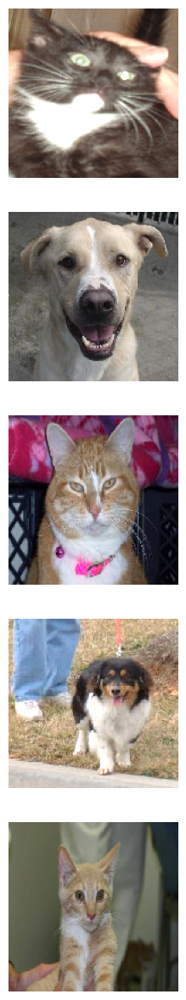

In [4]:
# 4
def plotImages(images_arr, probabilities = False):
    fig, axes = plt.subplots(len(images_arr), 1, figsize=(5,len(images_arr) * 3))
    if probabilities is False:
      for img, ax in zip( images_arr, axes):
          ax.imshow(img)
          ax.axis('off')
    else:
      for img, probability, ax in zip( images_arr, probabilities, axes):
          ax.imshow(img)
          ax.axis('off')
          if probability > 0.5:
              ax.set_title("%.2f" % (probability*100) + "% dog")
          else:
              ax.set_title("%.2f" % ((1-probability)*100) + "% cat")
    plt.show()

sample_training_images, _ = next(train_data_gen)
plotImages(sample_training_images[:5])


In [5]:
# 5
train_image_generator = ImageDataGenerator(rescale=1./225,horizontal_flip=True, vertical_flip=True, rotation_range=180, width_shift_range=5.0)


Found 2000 images belonging to 2 classes.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.03772089..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.017960187..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.026831884..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.02834835..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.021841105..1.1333333].


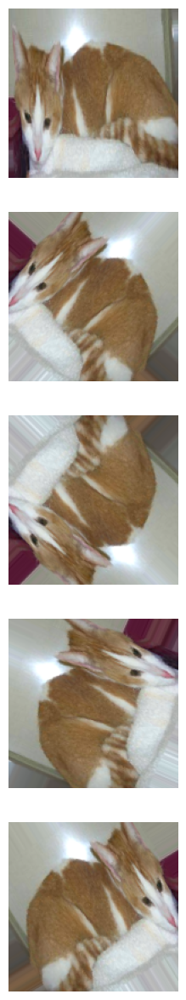

In [6]:
# 6
train_data_gen = train_image_generator.flow_from_directory(batch_size=batch_size,
                                                     directory=train_dir,
                                                     target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                     class_mode='categorical')
augmented_images = [train_data_gen[0][0][0] for i in range(5)]

plotImages(augmented_images)

In [7]:
# 7
model = Sequential()
model.add(tf.keras.layers.Conv2D(32, (5, 5), activation='relu', input_shape=(150, 150, 3)))
model.add(tf.keras.layers.MaxPooling2D(2, 2))
model.add(tf.keras.layers.Conv2D(64, (5, 5), activation='relu'))
model.add(tf.keras.layers.MaxPooling2D(2, 2))
model.add(tf.keras.layers.Conv2D(128, (5, 5), activation='relu'))
model.add(tf.keras.layers.MaxPooling2D(2, 2))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(128, activation='relu'))
model.add(tf.keras.layers.Dense(64, activation='relu'))
model.add(tf.keras.layers.Dense(2, activation='softmax'))  # Two classes



model.compile(optimizer='adam',
		loss='categorical_crossentropy',
		metrics=['accuracy'])

model.summary()

/usr/local/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
E0000 00:00:1773151171.901137    1104 cuda_platform.cc:52] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 146, 146, 32)   │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 73, 73, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 69, 69, 64)     │        51,264 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 34, 34, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 30, 30, 128)    │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 15, 15, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 28800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     3,686,528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,953,538 (15.08 MB)

 Trainable params: 3,953,538 (15.08 MB)

 Non-trainable params: 0 (0.00 B)

In [8]:
# 8
history =  model.fit(x=train_data_gen, steps_per_epoch=len(train_data_gen),epochs=epochs, validation_data=val_data_gen, validation_steps=len(val_data_gen))

Epoch 1/15


I0000 00:00:1773151173.851555    1104 generator_dataset_op.cc:213] Memory patch applied: M_TRIM_THRESHOLD=128 kb was set.


 1/16 ━━━━━━━━━━━━━━━━━━━━ 36s 2s/step - accuracy: 0.4766 - loss: 0.7181

 2/16 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - accuracy: 0.4785 - loss: 0.7222

 3/16 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - accuracy: 0.4813 - loss: 0.7527

 4/16 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - accuracy: 0.4870 - loss: 0.7603

 5/16 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.4911 - loss: 0.7612

 6/16 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.4941 - loss: 0.7599

 7/16 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.4956 - loss: 0.7577

 8/16 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.4967 - loss: 0.7552 

 9/16 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.4981 - loss: 0.7527

10/16 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.4994 - loss: 0.7504

11/16 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - accuracy: 0.5012 - loss: 0.7481

12/16 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.5018 - loss: 0.7460

13/16 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - accuracy: 0.5027 - loss: 0.7441

14/16 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - accuracy: 0.5034 - loss: 0.7423

15/16 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.5040 - loss: 0.7406

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5042 - loss: 0.7391

16/16 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.5070 - loss: 0.7159 - val_accuracy: 0.5000 - val_loss: 0.6920


Epoch 2/15


 1/16 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step - accuracy: 0.5156 - loss: 0.6922

 2/16 ━━━━━━━━━━━━━━━━━━━━ 18s 1s/step - accuracy: 0.5098 - loss: 0.6925

 3/16 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - accuracy: 0.5213 - loss: 0.6920

 4/16 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - accuracy: 0.5223 - loss: 0.6919

 5/16 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - accuracy: 0.5219 - loss: 0.6919

 6/16 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.5219 - loss: 0.6918

 7/16 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.5212 - loss: 0.6918 

 8/16 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.5198 - loss: 0.6918

 9/16 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.5189 - loss: 0.6918

10/16 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.5178 - loss: 0.6917

11/16 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - accuracy: 0.5170 - loss: 0.6917

12/16 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.5163 - loss: 0.6916

13/16 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - accuracy: 0.5157 - loss: 0.6916

14/16 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - accuracy: 0.5151 - loss: 0.6916

15/16 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.5145 - loss: 0.6916

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5141 - loss: 0.6915

16/16 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.5075 - loss: 0.6914 - val_accuracy: 0.5160 - val_loss: 0.6901


Epoch 3/15


 1/16 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step - accuracy: 0.5469 - loss: 0.6880

 2/16 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - accuracy: 0.5410 - loss: 0.6881

 3/16 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.5412 - loss: 0.6876

 4/16 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - accuracy: 0.5329 - loss: 0.6915

 5/16 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.5285 - loss: 0.6930

 6/16 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.5259 - loss: 0.6937

 7/16 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.5262 - loss: 0.6938

 8/16 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.5263 - loss: 0.6939 

 9/16 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.5266 - loss: 0.6938

10/16 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.5271 - loss: 0.6938

11/16 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - accuracy: 0.5278 - loss: 0.6937

12/16 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.5285 - loss: 0.6936

13/16 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - accuracy: 0.5291 - loss: 0.6935

14/16 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - accuracy: 0.5298 - loss: 0.6933

15/16 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.5304 - loss: 0.6932

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5312 - loss: 0.6931

16/16 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.5440 - loss: 0.6912 - val_accuracy: 0.5950 - val_loss: 0.6778


Epoch 4/15


 1/16 ━━━━━━━━━━━━━━━━━━━━ 21s 1s/step - accuracy: 0.5312 - loss: 0.6840

 2/16 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - accuracy: 0.5371 - loss: 0.6846

 3/16 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.5456 - loss: 0.6849

 4/16 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.5487 - loss: 0.6849

 5/16 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.5474 - loss: 0.6855

 6/16 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.5458 - loss: 0.6861

 7/16 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.5456 - loss: 0.6861

 8/16 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.5456 - loss: 0.6862 

 9/16 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.5465 - loss: 0.6860

10/16 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.5468 - loss: 0.6857

11/16 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - accuracy: 0.5477 - loss: 0.6854

12/16 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.5484 - loss: 0.6852

13/16 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - accuracy: 0.5491 - loss: 0.6850

14/16 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - accuracy: 0.5503 - loss: 0.6846

15/16 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.5509 - loss: 0.6844

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5515 - loss: 0.6842

16/16 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.5610 - loss: 0.6808 - val_accuracy: 0.5710 - val_loss: 0.6741


Epoch 5/15


 1/16 ━━━━━━━━━━━━━━━━━━━━ 21s 1s/step - accuracy: 0.5938 - loss: 0.6778

 2/16 ━━━━━━━━━━━━━━━━━━━━ 17s 1s/step - accuracy: 0.5918 - loss: 0.6779

 3/16 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.5872 - loss: 0.6784

 4/16 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.5886 - loss: 0.6777

 5/16 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.5908 - loss: 0.6767

 6/16 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.5930 - loss: 0.6756

 7/16 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.5949 - loss: 0.6740

 8/16 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.5956 - loss: 0.6732 

 9/16 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.5965 - loss: 0.6723

10/16 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.5967 - loss: 0.6718

11/16 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - accuracy: 0.5971 - loss: 0.6713

12/16 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.5971 - loss: 0.6710

13/16 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - accuracy: 0.5966 - loss: 0.6710

14/16 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - accuracy: 0.5960 - loss: 0.6710

15/16 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.5953 - loss: 0.6711

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5943 - loss: 0.6714

16/16 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.5790 - loss: 0.6753 - val_accuracy: 0.6230 - val_loss: 0.6525


Epoch 6/15


 1/16 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - accuracy: 0.5859 - loss: 0.6729

 2/16 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.6035 - loss: 0.6740

 3/16 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - accuracy: 0.6046 - loss: 0.6737

 4/16 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.6053 - loss: 0.6736

 5/16 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.6049 - loss: 0.6731

 6/16 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.6054 - loss: 0.6725

 7/16 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.6066 - loss: 0.6715 

 8/16 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.6065 - loss: 0.6711

 9/16 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.6059 - loss: 0.6710

10/16 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.6051 - loss: 0.6711

11/16 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - accuracy: 0.6042 - loss: 0.6713

12/16 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.6035 - loss: 0.6714

13/16 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - accuracy: 0.6022 - loss: 0.6717

14/16 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - accuracy: 0.6008 - loss: 0.6720

15/16 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.5995 - loss: 0.6723

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5985 - loss: 0.6725

16/16 ━━━━━━━━━━━━━━━━━━━━ 23s 1s/step - accuracy: 0.5830 - loss: 0.6759 - val_accuracy: 0.5260 - val_loss: 0.6884


Epoch 7/15


 1/16 ━━━━━━━━━━━━━━━━━━━━ 18s 1s/step - accuracy: 0.5312 - loss: 0.6859

 2/16 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.5312 - loss: 0.6836

 3/16 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - accuracy: 0.5373 - loss: 0.6819

 4/16 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - accuracy: 0.5412 - loss: 0.6817

 5/16 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.5451 - loss: 0.6808

 6/16 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.5491 - loss: 0.6796

 7/16 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.5529 - loss: 0.6786

 8/16 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.5565 - loss: 0.6777 

 9/16 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.5583 - loss: 0.6781

10/16 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.5603 - loss: 0.6778

11/16 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - accuracy: 0.5619 - loss: 0.6776

12/16 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.5636 - loss: 0.6773

13/16 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - accuracy: 0.5648 - loss: 0.6771

14/16 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - accuracy: 0.5657 - loss: 0.6770

15/16 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.5664 - loss: 0.6768

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5669 - loss: 0.6768

16/16 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step - accuracy: 0.5745 - loss: 0.6760 - val_accuracy: 0.5620 - val_loss: 0.6775


Epoch 8/15


 1/16 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step - accuracy: 0.5938 - loss: 0.6773

 2/16 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - accuracy: 0.5957 - loss: 0.6752

 3/16 ━━━━━━━━━━━━━━━━━━━━ 12s 944ms/step - accuracy: 0.5886 - loss: 0.6757

 4/16 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.5762 - loss: 0.6786   

 5/16 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.5724 - loss: 0.6798

 6/16 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.5701 - loss: 0.6807

 7/16 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.5698 - loss: 0.6812

 8/16 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.5710 - loss: 0.6814 

 9/16 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.5719 - loss: 0.6815

10/16 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.5731 - loss: 0.6814

11/16 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - accuracy: 0.5740 - loss: 0.6813

12/16 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.5750 - loss: 0.6812

13/16 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - accuracy: 0.5760 - loss: 0.6810

14/16 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - accuracy: 0.5769 - loss: 0.6808

15/16 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.5776 - loss: 0.6806

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5784 - loss: 0.6803

16/16 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.5905 - loss: 0.6762 - val_accuracy: 0.6050 - val_loss: 0.6618


Epoch 9/15


 1/16 ━━━━━━━━━━━━━━━━━━━━ 21s 1s/step - accuracy: 0.5703 - loss: 0.6644

 2/16 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - accuracy: 0.5820 - loss: 0.6618

 3/16 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.5842 - loss: 0.6638

 4/16 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - accuracy: 0.5861 - loss: 0.6648

 5/16 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - accuracy: 0.5889 - loss: 0.6641

 6/16 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.5912 - loss: 0.6638

 7/16 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.5949 - loss: 0.6626

 8/16 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.5975 - loss: 0.6616 

 9/16 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.6002 - loss: 0.6608

10/16 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.6024 - loss: 0.6603

11/16 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - accuracy: 0.6044 - loss: 0.6599

12/16 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.6059 - loss: 0.6594

13/16 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - accuracy: 0.6071 - loss: 0.6591

14/16 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - accuracy: 0.6082 - loss: 0.6589

15/16 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.6092 - loss: 0.6586

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6100 - loss: 0.6584

16/16 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step - accuracy: 0.6220 - loss: 0.6549 - val_accuracy: 0.6280 - val_loss: 0.6415


Epoch 10/15


 1/16 ━━━━━━━━━━━━━━━━━━━━ 19s 1s/step - accuracy: 0.6797 - loss: 0.6212

 2/16 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - accuracy: 0.6523 - loss: 0.6300

 3/16 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.6493 - loss: 0.6285

 4/16 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - accuracy: 0.6471 - loss: 0.6279

 5/16 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step - accuracy: 0.6483 - loss: 0.6259

 6/16 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.6464 - loss: 0.6277

 7/16 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.6448 - loss: 0.6284

 8/16 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.6430 - loss: 0.6296 

 9/16 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.6417 - loss: 0.6306

10/16 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.6405 - loss: 0.6319

11/16 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - accuracy: 0.6394 - loss: 0.6330

12/16 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.6383 - loss: 0.6341

13/16 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - accuracy: 0.6376 - loss: 0.6349

14/16 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - accuracy: 0.6369 - loss: 0.6357

15/16 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.6366 - loss: 0.6361

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6363 - loss: 0.6365

16/16 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step - accuracy: 0.6310 - loss: 0.6421 - val_accuracy: 0.6320 - val_loss: 0.6574


Epoch 11/15


 1/16 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step - accuracy: 0.6406 - loss: 0.6315

 2/16 ━━━━━━━━━━━━━━━━━━━━ 17s 1s/step - accuracy: 0.6562 - loss: 0.6195

 3/16 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.6528 - loss: 0.6202

 4/16 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.6545 - loss: 0.6209

 5/16 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.6526 - loss: 0.6254

 6/16 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.6501 - loss: 0.6287

 7/16 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.6495 - loss: 0.6304

 8/16 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.6483 - loss: 0.6316 

 9/16 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.6460 - loss: 0.6332

10/16 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.6440 - loss: 0.6347

11/16 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - accuracy: 0.6422 - loss: 0.6360

12/16 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.6411 - loss: 0.6370

13/16 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - accuracy: 0.6404 - loss: 0.6375

14/16 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - accuracy: 0.6398 - loss: 0.6380

15/16 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.6390 - loss: 0.6385

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6387 - loss: 0.6388

16/16 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step - accuracy: 0.6335 - loss: 0.6434 - val_accuracy: 0.6140 - val_loss: 0.6551


Epoch 12/15


 1/16 ━━━━━━━━━━━━━━━━━━━━ 20s 1s/step - accuracy: 0.6797 - loss: 0.6123

 2/16 ━━━━━━━━━━━━━━━━━━━━ 17s 1s/step - accuracy: 0.6641 - loss: 0.6212

 3/16 ━━━━━━━━━━━━━━━━━━━━ 15s 1s/step - accuracy: 0.6562 - loss: 0.6255

 4/16 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - accuracy: 0.6490 - loss: 0.6291

 5/16 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.6455 - loss: 0.6319

 6/16 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.6407 - loss: 0.6351

 7/16 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.6373 - loss: 0.6373 

 8/16 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.6333 - loss: 0.6399

 9/16 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.6310 - loss: 0.6413

10/16 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.6293 - loss: 0.6423

11/16 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - accuracy: 0.6278 - loss: 0.6433

12/16 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.6261 - loss: 0.6442

13/16 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - accuracy: 0.6253 - loss: 0.6446

14/16 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - accuracy: 0.6245 - loss: 0.6452

15/16 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.6239 - loss: 0.6457

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6235 - loss: 0.6461

16/16 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step - accuracy: 0.6180 - loss: 0.6518 - val_accuracy: 0.6290 - val_loss: 0.6520


Epoch 13/15


 1/16 ━━━━━━━━━━━━━━━━━━━━ 17s 1s/step - accuracy: 0.5703 - loss: 0.6645

 2/16 ━━━━━━━━━━━━━━━━━━━━ 13s 933ms/step - accuracy: 0.5879 - loss: 0.6601

 3/16 ━━━━━━━━━━━━━━━━━━━━ 9s 734ms/step - accuracy: 0.5963 - loss: 0.6570 

 4/16 ━━━━━━━━━━━━━━━━━━━━ 10s 835ms/step - accuracy: 0.6056 - loss: 0.6543

 5/16 ━━━━━━━━━━━━━━━━━━━━ 9s 881ms/step - accuracy: 0.6139 - loss: 0.6511 

 6/16 ━━━━━━━━━━━━━━━━━━━━ 9s 902ms/step - accuracy: 0.6178 - loss: 0.6502

 7/16 ━━━━━━━━━━━━━━━━━━━━ 8s 919ms/step - accuracy: 0.6226 - loss: 0.6489

 8/16 ━━━━━━━━━━━━━━━━━━━━ 7s 929ms/step - accuracy: 0.6252 - loss: 0.6484

 9/16 ━━━━━━━━━━━━━━━━━━━━ 6s 946ms/step - accuracy: 0.6271 - loss: 0.6480

10/16 ━━━━━━━━━━━━━━━━━━━━ 5s 954ms/step - accuracy: 0.6274 - loss: 0.6478

11/16 ━━━━━━━━━━━━━━━━━━━━ 4s 965ms/step - accuracy: 0.6279 - loss: 0.6475

12/16 ━━━━━━━━━━━━━━━━━━━━ 3s 966ms/step - accuracy: 0.6277 - loss: 0.6476

13/16 ━━━━━━━━━━━━━━━━━━━━ 2s 975ms/step - accuracy: 0.6275 - loss: 0.6476

14/16 ━━━━━━━━━━━━━━━━━━━━ 1s 972ms/step - accuracy: 0.6272 - loss: 0.6476

15/16 ━━━━━━━━━━━━━━━━━━━━ 0s 977ms/step - accuracy: 0.6270 - loss: 0.6475

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 970ms/step - accuracy: 0.6270 - loss: 0.6473

16/16 ━━━━━━━━━━━━━━━━━━━━ 21s 1s/step - accuracy: 0.6275 - loss: 0.6437 - val_accuracy: 0.6480 - val_loss: 0.6382


Epoch 14/15


 1/16 ━━━━━━━━━━━━━━━━━━━━ 17s 1s/step - accuracy: 0.6484 - loss: 0.6371

 2/16 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - accuracy: 0.6504 - loss: 0.6312

 3/16 ━━━━━━━━━━━━━━━━━━━━ 12s 991ms/step - accuracy: 0.6541 - loss: 0.6292

 4/16 ━━━━━━━━━━━━━━━━━━━━ 11s 1000ms/step - accuracy: 0.6571 - loss: 0.6273

 5/16 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - accuracy: 0.6585 - loss: 0.6263    

 6/16 ━━━━━━━━━━━━━━━━━━━━ 10s 1s/step - accuracy: 0.6581 - loss: 0.6267

 7/16 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.6583 - loss: 0.6266 

 8/16 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.6579 - loss: 0.6275

 9/16 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.6577 - loss: 0.6287

10/16 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.6582 - loss: 0.6291

11/16 ━━━━━━━━━━━━━━━━━━━━ 5s 1s/step - accuracy: 0.6582 - loss: 0.6296

12/16 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.6586 - loss: 0.6299

13/16 ━━━━━━━━━━━━━━━━━━━━ 3s 1s/step - accuracy: 0.6593 - loss: 0.6298

14/16 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step - accuracy: 0.6602 - loss: 0.6295

15/16 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.6609 - loss: 0.6294

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 987ms/step - accuracy: 0.6613 - loss: 0.6293

16/16 ━━━━━━━━━━━━━━━━━━━━ 21s 1s/step - accuracy: 0.6665 - loss: 0.6282 - val_accuracy: 0.6500 - val_loss: 0.6205


Epoch 15/15


 1/16 ━━━━━━━━━━━━━━━━━━━━ 17s 1s/step - accuracy: 0.6641 - loss: 0.6297

 2/16 ━━━━━━━━━━━━━━━━━━━━ 14s 1s/step - accuracy: 0.6602 - loss: 0.6269

 3/16 ━━━━━━━━━━━━━━━━━━━━ 12s 978ms/step - accuracy: 0.6641 - loss: 0.6250

 4/16 ━━━━━━━━━━━━━━━━━━━━ 11s 988ms/step - accuracy: 0.6675 - loss: 0.6241

 5/16 ━━━━━━━━━━━━━━━━━━━━ 10s 994ms/step - accuracy: 0.6727 - loss: 0.6197

 6/16 ━━━━━━━━━━━━━━━━━━━━ 9s 996ms/step - accuracy: 0.6758 - loss: 0.6173 

 7/16 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.6781 - loss: 0.6151   

 8/16 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.6792 - loss: 0.6139

 9/16 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - accuracy: 0.6795 - loss: 0.6135

10/16 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - accuracy: 0.6796 - loss: 0.6135

11/16 ━━━━━━━━━━━━━━━━━━━━ 4s 977ms/step - accuracy: 0.6793 - loss: 0.6134

12/16 ━━━━━━━━━━━━━━━━━━━━ 3s 988ms/step - accuracy: 0.6790 - loss: 0.6134

13/16 ━━━━━━━━━━━━━━━━━━━━ 2s 989ms/step - accuracy: 0.6785 - loss: 0.6136

14/16 ━━━━━━━━━━━━━━━━━━━━ 1s 992ms/step - accuracy: 0.6780 - loss: 0.6140

15/16 ━━━━━━━━━━━━━━━━━━━━ 0s 992ms/step - accuracy: 0.6776 - loss: 0.6143

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 987ms/step - accuracy: 0.6773 - loss: 0.6146

16/16 ━━━━━━━━━━━━━━━━━━━━ 21s 1s/step - accuracy: 0.6715 - loss: 0.6187 - val_accuracy: 0.6620 - val_loss: 0.6208


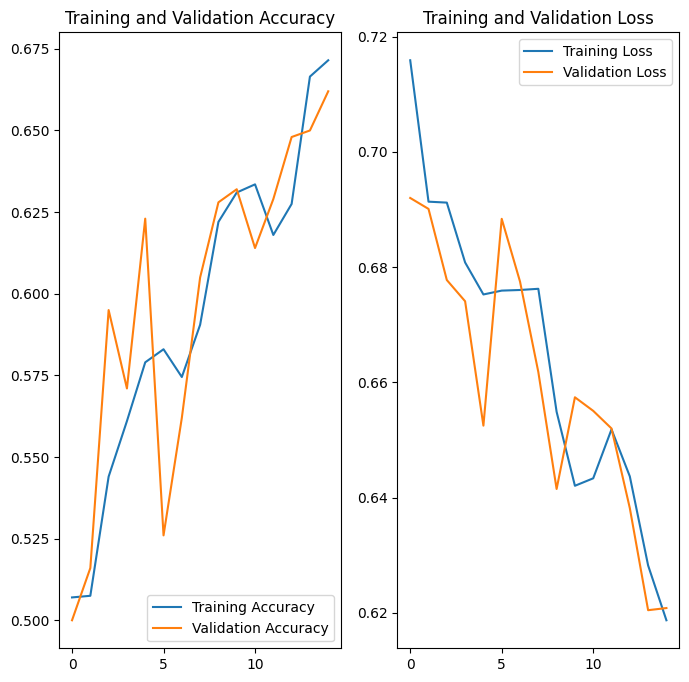

In [9]:
# 9
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [10]:
print(len(val_data_gen))
predictions=model.predict(val_data_gen)
probabilities = (predictions * 100).astype(int).flatten()

8


1/8 ━━━━━━━━━━━━━━━━━━━━ 5s 737ms/step

2/8 ━━━━━━━━━━━━━━━━━━━━ 3s 629ms/step

3/8 ━━━━━━━━━━━━━━━━━━━━ 3s 627ms/step

4/8 ━━━━━━━━━━━━━━━━━━━━ 2s 640ms/step

5/8 ━━━━━━━━━━━━━━━━━━━━ 1s 642ms/step

6/8 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step

7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 649ms/step

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 634ms/step

8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 635ms/step


1/8 ━━━━━━━━━━━━━━━━━━━━ 5s 727ms/step

2/8 ━━━━━━━━━━━━━━━━━━━━ 4s 709ms/step

3/8 ━━━━━━━━━━━━━━━━━━━━ 3s 697ms/step

4/8 ━━━━━━━━━━━━━━━━━━━━ 2s 748ms/step

5/8 ━━━━━━━━━━━━━━━━━━━━ 2s 756ms/step

6/8 ━━━━━━━━━━━━━━━━━━━━ 1s 751ms/step

7/8 ━━━━━━━━━━━━━━━━━━━━ 0s 746ms/step

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 722ms/step

8/8 ━━━━━━━━━━━━━━━━━━━━ 6s 723ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.128889].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.008888889..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.022222223..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.097777784..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.008888889..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.08].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.16..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.013333334..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.057777777..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1155555].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0711111].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.013333334..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.013333334..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.008888889..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.053333335..1.0666667].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.14666668..1.0044445].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.017777778..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0133333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.008888889..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0222223].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1155555].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.013333334..1.0266666].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1066667].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.026666667..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.062222224..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0977778].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.017777778..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0933334].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.08444445..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.013333334..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.026666667..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0044444446..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0044444446..1.1022222].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04..1.0577778].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0622222].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.11111111..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.026666667..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.15555556..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1333333].


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0222223].


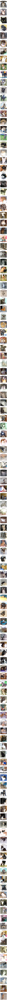

In [11]:
test_images, _ = next(val_data_gen)
probabilities = np.argmax(model.predict(val_data_gen), axis=-1)
plotImages(test_images, probabilities=probabilities)

In [12]:
# 11
answers =  [1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0,
            1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0,
            1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1,
            1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1,
            0, 0, 0, 0, 0, 0]

correct = 0

for probability, answer in zip(probabilities, answers):
  if round(probability) == answer:
    correct +=1

percentage_identified = (correct / len(answers)) * 100

passed_challenge = percentage_identified >= 63

print(f"Your model correctly identified {round(percentage_identified, 2)}% of the images of cats and dogs.")

if passed_challenge:
  print("You passed the challenge!")
else:
  print("You haven't passed yet. Your model should identify at least 63% of the images. Keep trying. You will get it!")

Your model correctly identified 54.0% of the images of cats and dogs.
You haven't passed yet. Your model should identify at least 63% of the images. Keep trying. You will get it!
